In [1]:
import sys
import time
import datetime
import os
import random

import numpy as np
import pandas as pd

from ordered_set import OrderedSet

from scipy import stats
import statsmodels.stats.weightstats as smws

from bokeh.plotting import figure, output_file, save
import seaborn as sns

from cycler import cycler

%matplotlib notebook
import matplotlib.pyplot as plt

# Functions

## reading data from .xlsx files

In [2]:
def readFile(ID, GR, testMode = False):
    try:
        if testMode:
            start = time.perf_counter()
            
        path = os.path.join(os.getcwd(),'MergedData/')
        fileName = str(ID) + "-" + str(GR) + ".xlsx"
        pathToData = os.path.join(path, fileName)
        
        data = pd.read_excel(pathToData, index_col=0, sheet_name = None)
        
        if testMode:
            print(f"readFile in {time.perf_counter() - start}s for participant {ID} group {GR}")
        
        return data
    except Exception as e:
        print("error in readFile")
        print(e)

In [3]:
def readAllData(participantsDict, testMode = False):
    try:
        if testMode:
            start = time.perf_counter()
        
        listOfDataFrames = []
        
        for key, value in participantsDict.items():
       
            listOfDataFrames.append(readFile(key, value))
        
        if testMode or fullTestMode:
            print(f"\nreadAllData in {time.perf_counter() - start}s")
            
        return listOfDataFrames

    except Exception as e:
        print("error in readAllData")
        print(e)

## Identifying indexes for phases

In [4]:
def getIndexForPhase(experimentDataList, testMode = False, showGraphs = True):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter() 
            showGraphs = True           
        
        breakLengths = []
        for dataDictionary in experimentDataList:

            firstInd = True
            secInd = False
            thirdInd = False
            fourthInd = False
            fifthInd = False

            adaptationPEphase = ()
            instructionPhase = ()
            breakPhase = ()
            adaptationVEphase = ()
            
            phaseStart = 0
            phaseEnd = 0

            i = 0
            for item in dataDictionary['Experiment_Data'].itertuples():
                if firstInd and item[3] == 'adaptation PE':
                    firstInd = False
                    phaseStart = i
                    secInd = True
                elif secInd and item[3] != 'adaptation PE' and item[18] == 'Audio_1' :
                    secInd = False
                    adaptationPEphase = (phaseStart, i-1)
                    phaseStart = i
                    thirdInd = True
                elif thirdInd and item[18] != 'Audio_1': 
                    #2ms difference in break start and audioClip playing caused an error here for sample 30 
                    thirdInd = False
                    instructionPhase = (phaseStart, i-1)
                    phaseStart = i
                    fourthInd = True
                elif fourthInd and item[3] != 'break':
                    fourthInd = False
                    breakPhase = (phaseStart, i - 1)
                    phaseStart = i
                    fifthInd = True
                elif fifthInd and item[3] != 'adaptation VE':
                    adaptationVEphase = (phaseStart, i - 1)
                    break
                i += 1
            dataDictionary['phases'] = adaptationPEphase, instructionPhase, breakPhase, adaptationVEphase
            
            breakLengths.append(breakPhase)
            
            if testMode:
                print(f"adaptationPEphase : {adaptationPEphase}")
                print(f"instructionPhase : {instructionPhase}")
                print(f"breakPhase : {breakPhase}")
                print(f"adaptationVEphase : {adaptationVEphase}")
                print('_' * 100 + '1')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[0]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[0]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[0]+1])
                print("to")
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[1]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[1]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationPEphase[1]+1])
                print('_' * 100+ '2')
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[0]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[0]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[0]+1])
                print("to")
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[1]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[1]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[instructionPhase[1]+1])
                print('_' * 100+ '3')
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[0]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[0]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[0]+1])
                print("to")
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[1]-1])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[1]])
                print(dataDictionary['Experiment_Data']['Audio_clip'].iloc[breakPhase[1]+1])
                print('_' * 100+ '4')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[0]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[0]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[0]+1])
                print('to')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[1]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[1]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[breakPhase[1]+1])
                print('_' * 100+ '5')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[0]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[0]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[0]+1])
                print('to')
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[1]-1])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[1]])
                print(dataDictionary['Experiment_Data']['Phase'].iloc[adaptationVEphase[1]+1])
                print('_' * 100)

        if testMode:    
            print('_'*100)
            print(breakLengths)
            print('_'*100)
        breakLengths = [tup[1] - tup[0] for tup in breakLengths]
        breakLengths.sort()
        
        if testMode:
            print(breakLengths)
            print('_'*100)
            print(breakLengths[0])
            print('_'*100)
            print(breakLengths[-1])
            print('_'*100)

        converterToSeconds = lambda ms : divmod(ms,100)
        breakPhaseConverted = []

        for ms in breakLengths:
            s = converterToSeconds(ms)
            breakPhaseConverted.append(f"{s[0]}''.{s[1]}")
        
        
        breakLengths = [item/100 for item in breakLengths]
        if testMode or fullTestMode:
            print('_'*100)
            print(f'Shortest break : {breakLengths[0]}')
            print(f'Longest break : {breakLengths[-1]}')
            print('_'*80)
            print(f'Mean break length : {np.mean(breakLengths)}')
            print(f'SD break length : {np.std(breakLengths, ddof = 1)}')
            print('_'*40)
            print(f'Median break length : {np.median(breakLengths)}')
            print(f'Q1 and Q3 break : {np.quantile(breakLengths,[.25,.75])}')
        
        if showGraphs:
            fig6, ax6 = plt.subplots(figsize=(8, 8))
            ax6.boxplot(breakLengths, notch = True, vert = True, labels = ['Length of break stage'])
            ax6.yaxis.grid(True)
            ax6.set_ylabel('seconds')
            ax6.set_title('Length of break stage')

            ax6.set_prop_cycle(color=['red'])
            fig6.show()

            fig7, ax7 = plt.subplots(figsize=(8, 8))
            ax7.hist(breakLengths, 40)
            ax7.axvline(x = np.mean(breakLengths), c = 'r', 
                        label = 'Mean of break lengths')
            ax7.axvline(x = np.mean(breakLengths) + np.std(breakLengths, ddof = 1), c = 'r', ls = '--',
                        label = '+ 1 SD')
            ax7.axvline(x = np.mean(breakLengths) - np.std(breakLengths, ddof = 1), c = 'r', ls = '--',
                        label = '-1 SD')
            ax7.set_ylabel('samples')
            ax7.xaxis.grid(True)
            ax7.set_xlabel('seconds')
            ax7.set_title('Length of break stage distribution')
            plt.legend(['Mean of break lengths','+ 1 SD','-1 SD'])
            fig7.show()
        
        if testMode or fullTestMode:
            print(f"\ngetIndexForPhase in {time.perf_counter() - start}s")

        return experimentDataList
    except Exception as e:
        print("error in getIndexForPhase")
        print(e)

## Calculating sample age parameters

In [5]:
def calculateMeanAge(experimentDataList, testMode = False, showGraphs = True):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            showGraphs = True
            
        malesAge = []
        femalesAge = []
        
        for item in experimentDataList:
            if item['Participant_Data'][0].get('Gender') == 0:
                malesAge.append(int(item['Participant_Data'][0].get('Age')))
            else:
                femalesAge.append(int(item['Participant_Data'][0].get('Age')))
        ageList = [*malesAge, *femalesAge]
        
        sampleAgeData = (np.mean(ageList), np.std(ageList, ddof = 1), np.median(ageList), len(ageList)) 
        sampleFemaleAgeData = (np.mean(femalesAge),
                               np.std(femalesAge,
                                      ddof = 1),
                               np.median(femalesAge),
                               len(femalesAge)) 
        sampleMaleAgeData = (np.mean(malesAge),
                             np.std(malesAge,
                                    ddof = 1),
                             np.median(malesAge),
                             len(malesAge)) 
        
        if testMode or fullTestMode:
            print(f"Average participant age : {sampleAgeData[0]}")
            print(f"Standard deviation of participant age : {sampleAgeData[1]}")
            print(f"Median of participant age : {sampleAgeData[2]}")
            print(f'N = {sampleAgeData[3]}')

            print('_'*80)
            print(f'Mean female age : {sampleFemaleAgeData[0]}')
            print(f"Standard deviation of female age : {sampleFemaleAgeData[1]}")
            print(f"Median of female age : {sampleFemaleAgeData[2]}")
            print(f'N = {sampleFemaleAgeData[3]}')

            print(f'\nMean male age : {sampleMaleAgeData[0]}')
            print(f"Standard deviation of male age : {sampleMaleAgeData[1]}")
            print(f"Median of male age : {sampleMaleAgeData[2]}")
            print(f'N = {sampleMaleAgeData[3]}')

        l1 = [i for i in range(1, len(femalesAge)+1)]
        l2 = ['Mean','Standard Deviation', 'Median', 'N']
        dfIndex = [*l1,* l2]
        
        ageDF = pd.DataFrame(columns = ['Females Age', 'Males Age', 'Average'], index = dfIndex)
        ageDF['Females age'] = [*femalesAge, *list(sampleFemaleAgeData)]
        ageDF['Males age'] = [*malesAge, *list(sampleMaleAgeData)]
        
        l3 = ['-' for i in range(1, len(femalesAge)+1)]
        ageDF['Average age'] = [*l3, *list(sampleAgeData)]
        
        # on one plot:
        if showGraphs:
            allAgeData = [femalesAge, ageList, malesAge]
            labels = ['Female age', 'Average age', 'Male age']
            fig1, ax1 = plt.subplots(figsize=(8, 8))
            ax1.boxplot(allAgeData, notch=False, vert = True, patch_artist = True, labels = labels)
            ax1.yaxis.grid(True)
            ax1.set_ylabel('age')
            ax1.set_title('Participants age')

            fig1.show()
        if testMode or fullTestMode:
            print(f"\ncalculateMeanAge in {time.perf_counter() - start}s")
        
        return ageDF
            
    except Exception as e:
        print('error in calculateMeanAge')
        print(e)

## Testing proportion of missing Heart Rate data in the sample

In [6]:
def testingHRQualityPerSample(experimentDataList, showGraphs = True, testMode = False):
    """
    Checking number of -1 in sample 'PPG_to_HR_CONSENSYS'
    Total and phase wise
    """
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            showGraphs = True
            
        totalNa1all = []
        totalNa2all = []
        totalNa3all = []
        totalNa4all = []
        totalNaTotalAll = []
        
        total1all = []
        total2all = []
        total3all = []
        total4all = []
        totalTotalAll = []
        
        for item in experimentDataList:
            
            totalNa1 = 0
            totalNa2 = 0
            totalNa3 = 0
            totalNa4 = 0
            totalNaAll = 0
            
            total1 = 0
            total2 = 0
            total3 = 0
            total4 = 0
            totalAll = 0
            
            if testMode:
                ID = int(item['Participant_Data'][0].get('ID'))
                if ID > 9:
                    ID = f'00{ID}'
                elif ID > 99:
                    ID = 'f0{ID}'
                elif ID > 999:
                    ID = 'f{ID}'
                else:
                    ID = f'000{ID}'
                print(ID)
                
            totalNaInSample = 0
            
            totalNaInAdaptationPEphase = 0
            totalNaInInstructionPhase = 0
            totalNaInBreakPhase = 0
            totalNaInAdaptationVEphase = 0
            
            start1 = item['phases'][0][0]
            end1 = item['phases'][0][1]
            start2 = item['phases'][1][0]
            end2 = item['phases'][1][1]
            start3 = item['phases'][2][0]
            end3 = item['phases'][2][1]
            start4 = item['phases'][3][0]
            end4 = item['phases'][3][1]
            
            i = 0
            for val in item['Experiment_Data']['PPG_to_HR_CONSENSYS']:                   
                if val == -1:
                    totalNaInSample += 1
                    if i < end1:
                        totalNaInAdaptationPEphase += 1
                    elif i < end2:
                        totalNaInInstructionPhase += 1
                    elif i < end3:
                        totalNaInBreakPhase += 1
                    elif i < end4:
                        totalNaInAdaptationVEphase += 1
                i += 1
                        
            totalRows = len(item['Experiment_Data']['PPG_to_HR_CONSENSYS'])
            
            if testMode:
                print(f"\nstart1 : {start1} | end1 : {end1}")
                print(f"start2 : {start2} | end2 : {end2}")
                print(f"start3 : {start3} | end3 : {end3}")
                print(f"start4 : {start4} | end4 : {end4}")
           
            totalRowsInAdaptationPEphase = end1 - start1 +1
            totalRowsInInstructionPhase = end2 - start2 +1
            totalRowsInBreakPhase = end3 - start3 +1
            totalRowsInAdaptationVEphase = end4 - start4 +1
            
            if testMode:
                print(f"\ntotalRows : {totalRows}")
                print(f"totalRowsInAdaptationPEphase : {totalRowsInAdaptationPEphase}")
                print(f"totalRowsInInstructionPhase : {totalRowsInInstructionPhase}")
                print(f"totalRowsInBreakPhase : {totalRowsInBreakPhase}")
                print(f"totalRowsInAdaptationVEphase : {totalRowsInAdaptationVEphase}")

            toAppendInAdaptationPEphase = (totalNaInAdaptationPEphase,
                                           totalRowsInAdaptationPEphase,
                                           totalNaInAdaptationPEphase/totalRowsInAdaptationPEphase)
            
            totalNa1all.append(totalNaInAdaptationPEphase)
            total1all.append(totalRowsInAdaptationPEphase)
            
            toAppendInInstructionPhase = (totalNaInInstructionPhase,                                           
                                          totalRowsInInstructionPhase,
                                          totalNaInInstructionPhase/totalRowsInInstructionPhase)
            
            totalNa2all.append(totalNaInInstructionPhase)
            total2all.append(totalRowsInInstructionPhase)
            
            toAppendInBreakPhase = (totalNaInBreakPhase,
                                    totalRowsInBreakPhase,
                                    totalNaInBreakPhase/totalRowsInBreakPhase)
            
            totalNa3all.append(totalNaInBreakPhase)
            total3all.append(totalRowsInBreakPhase)
            
            toAppendInAdaptationVEphase = (totalNaInAdaptationVEphase,
                                           totalRowsInAdaptationVEphase,
                                           totalNaInAdaptationVEphase/totalRowsInAdaptationVEphase)
            
            totalNa4all.append(totalNaInAdaptationVEphase)
            total4all.append(totalRowsInAdaptationVEphase)
            
            if testMode:
                print(f'\ntoAppendInAdaptationPEphase : {toAppendInAdaptationPEphase}')
                print(f'toAppendInInstructionPhase : {toAppendInInstructionPhase}')
                print(f'toAppendInBreakPhase : {toAppendInBreakPhase}')
                print(f'toAppendInAdaptationVEphase : {toAppendInAdaptationVEphase}')
            
            toAppendTotal = (totalNaInSample,
                             totalRows, 
                             totalNaInSample/totalRows)
            
            totalNaTotalAll.append(totalNaInSample)
            totalTotalAll.append(totalRows)
            
            toAppend = {}
            toAppend['adaptation PE phase'] = toAppendInAdaptationPEphase
            toAppend['instruction phase'] = toAppendInInstructionPhase
            toAppend['break phase'] = toAppendInBreakPhase
            toAppend['adaptation VE phase'] = toAppendInAdaptationVEphase
            toAppend['total'] = toAppendTotal
            
            if testMode:
                print(f"\ntoAppend for participant {ID} :\n {toAppend}")
                print('_'*100)
                        
            item['Missing_HR'] = toAppend

            totalNa1 += totalNaInAdaptationPEphase
            totalNa2 += totalNaInInstructionPhase
            totalNa3 += totalNaInBreakPhase
            totalNa4 += totalNaInAdaptationVEphase
            totalNaAll += totalNaInSample
            total1 += totalRowsInAdaptationPEphase
            total2 += totalRowsInInstructionPhase
            total3 += totalRowsInBreakPhase
            total4 += totalRowsInAdaptationVEphase
            totalAll += totalRows
                
        if testMode or fullTestMode:
                        
            totalErrors = (totalNa1/total1,
                           totalNa2/total2,
                           totalNa3/total3,
                           total4,
                           totalNa4/total4,
                           totalNaAll/totalAll)
            
            allResults = {}
            allResults['total adaptation PE phase'] = (totalNa1, total1, totalErrors[0])
            allResults['total instruction phase'] = (totalNa2, total2, totalErrors[1])
            allResults['total break phase'] = (totalNa3, total3, totalErrors[2])
            allResults['total adaptation VE phase'] = (totalNa4, totalErrors[3])
            allResults['total mean'] = (totalNaAll, totalAll, totalErrors[4])
            
            if testMode:
                print('='*100)
                print(allResults)
                      
            
            allPhaseErrorData = [[na / total for na, total in zip(totalNa1all, total1all)],
                                 [na / total for na, total in zip(totalNa2all, total2all)],
                                 [na / total for na, total in zip(totalNa3all, total3all)],
                                 [na / total for na, total in zip(totalNa4all, total4all)],
                                 [na / total for na, total in zip(totalNaTotalAll, totalTotalAll)]]
            
            if testMode:
                print('_'*200)
                print('allPhaseErrorData')
                print(allPhaseErrorData)
            
            labels = ['Physical Environment', 'Instruction', 'Break', 'Virtual Replica Environment']
            if showGraphs:
                fig4, ax4 = plt.subplots(figsize=(8, 8))
                ax4.boxplot(allPhaseErrorData[0:4], notch=True, vert = True, patch_artist = True, labels = labels)
                ax4.yaxis.grid(True)
                ax4.set_ylabel('Interpolated HR')
                ax4.set_title('Per phase error distribution')

                ax4.set_prop_cycle(color=['red', 'green', 'blue','yellow'])
                fig4.show()

                fig5, ax5 = plt.subplots(figsize=(8, 8))
                ax5.boxplot(allPhaseErrorData[4],
                            notch=True,
                            vert = True,
                            labels = ['Total error'])
                ax5.yaxis.grid(True)
                ax5.set_ylabel('Interpolated HR')
                ax5.set_title('Total error distribution')

                ax5.set_prop_cycle(color=['red'])
                fig5.show()
            
            if testMode or fullTestMode:
                print('-'*80)
                print(f'mean : {np.mean(allPhaseErrorData[4])}')
                print(f'median : {np.median(allPhaseErrorData[4])}')
                print(f'SD : {np.std(allPhaseErrorData[4], ddof = 1)}')
                print(f'Q1 and Q3 : {np.quantile(allPhaseErrorData[4],[.25,.75])}')
                for i in range(4):
                    print('-'*50)
                    print(f'mean for phase {labels[i]} : {np.mean(allPhaseErrorData[i])}')
                    print(f'median for phase {labels[i]} : {np.median(allPhaseErrorData[i])}')
                    print(f'SD for phase {labels[i]} : {np.std(allPhaseErrorData[i], ddof = 1)}')
                    print(f'Q1 and Q3 for phase {labels[i]} : {np.quantile(allPhaseErrorData[i],[.25,.75])}')
                    
                print(f"\ntestingHRQualityPerSample in {time.perf_counter() - start}s")
            
        return experimentDataList

    except Exception as e:
        print("error in testingHRQualityPerSample")
        print(e)

## Plot signals

In [31]:
def plotSignals(experimentDataListProcessed, testMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()

        phases = ['Physical Environment', 'Instruction', 'Break', 'Virtual Replica Environment']
        parameters = ['Skin_Conductance', 'PPG_to_HR_CONSENSYS', 'HR_CONSENSYS_interpolated']
        listOfID = []
        
        maxIndexes = []
        for dataFrame in experimentDataListProcessed:         
            listOfID.append(int(dataFrame['Participant_Data'].loc['ID'][0]))
            for phase in dataFrame['phases']:
                maxIndexes.append(phase[1]-phase[0])
        maxIndexes = max(maxIndexes)


        dTop = {}
        dBelow = {}
        for phase in phases:
            for ID in listOfID:
                dBelow[ID] = pd.DataFrame(columns = parameters, 
                                          index = pd.RangeIndex(start = 0, stop = maxIndexes))
            dTop[phase] = pd.concat(dBelow, axis=1)
        dataPreparedForPlotting = pd.concat(dTop, axis=1)

        
        for i in range(len(phases)):
            for df in experimentDataListProcessed:         
                ID = int(df['Participant_Data'].loc['ID'][0])

                phase = phases[i]
                start = df['phases'][i][0]
                end = df['phases'][i][1]
                for parameter in parameters:
                    lastInd = len(dataFrame['Experiment_Data'][parameter].iloc[start:end])
                    if parameter == 'PPG_to_HR_CONSENSYS':
                        dataPreparedForPlotting[
                            phase,
                            ID,
                            parameter].iloc[0:lastInd] = df['Experiment_Data'][parameter].iloc[start:end].replace(-1,
                                                                                                                  np.nan)
                    else: 
                        dataPreparedForPlotting[
                            phase,
                            ID,
                            parameter].iloc[0:lastInd] = df['Experiment_Data'][parameter].iloc[start:end]
        
        signals = {}
        for parameter in parameters:
            for phase in phases:
                
                meanSignal = dataPreparedForPlotting.loc[:,(phase, 
                                                            slice(None),
                                                            parameter)].mean(axis = 1)
                
                signalSD = dataPreparedForPlotting.loc[:,(phase, 
                                                          slice(None), 
                                                          parameter)].std(axis = 1,
                                                                          ddof = 1)
                
                signals[f'mean-{phase}-{parameter}'] = meanSignal
                
                signals[f'plus 1 SD-{phase}-{parameter}'] = meanSignal.add(signalSD)

                signals[f'minus 1 SD-{phase}-{parameter}'] = meanSignal.sub(signalSD)
                
                signals[f'median-{phase}-{parameter}'] = dataPreparedForPlotting.loc[:,(phase, 
                                                                                        slice(None), 
                                                                                        parameter)].median(axis = 1)
                
                
                signals[f'all-{phase}-{parameter}'] = dataPreparedForPlotting.loc[:,(phase, 
                                                                                     slice(None),
                                                                                     parameter)]
        
        totalNumberOfItemsPerGroup = 5
        numberOfItemsPerGroup = 0
        
        # mean, SD+, SD-, median, All
        colors = ['blue', 'blue', 'blue', 'yellow', 'green' ]
        dashes = ['solid', 'dotted', 'dotted', 'solid', 'solid']
        
        for key, value in signals.items():
            
            dataType, dataPhase, dataParameter = key.split('-')
            
            if testMode:
                print(f'dataType : {dataType}')
                print(f'dataPhase : {dataPhase}')
                print(f'dataParameter : {dataParameter}')
                print(f'len of data to plot : {len(value)}')
            
            plotTitle = f'{dataParameter} during {dataPhase}'
            
            dataToPlot = value
            
            if numberOfItemsPerGroup == 0:
                dataPlot = figure(title=f"{plotTitle}",
                                  x_axis_type= "datetime",
                                  plot_width=1500, plot_height=800) 

                timeSeries = pd.TimedeltaIndex(data = np.arange(start = 0,
                                                                stop = len(dataToPlot)*.01,
                                                                step = 0.01),
                                               unit = 's')
                
            
            if dataType == 'all':
                for targetLocation in dataToPlot:    
                    dataPlot.line(timeSeries, 
                                  dataPreparedForPlotting.loc[:, targetLocation],
                                  line_width = .5,
                                  line_alpha = .5,
                                  color = 'green')
            else:
                dataPlot.line(timeSeries, dataToPlot,
                              color = colors[numberOfItemsPerGroup],
                              line_dash = dashes[numberOfItemsPerGroup],
                              line_width = 4,
                              line_alpha = .5,
                              legend_label = f'{dataType}')
            
            if numberOfItemsPerGroup == 0:
                dataPlot.legend.location = "top_right"
                dataPlot.grid.grid_line_alpha=0.3 
                dataPlot.xaxis.axis_label = 'Time'
                if dataParameter == 'Skin_Conductance':
                    dataPlot.yaxis.axis_label = 'Skin Conductance [μS]'
                else:
                    dataPlot.yaxis.axis_label = 'Heart Rate [BPM]'
            
            numberOfItemsPerGroup += 1
            if numberOfItemsPerGroup == totalNumberOfItemsPerGroup:
                output_file(f"Graphs\\{dataPhase}-{dataParameter}.html",
                            title = f"{dataParameter} during {dataPhase}")
                save(dataPlot)
                numberOfItemsPerGroup = 0
                
        if testMode or fullTestMode: 
            print(f"\nplotSignals in {time.perf_counter() - start}s")
            
    except Exception as e:
        print('error in plotSignals')
        print(e)

## Calculating mean value of parameter 

In [7]:
def calculateMeansPerPhase(experimentDataList, thresholds = [1], testMode = False): 
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
        
        phases = ['adaptation PE', 'instruction', 'break', 'adaptation VE']
        newNames = lambda item : f'threshold : {int((1-item) * 100)}%'
        
        columnNames1 = [newNames(item) for item in thresholds]
        columnNames3 = [f'targeted {newNames(item)}' for item in thresholds]

        d = {}
        for thresholdLevel in [*columnNames1, *columnNames3]:
            d[thresholdLevel] = pd.DataFrame(columns = phases,
                                             index = pd.RangeIndex(0,
                                                                   len(experimentDataList)))        
        meansHR = pd.concat(d, axis=1)
        
        columnNames2 = ['Skin Conductance', 'Phasic Component', 'Tonic Component']
        d = {}
        for parameter in columnNames2:
            d[parameter] = pd.DataFrame(columns = phases,
                                        index = pd.RangeIndex(0,
                                                              len(experimentDataList)))        
        meansSC = pd.concat(d, axis=1)
        
        i = 0
        for item in experimentDataList:
            ID = int(item['Participant_Data'][0].get('ID'))
            
            error1 = item['Missing_HR'].get('adaptation PE phase')[-1]
            error2 = item['Missing_HR'].get('instruction phase')[-1]
            error3 = item['Missing_HR'].get('break phase')[-1]
            error4 = item['Missing_HR'].get('adaptation VE phase')[-1]
            
            errorsDict = dict(zip(phases, [error1, error2, error3, error4]))
            
            phaseLengths = []
            rejected = False
            j = 0
            for phase in item['phases']:
                                
                sampleMeanPhaseHR = np.mean(item['Experiment_Data']['HR_CONSENSYS_interpolated'].iloc[phase[0]:phase[1]])
                phaseLengths.append((phase[1] - phase[0])/100)
                k = 0
                for cutOff in thresholds:
                    #strict cutOff:
                    if error1 <= cutOff and error2 <= cutOff and error3 <= cutOff and error4 <= cutOff:
                        meansHR.loc[i,(columnNames1[k], phases[j])] = sampleMeanPhaseHR
                    elif testMode and not rejected:
                        rejected = True
                        print(f'{i}) At threshold : {1 - cutOff} sample {ID} was rejected from HR analysis')
                    
                    #targeted cutOff:                        
                    if errorsDict[phases[j]] <= cutOff:
                        meansHR.loc[i,(columnNames3[k], phases[j])] = sampleMeanPhaseHR
                    elif testMode:
                        print(f'{i}) At threshold : {1 - cutOff} sample {ID} was rejected from targeted HR analysis in {phases[j]}')
                    
                    k += 1 
                    
                meansSC.loc[i,
                            (columnNames2[0],
                             phases[j])] = np.mean(item['Experiment_Data']['Skin_Conductance'].iloc[phase[0]:phase[1]])
                meansSC.loc[i,
                            (columnNames2[1],
                             phases[j])] = np.mean(item['Experiment_Data']['Skin_Conductance_Phasic_CVX'].iloc[phase[0]:phase[1]])
                meansSC.loc[i,
                            (columnNames2[2],
                             phases[j])] = np.mean(item['Experiment_Data']['Skin_Conductance_Tonic_CVX'].iloc[phase[0]:phase[1]])                
                j += 1
            
            for l in range(len(phases)):
                meansHR.loc[i,
                            ('Phases lengths', phases[l])] = meansSC.loc[i,
                                                                         ('Phases lengths', phases[l])] = phaseLengths[l]
            meansHR.loc[i,'Gender'] = meansSC.loc[i,
                                                  'Gender'] = int(item['Participant_Data'][0].get('Gender'))
            meansHR.loc[i,'Age'] = meansSC.loc[i,'Age'] = int(item['Participant_Data'][0].get('Age'))
            meansHR.loc[i,'MSSQ'] = meansSC.loc[i,'MSSQ'] = int(item['Participant_Data'][0].get('MSSQ'))
            meansHR.loc[i,'ID'] = meansSC.loc[i,'ID'] = ID
            
            i += 1
        
        if testMode or fullTestMode:
            print('_'*100)
            print('meansHR : \n')
            display(meansHR)
            print('_'*100)
            print('\nmeansSC : \n')
            display(meansSC)
            
            print(f"\ncalculateMeansPerPhase in {time.perf_counter() - start}s")
        return meansHR, meansSC
        
    except Exception as e:
        print('error in calculateMeansPerPhase')
        print(e)

## Correlation age and break length

In [8]:
def ageBreakLengthCorr(dataSet, testMode = False, showGraphs = True):
    try:
        if fullTestMode or testMode:
            start = time.perf_counter()
            showGraphs = True
            
        
        pearsR = stats.pearsonr(dataSet.loc[:, 'Age'], dataSet.loc[:, ('Phases lengths','break')])
        regressiveLineOrder1 = np.polynomial.polynomial.polyfit(dataSet.loc[:, 'Age'], 
                                                                dataSet.loc[:, ('Phases lengths','break')],
                                                                1)
        linearRegLineFunction = f' y = {regressiveLineOrder1[1]} * x + {regressiveLineOrder1[0]}'
        title = 'Age and break phase length'
        
        if fullTestMode or testMode:
            print('_'*100)
            print(f"correlation for {title} :")
            print(f'pearson r = {pearsR[0]} (p = {pearsR[1]})')
            print(f'regressive line first order : {linearRegLineFunction}')
            print('_'*100)
        
        if showGraphs:
            fig8, ax8 = plt.subplots(figsize=(8, 8))
            ax8.scatter(dataSet.loc[:, 'Age'], dataSet.loc[:, ('Phases lengths','break')])
            ax8.plot(dataSet.loc[:, 'Age'], regressiveLineOrder1[1] * dataSet.loc[:, 'Age'] + 
                     regressiveLineOrder1[0],
                     '-', c = 'r', label = f'{linearRegLineFunction}')
            ax8.set_title(f'{title} \n{pearsR}')
            ax8.set_xlabel(f'Age[years]')
            ax8.set_ylabel(f'Break length[s]')
            ax8.grid(True)
            ax8.legend()
            fig8.show()
        
        if fullTestMode or testMode:
            print(f"\nageBreakLengthCorr in {time.perf_counter() - start}s")
        
    except Exception as e:
        print('error in ageBreakLengthCorr')
        print(e)

## Equivalence TOST

In [9]:
def equivalenceTest(scData, hrData, logTransform = False, testMode = False):
    try:
        if fullTestMode or testMode:
            start = time.perf_counter()
            
        startHighlight0 = '\x1b[30;43m'
        startHighlight1 = '\x1b[33;42m'
        startHighlight2 = '\x1b[32;40m'
        endHifghlight = '\x1b[0m'

        cohenD = [('very small', .0),
                  ('small', .1),
                  ('moderate', .3),
                  ('large', .7),
                  ('very large', 9),
                  ('larger than one standard deviation', 1)]
        
        # ================================================ for SC

        components = OrderedSet()
        for column in scData:
            if column[0] != 'Phases lengths':
                components.add(column[0])
            else:
                break 
                #nested loop was breaking out of the whole loop hence repeated code, 
                #could be fixed but more time would be needed

        dataToTest = []
        for component in components:
            pre = scData.loc[:, (component,'adaptation PE')]
            post = scData.loc[:, (component,'adaptation VE')]
            breakPhase = scData.loc[:, (component,'break')]
            instructionPhase = scData.loc[:, (component,'instruction')]
            meanBreakImpact = np.mean(breakPhase - instructionPhase)

            df = pd.DataFrame()
            df.loc[:,'adaptation PE'] = pre
            df.loc[:,'adaptation VE'] = post
            df.loc[0,'mean break impact'] = meanBreakImpact

            dataToTest.append((component, df))

        for item in dataToTest:
            x1 = item[1].loc[:, 'adaptation PE']
            x2 = item[1].loc[:, 'adaptation VE']

            upper = abs(item[1].loc[0, 'mean break impact'])
            lower = upper * -1

            tostResult1 = smws.ttost_paired(x1, x2, low = lower, upp = upper)

            stdDiff = np.std(x1 - x2, ddof = 1) 
            # ddof set for sample SD (https://numpy.org/doc/stable/reference/generated/numpy.std.html)
            
            if testMode or fullTestMode:
                print('_'*100)
                print(startHighlight0 + item[0] + endHifghlight)
                print(startHighlight1 +
                      f"For +/- impact of break phase - instruction phase = {upper} (Cohen's d = {upper/stdDiff}) for {item[0]} :"
                      + endHifghlight)

                if tostResult1[0] <= 0.05:
                    hl = '\x1b[32;40m'
                else:
                    hl = '\x1b[36;49m'
                print(hl + f'{tostResult1}' + endHifghlight)

            calculatigEffectSize = True
            c_d = 0
            while calculatigEffectSize:
                upper = stdDiff * c_d
                lower = upper * -1
                tostResult2 = smws.ttost_paired(x1, x2, low = lower, upp = upper)
                if tostResult2[0] < 0.05:
                    calculatigEffectSize = False
                else:
                    c_d += 0.001

            effectSize = 'No'
            for d in cohenD:
                if c_d > d[1]:
                    effectSize = d[0]
            
            if testMode or fullTestMode:
                print(f"For +/- Cohen's d {effectSize} effect size({c_d}) * SD({stdDiff}) = {upper} :")
                print(f"{tostResult2}")


            upper = .29
            lower = upper * -1

            tostResult3 = smws.ttost_paired(x1, x2, low = lower, upp = upper)
            
            if testMode or fullTestMode:
                print(f"For +/- Cohen's d {upper}) for {item[0]} :")
                print(tostResult3)

        # ================================================ for HR

        components = OrderedSet()
        for column in hrData:
            if column[0] != 'Phases lengths' and column[0][:6] != 'target':
                components.add(column[0])
            else:
                break

        dataToTest = []
        for component in components:
            pre = hrData.loc[:, (component,'adaptation PE')].dropna()
            post = hrData.loc[:, (component,'adaptation VE')].dropna()
            breakPhase = hrData.loc[:, (component,'break')].dropna()
            instructionPhase = hrData.loc[:, (component,'instruction')].dropna()
            meanBreakImpact = np.mean(breakPhase - instructionPhase)

            df = pd.DataFrame()
            df.loc[:,'adaptation PE'] = pre
            df.loc[:,'adaptation VE'] = post
            df.loc[df.index[0],'mean break impact'] = meanBreakImpact

            dataToTest.append((component, df))

        for item in dataToTest:
            x1 = item[1].loc[:, 'adaptation PE']
            x2 = item[1].loc[:, 'adaptation VE']

            upper = abs(item[1].loc[item[1].index[0], 'mean break impact'])
            lower = upper * -1

            tostResult1 = smws.ttost_paired(x1, x2, low = lower, upp = upper)
            stdDiff = np.std(x1 - x2, ddof = 1)
            if testMode or fullTestMode:
                print('_'*100)
                print(startHighlight0 + item[0] + endHifghlight)
                print(startHighlight1 +
                      f"For +/- impact of break phase - instruction phase = {upper} (Cohen's d = {upper/stdDiff}) for {item[0]} :"
                      + endHifghlight)

                if tostResult1[0] <= 0.05:
                    hl = '\x1b[32;40m'
                else:
                    hl = '\x1b[36;49m'
                print(hl + f'{tostResult1}' + endHifghlight)

            calculatigEffectSize = True
            c_d = 0
            while calculatigEffectSize:
                upper = stdDiff * c_d
                lower = upper * -1
                tostResult2 = smws.ttost_paired(x1, x2, low = lower, upp = upper)
                if tostResult2[0] < 0.05:
                    calculatigEffectSize = False
                else:
                    c_d += 0.001

            effectSize = 'No'
            for d in cohenD:
                if c_d > d[1]:
                    effectSize = d[0]
                    
            
            if testMode or fullTestMode:
                print(f"For +/- Cohen's d {effectSize} effect size({c_d}) * SD({stdDiff}) = {upper} :")
                print(f"{tostResult2}")


            upper = .29
            lower = upper * -1

            tostResult3 = smws.ttost_paired(x1, x2, low = lower, upp = upper)
            
            if testMode or fullTestMode:
                print(f"For +/- Cohen's d {upper}) for {item[0]} :")
                print(tostResult3)
                print(f"\nequivalenceTest in {time.perf_counter() - start}s")
    except Exception as e:
        print('error in equivalenceTest')
        print(e)

## Calculating statistics for the experiment

In [10]:
def statisticalTestsOnData(meansSC, meansHR, thresholds = [1], testMode = False, showGraphs = True):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            showGraphs = True

        startHighlight0 = '\x1b[30;43m'
        startHighlight1 = '\x1b[33;42m'
        startHighlight2 = '\x1b[32;40m'
        endHifghlight = '\x1b[0m'
        

        phases = ['adaptation PE', 'instruction', 'break', 'adaptation VE']
        parameters = ['Skin Conductance', 'Phasic Component', 'Tonic Component']
        
        tests = []        
        phasesNo = len(phases)
        for i in range(phasesNo):
            if i == 0:
                for j in range(1, phasesNo):
                    tests.append((phases[i], phases[j]))
            elif i == phasesNo:
                break
            else:
                for j in range(i+1, phasesNo):
                    tests.append((phases[i],phases[j]))
        
        correls = ['Phases lengths','Age','MSSQ']
        
        condition = lambda cond : f'{cond[0]} - {cond[1]}'
        outerIndex = [condition(test) for test in tests]

        newName = lambda item : f'threshold : {int((1-item) * 100)}%'
        hrIndexes = [newName(threshold) for threshold in thresholds]

        innerIndex = [*parameters, *hrIndexes]

        columnNames = ['N',
                       'mean difference',
                       'standard deviation',
                       'Shapiro-Wilk statistic','Shapiro-Wilk pvalue',
                       'kurtosis statistic','kurtosis pvalue', 'skew', 
                       'Ttest statistic', 'Ttest pvalue',
                       'Wilcoxon statistic', 'Wilcoxon pvalue']

        d = {}
        for outerInd in outerIndex:
            d[outerInd] = pd.DataFrame(columns = columnNames, index = hrIndexes)       
        resultsDF = pd.concat(d, axis=0)


        for test in tests:
            outerI = condition(test)

            for parameter in parameters:        
                df = pd.DataFrame({test[0] : meansSC.loc[:,(parameter, test[0])],
                                  test[1] : meansSC.loc[:,(parameter, test[1])]})
                df['delta'] = df[test[0]] - df[test[1]]
                 
                if testMode:
                    print('*-'*50)
                    print('df in statisticalTestsOnData :')
                    display(df)
                    print('-*'*40)
                    print('meansSC')
                    display(meansSC)
                    print('-*'*40)
                    print('meansHR')
                    display(meansHR)
                    print('*-'*50)
                
                meanVal = np.mean(df['delta'])
                stdVal = np.std(df['delta'], ddof = 1)
                shapiro = stats.shapiro(df['delta'])
                kurtosis = stats.kurtosistest(df['delta'])
                skew = stats.skew(df["delta"])
                if testMode or fullTestMode:
                    print('\n' * 3 + startHighlight0 + f'_ ' * 12 
                          + f'Test of {parameter} for : {test[0]} - {test[1]}'
                          + f' _' * 12 + endHifghlight)
                    print('_' * 100)
                    if testMode:
                        display(df)
                        display(df.dropna())
                        
                    print('_' * 80 + '\n')
                    print(f'mean for differences in {parameter} for {test[0]} - {test[1]} : {meanVal}')
                    print(f'standard deviation for differences in {parameter} for {test[0]} - {test[1]} : {stdVal}')
                    print('_' * 80)
                    print('Shapiro-Wilk :')
                    print(shapiro)
                    print('_'*50)
                    print('kurtosistest :')
                    print(kurtosis)
                    print('_'*50)
                    print(f'Skew : {skew}')
                    print('_'*50)
                
                if showGraphs:
                    fig2, ax2 = plt.subplots(figsize=(8, 8))
                    ax2.hist(df['delta'],20)
                    ax2.axvline(x=meanVal, c = 'r',
                                label = f'Mean {parameter} for {test[0]} - {test[1]} : {meanVal}')
                    ax2.axvline(x=meanVal + stdVal, c = 'r', ls = '--', 
                                label = f'+SD : {meanVal + stdVal}')
                    ax2.axvline(x=meanVal - stdVal, c = 'r', ls = '--', 
                                label = f'-SD : {meanVal - stdVal}')
                    ax2.legend()
                    fig2.show()
                
                tTest = stats.ttest_rel(df[test[0]], df[test[1]])
                wilcoxon = stats.wilcoxon(df[test[0]], df[test[1]])

                print(startHighlight1 + '~' * 100 + endHifghlight)
                print(startHighlight2 + f'>>> test results of {parameter} for {test[0]} - {test[1]} : ' + endHifghlight)
                print(f'\nTtest results : {tTest}')
                print('.'*100)
                print(f'Wilcoxon signed-rank test results : {wilcoxon}\n')
                print(startHighlight1 + '~' * 100 + endHifghlight)

                results = [len(df[test[0]].dropna()),
                                  meanVal, stdVal,
                                  shapiro[0], shapiro[1], 
                                  kurtosis[0], kurtosis[1], skew,
                                  tTest[0], tTest[1],
                                  wilcoxon[0], wilcoxon[1]]

                i = 0
                for colName in columnNames:
                    resultsDF.loc[(outerI, parameter), colName] = results[i]
                    i += 1
                
                #correlations:
                for param in correls:
                    if param == 'Phases lengths':                        
                        df[param] = meansSC.loc[:,(param, 'break')]
                        title = 'Break length[s]'
                    else:
                        df[param] = meansSC.loc[:, param]
                        title = param
                        
                    df.dropna(inplace = True)
                    
                    print("_"*100)
                    print(f"correlation for {title} and {test[0]} - {test[1]} in {parameter} :")
                    pearsR = stats.pearsonr(df[param], df['delta'])
                    regressiveLineOrder1 = np.polynomial.polynomial.polyfit(df[param], df['delta'].astype(float), 1)
                    
                    print(f'pearson r = {pearsR[0]} (p = {pearsR[1]})')
                    linearRegLineFunction = f' y = {regressiveLineOrder1[1]} * x + {regressiveLineOrder1[0]}'
                    print(f'regressive line first order : {linearRegLineFunction}')
                    
                    if showGraphs:
                        fig8, ax8 = plt.subplots(figsize=(8, 8))
                        ax8.scatter(df[param], df['delta'])
                        ax8.plot(df[param], regressiveLineOrder1[1] * df[param] + regressiveLineOrder1[0],
                                 '-', c = 'r', label = f'{linearRegLineFunction}')
                        ax8.set_title(f'{test[0]} - {test[1]} for {parameter} with {title} \n{pearsR}')
                        ax8.set_xlabel(f'{title}')
                        ax8.set_ylabel(f'{parameter} : {test[0]} - {test[1]}')
                        ax8.grid(True)
                        ax8.legend()
                        fig8.show()
                
            for threshold in thresholds:
                newName = lambda item : f'threshold : {int((1-threshold) * 100)}%'
                parameter = newName(threshold)
                
                if testMode:
                    print('=-'*50)
                    print('meansHR.loc[:,(parameter, test[0])]')
                    print(meansHR.loc[:,(parameter, test[0])])

                df = pd.DataFrame({test[0] : meansHR.loc[:,(parameter, test[0])],
                                  test[1] : meansHR.loc[:,(parameter, test[1])]})
                df['delta'] = df[test[0]] - df[test[1]]
                
                meanVal = np.mean(df['delta'])
                stdVal = np.std(df['delta'], ddof = 1)
                shapiro = stats.shapiro(df['delta'].dropna())
                kurtosis = stats.kurtosistest(df['delta'].dropna())
                skew = stats.skew(df["delta"].dropna())
                if testMode or fullTestMode:
                    print('\n' * 3 + startHighlight0 + f'_ ' * 12 
                          + f'Test of Heart Rate(HR)[{parameter}] for {test[0]} - {test[1]}'
                          + f' _' * 12 + endHifghlight)
                    print('_' * 100)
                    if testMode:
                        display(df)
                        display(df.dropna())
                    print('_' * 80 + '\n')
                    print(f'mean for differences in HR[{parameter}] for {test[0]} - {test[1]} : {meanVal}')
                    print(f'standard deviation for differences in HR[{threshold}] for {test[0]} - {test[1]} : {stdVal}')
                    print('_' * 80)
                    print('Shapiro-Wilk :')
                    print(shapiro)
                    print('_'*50)
                    print('kurtosistest :')
                    print(kurtosis)
                    print('_'*50)
                    print(f'Skew : {skew}')
                    print('_'*50)
                
                if showGraphs:
                    fig3, ax3 = plt.subplots(figsize=(8, 8))
                    ax3.hist(df['delta'].dropna(),20)
                    ax3.axvline(x=meanVal, c = 'r')
                    ax3.axvline(x=meanVal + stdVal, c = 'r', ls = '--')
                    ax3.axvline(x=meanVal - stdVal, c = 'r', ls = '--')
                    fig3.show()
                
                tTest = stats.ttest_rel(df[test[0]].dropna(), df[test[1]].dropna())
                wilcoxon = stats.wilcoxon(df[test[0]].dropna(), df[test[1]].dropna())

                print(startHighlight1 + '~' * 100 + endHifghlight)
                print(startHighlight2 + f'>>> test results of {parameter} for {test[0]} - {test[1]} : ' + endHifghlight)
                print(f'\nTtest results : {tTest}')
                print('.'*100)
                print(f'Wilcoxon signed-rank test results : {wilcoxon}\n')
                print(startHighlight1 + '~' * 100 + endHifghlight)

                results = [len(df[test[0]].dropna()),
                                  meanVal, stdVal,
                                  shapiro[0], shapiro[1], 
                                  kurtosis[0], kurtosis[1], skew,
                                  tTest[0], tTest[1],
                                  wilcoxon[0], wilcoxon[1]]

                i = 0
                for colName in columnNames:
                    resultsDF.loc[(outerI, parameter), colName] = results[i]
                    i += 1
                
                #added for correlations:                
                for param in correls:
                    if param == 'Phases lengths':                        
                        df[param] = meansHR.loc[:,(param, 'break')]
                        title = 'Break length[s]'
                    else:
                        df[param] = meansHR.loc[:,param]
                        title = param
                        
                    df.dropna(inplace = True)
                    
                    print("_"*100)
                    print(f"correlation for {title} and {test[0]} - {test[1]} in Heart Rate(HR)[{parameter}] :")
                    pearsR = stats.pearsonr(df[param], df['delta'])
                    regressiveLineOrder1 = np.polynomial.polynomial.polyfit(df[param], df['delta'].astype(float), 1)
                    
                    print(f'pearson r = {pearsR[0]} (p = {pearsR[1]})')
                    linearRegLineFunction = f' y = {regressiveLineOrder1[1]} * x + {regressiveLineOrder1[0]}'
                    print(f'regressive line first order : {linearRegLineFunction}')
                    
                    if showGraphs:
                        fig8, ax8 = plt.subplots(figsize=(8, 8))
                        ax8.scatter(df[param], df['delta'])
                        ax8.plot(df[param], regressiveLineOrder1[1] * df[param] + regressiveLineOrder1[0],
                                 '-', c = 'r', label = f'{linearRegLineFunction}')
                        ax8.set_title(f'{test[0]} - {test[1]} for {parameter} with {title} \n{pearsR}')
                        ax8.set_xlabel(f'{title}')
                        ax8.set_ylabel(f'{parameter} : {test[0]} - {test[1]}')
                        ax8.grid(True)
                        ax8.legend()
                        fig8.show()    
            
        if testMode or fullTestMode:    
            print(f"\nstatisticalTestsOnData in {time.perf_counter() - start}s")
            
        return resultsDF

    except Exception as e:
        print("error in statisticalTestsOnData")
        print(e)

## Convert result table to LaTeX

In [30]:
def displayInLaTeX(data, testMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            
        pd.options.display.float_format = "{:,.10f}".format
        
        innerRows = ['threshold : 0%','Skin Conductance']
        cols = ['N', 'mean difference', 'standard deviation', 'Ttest statistic', 'Ttest pvalue']
        
        newCols = ['n', '$\Delta$', 'STD', 'T value', 'p-value']
        colTuples = dict(zip(cols, newCols))
        
        dataToDisplay = data.loc[(data.index.get_level_values(0), innerRows), cols]
        
        dataToDisplay.rename(columns = colTuples, inplace = True)
        
        rowsOut = ['adaptation PE - instruction', 
                   'adaptation PE - break', 
                   'adaptation PE - adaptation VE',
                   'instruction - break', 
                   'instruction - adaptation VE', 
                   'break - adaptation VE']
        
        newRowsOut = ['Physical Env. - Instr.', 
                      'Physical Env. - Break', 
                      'Ph. Env. - VR Rep. Env.',
                      'Instruction - Break', 
                      'Instr. - VR Rep. Env.', 
                      'Break - VR Replica Env.']
        
        newRowsOut = dict(zip(rowsOut, newRowsOut))
        
        dataToDisplay.rename(index = newRowsOut, inplace = True)
        
        rowsInner = ['threshold : 0%', 'Skin Conductance']
        newRowsInner = ['HR [BPM]', 'SC [µS]']
        newRowsInner = dict(zip(rowsInner, newRowsInner))
        
        dataToDisplay.rename(index = newRowsInner, inplace = True)
        
        display(dataToDisplay)
        print(dataToDisplay.to_latex(multirow = True, 
                                     caption = ('Matched pairs t-test results', 'T-test'), 
                                     label = 't-test', 
                                     escape = False))
        
        print('_'*100)
        if testMode or fullTestMode:  
            print(f"\ndisplayInLaTeX in {time.perf_counter() - start}s")
    except Exception as e:
        print('error in displayInLaTeX')
        print(e)

## Saving results

In [12]:
def saveResults(statisticalResults, meansSC, meansHR, ageDF, pathToSaveData = 'Results/'):
    try:
        filePath = pathToSaveData + 'ExperimentResults.xlsx'
        with pd.ExcelWriter(os.path.join(os.getcwd(),filePath)) as writer:
            statisticalResults.to_excel(writer, sheet_name='Statistical Results')
            meansHR.to_excel(writer, sheet_name='Means Heart Rate')
            meansSC.to_excel(writer, sheet_name='Means Skin Conductance')
            ageDF.to_excel(writer, sheet_name='Means Age')
            
    except Exception as e:
        print("error in saveResults")
        print(e)

# Main function analysing data from the experiment

In [24]:
def main(experimentDataList, testMode = False, devMode = False):
    try:
        if testMode or fullTestMode:
            start = time.perf_counter()
            
        randomSample = False

        pd.options.display.max_rows = 100
        pd.options.display.float_format = '{:.3f}'.format

        thresholds = [1]#[1, .9, .5, .1]

        AllParticipantsGr = {'0002':2,'0003':1,'0004':2,'0005':2,'0006':1,'0007':1,'0008':1,'0009':2,'0010':2,
                         '0011':2,'0012':2,'0013':2,'0014':1,'0015':2,'0016':1,'0017':2,'0018':2,'0019':2,'0020':1,
                         '0021':2,'0022':1,'0023':1,'0024':1,'0025':1,'0026':1,'0027':1,'0028':1,'0029':2,'0030':1,
                         '0032':2,'0033':2,'0034':2,'0035':1,'0036':2,'0037':1,'0038':1,'0039':2,'0040':2,
                         '0041':2,'0042':2,'0043':1,'0044':2,'0045':1,'0046':1,'0047':1,'0048':1,'0049':2,'0050':1,
                         '0051':1,'0052':1,'0053':2,'0054':2,'0055':2,'0056':1,'0057':1,'0058':1,'0059':1,'0060':2,
                         '0061':2,'0062':2,'0063':1,
                         '0071':2,'0072':1,'0073':2
                        }

        if randomSample:
            numberOfRandomSamples = 4
            randoms = random.sample(range(0, len(AllParticipantsGr)), numberOfRandomSamples)
            AllParticipantsGrList = list(AllParticipantsGr)
            newDict = {}
            for item in randoms:
                keys = AllParticipantsGrList[item]
                newDict[keys] = AllParticipantsGr.get(keys)
            AllParticipantsGr = newDict
        
        if not devMode:
            experimentDataList = readAllData(AllParticipantsGr)

        ageDF = calculateMeanAge(experimentDataList, showGraphs = False)
        
        experimentDataListProcessed = getIndexForPhase(experimentDataList, showGraphs = False)
        
        experimentDataListProcessed = testingHRQualityPerSample(experimentDataListProcessed, showGraphs = False)
        
        plotSignals(experimentDataListProcessed)

        meansHR, meansSC = calculateMeansPerPhase(experimentDataListProcessed, thresholds = thresholds)
        
        ageBreakLengthCorr(meansHR, showGraphs = False)
        
        equivalenceTest(meansSC, meansHR)
                
        statisticalResults = statisticalTestsOnData(meansSC, meansHR, 
                                                    thresholds = thresholds,
                                                    testMode = False, showGraphs = False)
        
        
        displayInLaTeX(statisticalResults)
        
        saveResults(statisticalResults, meansSC, meansHR, ageDF)

        if testMode or fullTestMode: 
            display(statisticalResults)   
            print(f"\nmain in {time.perf_counter() - start}s")
    
    except Exception as e:
        print("error in main")
        print(e)

___________________

# data holder

In [25]:
devMode = True

In [26]:
global experimentDataList

AllParticipantsGr = {'0002':2,'0003':1,'0004':2,'0005':2,'0006':1,'0007':1,'0008':1,'0009':2,'0010':2,
                         '0011':2,'0012':2,'0013':2,'0014':1,'0015':2,'0016':1,'0017':2,'0018':2,'0019':2,'0020':1,
                         '0021':2,'0022':1,'0023':1,'0024':1,'0025':1,'0026':1,'0027':1,'0028':1,'0029':2,'0030':1,
                         '0032':2,'0033':2,'0034':2,'0035':1,'0036':2,'0037':1,'0038':1,'0039':2,'0040':2,
                         '0041':2,'0042':2,'0043':1,'0044':2,'0045':1,'0046':1,'0047':1,'0048':1,'0049':2,'0050':1,
                         '0051':1,'0052':1,'0053':2,'0054':2,'0055':2,'0056':1,'0057':1,'0058':1,'0059':1,'0060':2,
                         '0061':2,'0062':2,'0063':1,
                         '0071':2,'0072':1,'0073':2
                        }

if devMode and 'experimentDataList' in globals():
    experimentDataList = experimentDataList
else:
    experimentDataList = readAllData(AllParticipantsGr)

__________

In [32]:
fullTestMode = True

# Execution

Average participant age : 28.71875
Standard deviation of participant age : 10.562690779717851
Median of participant age : 25.0
N = 64
________________________________________________________________________________
Mean female age : 29.03125
Standard deviation of female age : 11.29225933849121
Median of female age : 24.0
N = 32

Mean male age : 28.40625
Standard deviation of male age : 9.951039417260438
Median of male age : 25.5
N = 32


<IPython.core.display.Javascript object>


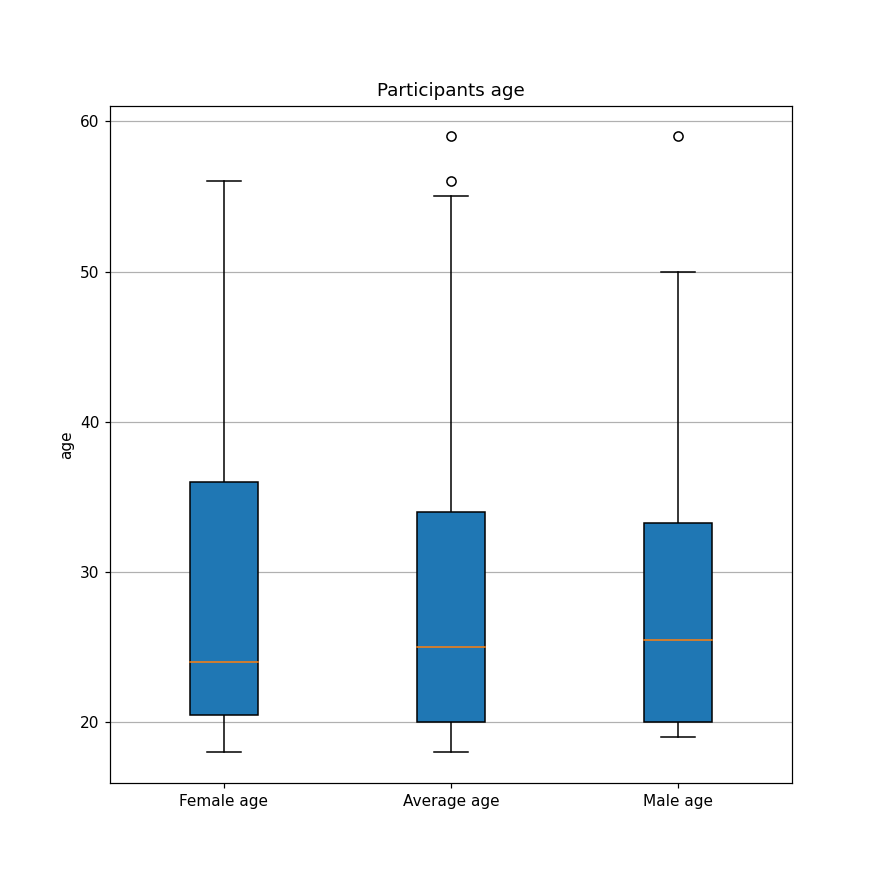


calculateMeanAge in 0.03143729999965217s
____________________________________________________________________________________________________
Shortest break : 15.06
Longest break : 82.5
________________________________________________________________________________
Mean break length : 37.819218750000005
SD break length : 13.999300583967678
________________________________________
Median break length : 36.905
Q1 and Q3 break : [27.52 44.6 ]


<IPython.core.display.Javascript object>


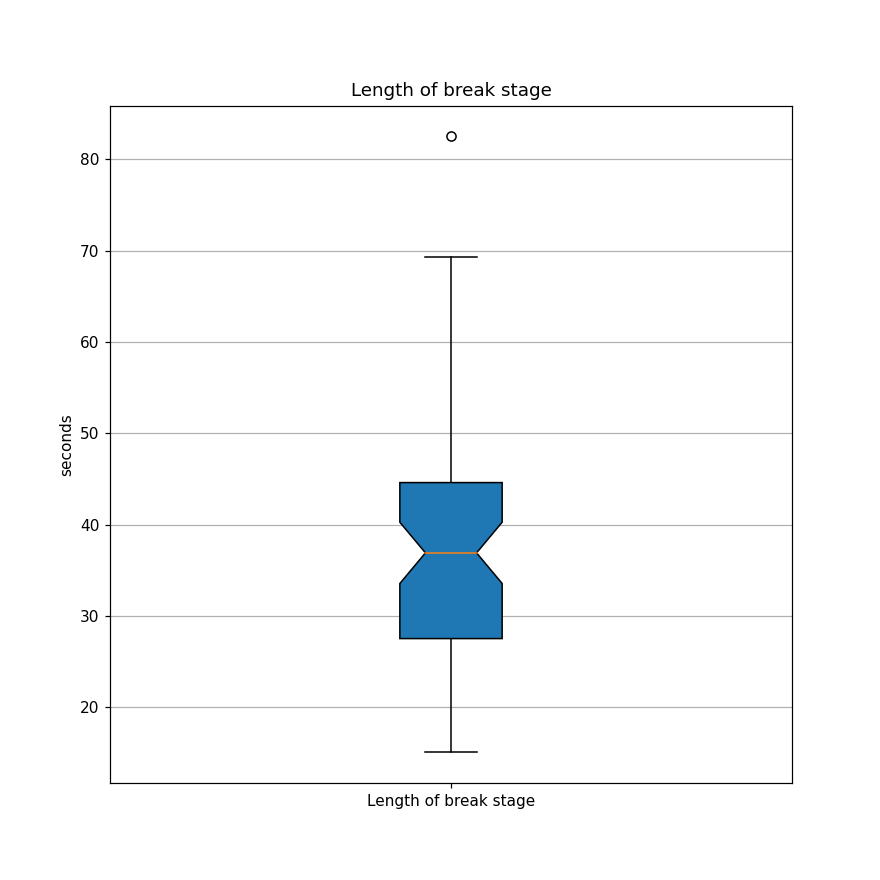

<IPython.core.display.Javascript object>


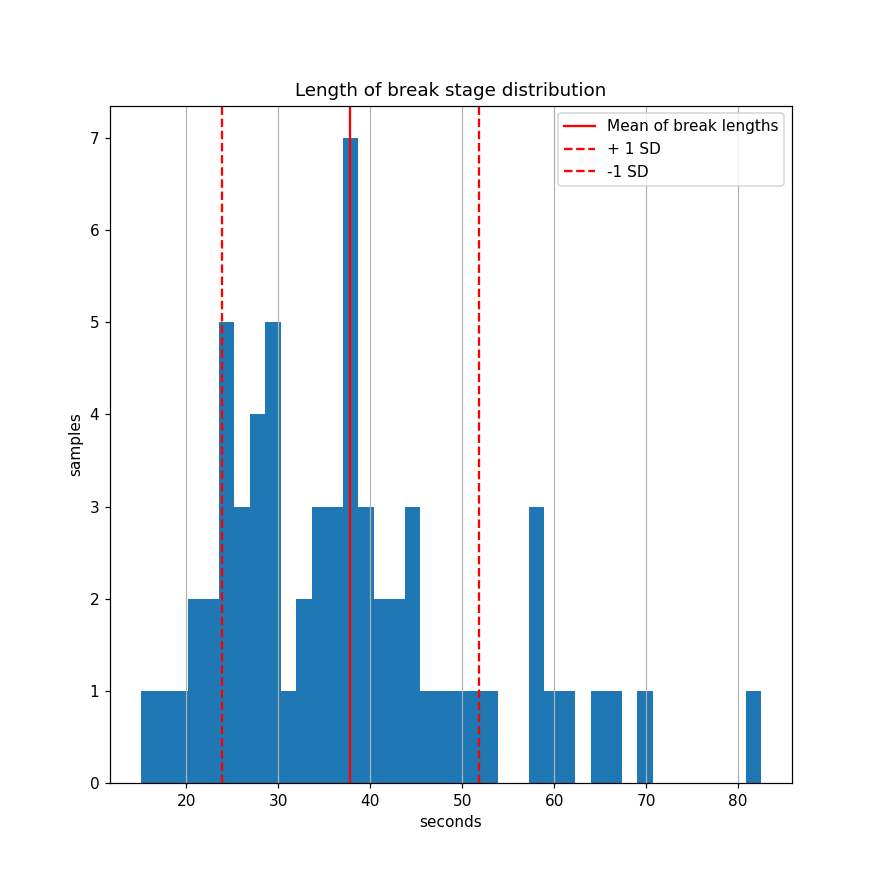


getIndexForPhase in 6.25375669999994s


<IPython.core.display.Javascript object>


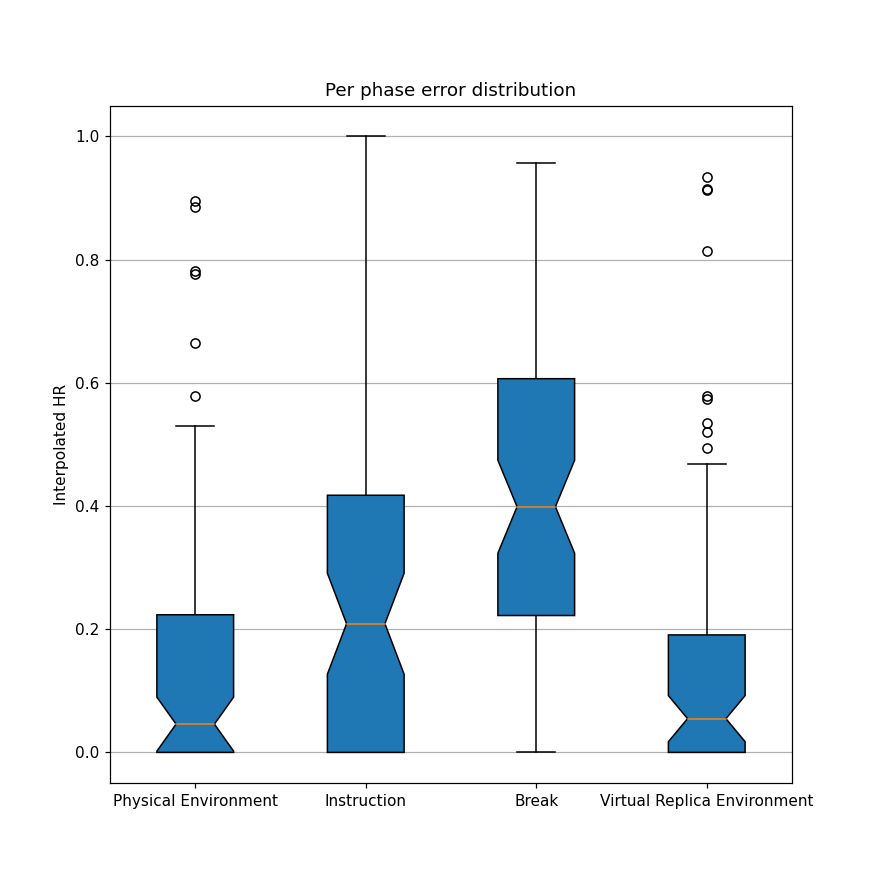

<IPython.core.display.Javascript object>


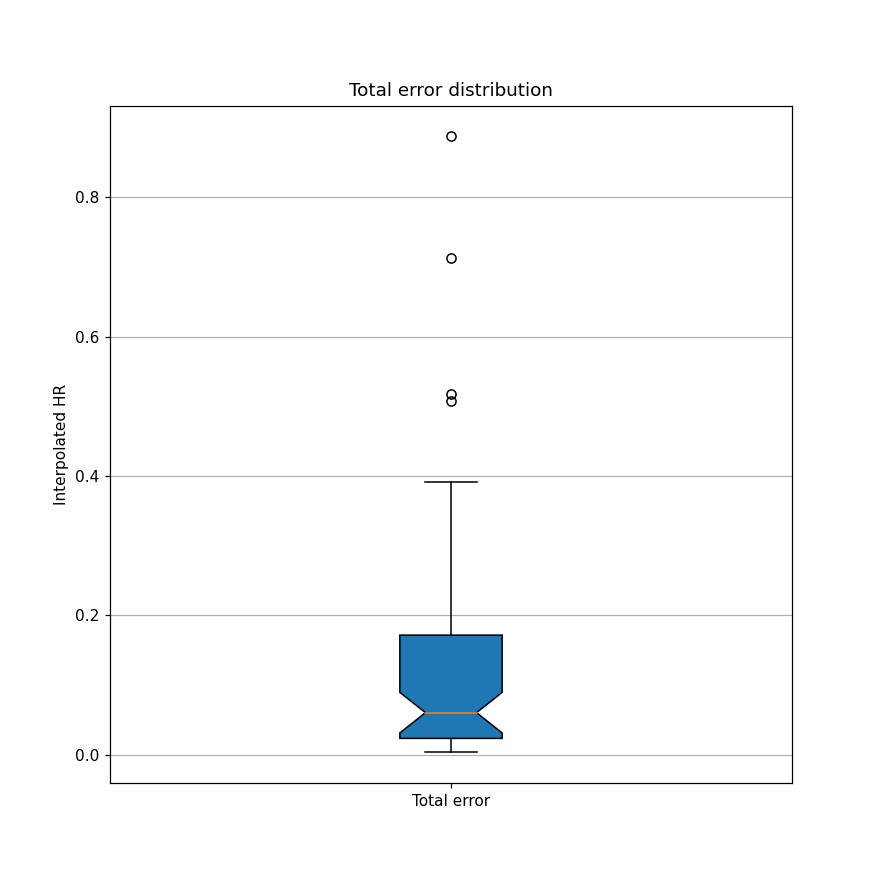

--------------------------------------------------------------------------------
mean : 0.13616860367734232
median : 0.06055999532117686
SD : 0.17975425340163873
Q1 and Q3 : [0.02361573 0.17183126]
--------------------------------------------------
mean for phase Physical Environment : 0.1567266211684244
median for phase Physical Environment : 0.045881161936609724
SD for phase Physical Environment : 0.2358225782817216
Q1 and Q3 for phase Physical Environment : [0.         0.22345682]
--------------------------------------------------
mean for phase Instruction : 0.28588172925877375
median for phase Instruction : 0.20888967095258498
SD for phase Instruction : 0.2916470303460747
Q1 and Q3 for phase Instruction : [0.         0.41744987]
--------------------------------------------------
mean for phase Break : 0.4237952260399618
median for phase Break : 0.3988209211061846
SD for phase Break : 0.2703370099030854
Q1 and Q3 for phase Break : [0.22221058 0.60666048]
---------------------------

threshold : 0%                                   targeted threshold : 0%  \
    adaptation PE instruction   break adaptation VE           adaptation PE   
0          85.236      83.382 101.932        92.675                  85.236   
1         101.153     102.931 118.315       109.265                 101.153   
2          76.114      79.260  94.969        78.355                  76.114   
3          90.888      99.455 102.640        89.783                  90.888   
4          73.799      87.859  86.673        74.219                  73.799   
5          79.555      78.763  92.231        79.915                  79.555   
6          90.530     124.432 119.617        91.481                  90.530   
7          70.301      80.795 117.689        68.245                  70.301   
8          79.088      81.571  87.270        74.460                  79.088   
9          70.492      79.437  79.064        68.414                  70.492   
10         59.377      60.844  83.050        59.550                  59.377   
11         60.795      62.545  68.301        58.271                  60.795   
12         59.112      61.374  70.564        58.074                  59.112   
13         71.382      85.782  97.895        98.323                  71.382   
14         66.578      75.552  81.535        64.677                  66.578   
15         81.326      86.189  96.499        78.064                  81.326   
16         85.046      93.154 156.897       157.215                  85.046   
17         61.917      59.502  74.137        64.656                  61.917   
18        108.361     115.214 133.078       104.255                 108.361   
19         66.279      63.632  81.327        66.092                  66.279   
20         70.996      75.160  82.369        73.624                  70.996   
21         63.246      70.250  75.047        64.154                  63.246   
22         75.215      74.492  82.492        73.516                  75.215   
23         91.640     104.832 112.660        92.141                  91.640   
24         73.494      74.361  87.418        75.076                  73.494   
25         68.106      78.410 140.570        91.677                  68.106   
26         91.405      93.378 128.038        88.546                  91.405   
27         90.982      90.850 102.663        92.380                  90.982   
28        103.072      86.465  94.188        88.042                 103.072   
29         75.621      70.590  97.271        77.279                  75.621   
30         87.902      99.117 107.438        93.139                  87.902   
31         63.758      78.770  94.701        55.395                  63.758   
32         84.639      86.959  92.363        86.833                  84.639   
33         63.586      65.042  78.221        63.294                  63.586   
34         84.891      84.008  86.258        82.967                  84.891   
35         79.653      84.339 103.334       176.380                  79.653   
36         92.462      93.509 112.415        96.702                  92.462   
37         71.710      70.785  83.848        74.510                  71.710   
38         79.336      86.487  98.962        79.810                  79.336   
39         76.486      78.736 110.618        94.243                  76.486   
40         57.317      57.628  64.330        57.190                  57.317   
41         76.426      80.515 124.975        91.202                  76.426   
42         78.259      80.652  88.259        74.167                  78.259   
43        111.003     112.192 174.618       164.242                 111.003   
44         57.534      63.060  67.108        57.773                  57.534   
45         80.055     106.873  78.157        69.742                  80.055   
46         69.141      74.775  78.541        72.868                  69.141   
47         62.515      62.301 115.804        59.010                  62.515   
48         66.346      71.146 127.744        67.197  

____________________________________________________________________________________________________

meansSC : 



Skin Conductance                                 Phasic Component  \
      adaptation PE instruction break adaptation VE    adaptation PE   
0             1.558       1.302 1.332         1.425            0.081   
1             1.989       2.130 2.049         2.022            0.112   
2             1.133       1.169 1.394         1.173            0.076   
3             3.131       3.473 4.491         4.543            0.134   
4             1.960       2.055 3.132         2.220            0.020   
5             1.346       1.397 1.839         1.739            0.108   
6             2.904       2.647 2.653         2.580            0.081   
7             0.356       0.313 0.467         0.431            0.014   
8             2.158       1.979 1.953         1.955            0.044   
9             1.988       2.266 2.770         2.443            0.034   
10            1.394       1.259 1.362         1.642            0.043   
11            0.904       0.895 0.993         0.998            0.026   
12            1.612       1.571 1.818         1.983            0.074   
13            2.199       2.298 2.330         2.780            0.148   
14            4.287       3.873 3.976         3.613            0.293   
15            4.503       4.803 5.273         4.993            0.379   
16            1.154       0.989 1.489         1.502            0.050   
17            1.364       0.956 0.840         0.890            0.031   
18            2.667       2.968 4.469         2.808            0.053   
19            1.065       1.009 1.343         1.409            0.202   
20            0.777       0.682 1.043         1.172            0.333   
21            4.003       4.676 4.189         4.410            0.495   
22            1.536       1.142 1.329         1.199            0.003   
23            1.888       1.812 2.775         2.048            0.080   
24            4.375       4.164 6.932         4.268            0.068   
25            1.356       1.306 1.784         1.752            0.083   
26            3.230       3.727 4.812         3.437            0.045   
27            1.974       2.109 2.253         2.367            0.249   
28            5.267       5.451 6.971         6.766            0.216   
29            1.582       1.662 1.779         1.851            0.317   
30            1.090       1.205 1.248         1.289            1.208   
31            1.527       1.553 1.415         1.460            0.708   
32            2.678       3.021 2.999         3.022            0.146   
33            0.799       0.746 0.980         1.006            0.046   
34            6.765       7.206 8.117         7.478            0.304   
35            5.894       6.239 6.807         6.822            0.430   
36            1.324       1.356 1.577         1.718            0.127   
37            0.434       0.414 0.380         0.375            0.374   
38            3.549       4.685 4.904         4.283            0.181   
39            1.516       1.527 1.626         1.645            1.692   
40            1.943       1.887 2.665         2.602            0.035   
41            1.798       1.870 1.713         2.221            0.099   
42            2.149       2.071 2.267         1.897            0.133   
43            1.626       1.350 2.432         2.430            0.022   
44            2.264       2.637 3.454         2.673            0.115   
45            1.566       1.588 1.591         1.657            3.382   
46            4.024       3.952 4.166         3.905            0.278   
47            1.679       1.577 1.826         1.773            0.344   
48            2.647       3.089 3.957         3.033            0.005   
49            2.877       3.068 3.475         3.406            0.070   
50            1.179       1.108 1.118         1.147            0.313   
51            3.015       3.490 3.910         3.011            0.225   
52            1.453       1.440 1.480         1.521            0.040   
53            0.934       0.964 1.113      


calculateMeansPerPhase in 0.464828099999977s
____________________________________________________________________________________________________
correlation for Age and break phase length :
pearson r = 0.03038011675513215 (p = 0.811643947921032)
regressive line first order :  y = 0.040264398068698144 * x + 36.66287556796454
____________________________________________________________________________________________________


<IPython.core.display.Javascript object>


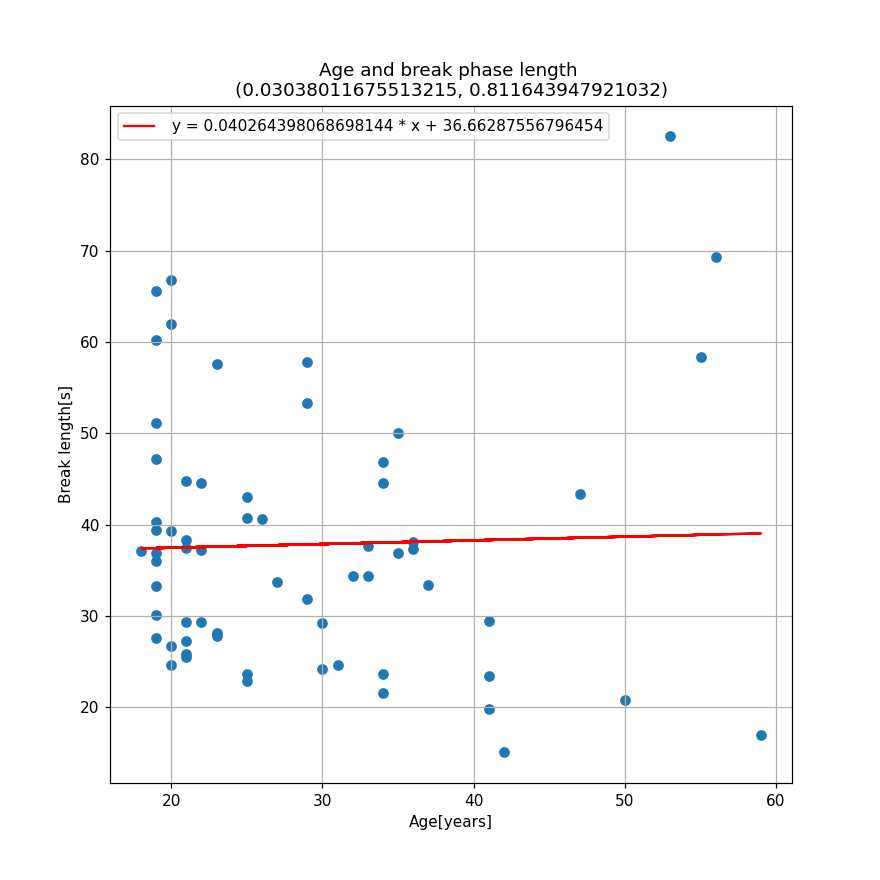


ageBreakLengthCorr in 0.02445850000003702s
____________________________________________________________________________________________________
Skin Conductance
For +/- impact of break phase - instruction phase = 0.40414574488935395 (Cohen's d = 1.0358003397908797) for Skin Conductance :
(0.0014422138927743257, (3.100946031584066, 0.0014422138927743257, 63.0), (-13.471859405070008, 1.6250889303813686e-20, 63.0))
For +/- Cohen's d large effect size(0.8570000000000007) * SD(0.3901772661813839) = 0.33438191711744625 :
(0.04988661905442837, (1.6705433132570338, 0.04988661905442837, 63.0), (-12.041456686742976, 2.7255783260218847e-18, 63.0))
For +/- Cohen's d 0.29) for Skin Conductance :
(0.2248789686667811, (0.7605586275410967, 0.2248789686667811, 63.0), (-11.131472001027037, 8.096011802543316e-17, 63.0))
____________________________________________________________________________________________________
Phasic Component
For +/- impact of break phase - instruction phase = 2.31314362194663

<IPython.core.display.Javascript object>


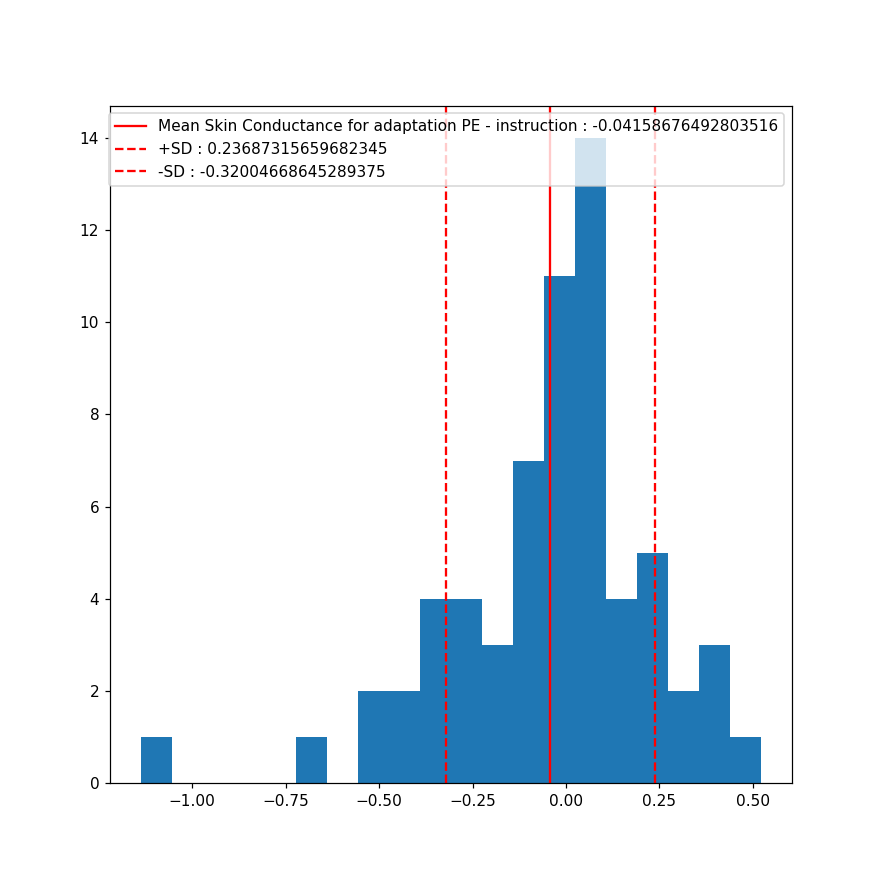

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-1.1947648250507066, pvalue=0.23665753802076023)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=943.0, pvalue=0.5165400906836031)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Skin Conductance :
pearson r = 0.22495728455619718 (p = 0.07390967004398297)
regressive line first order :  y = 0.004474622673342874 * x + -0.21081349863489893


<IPython.core.display.Javascript object>


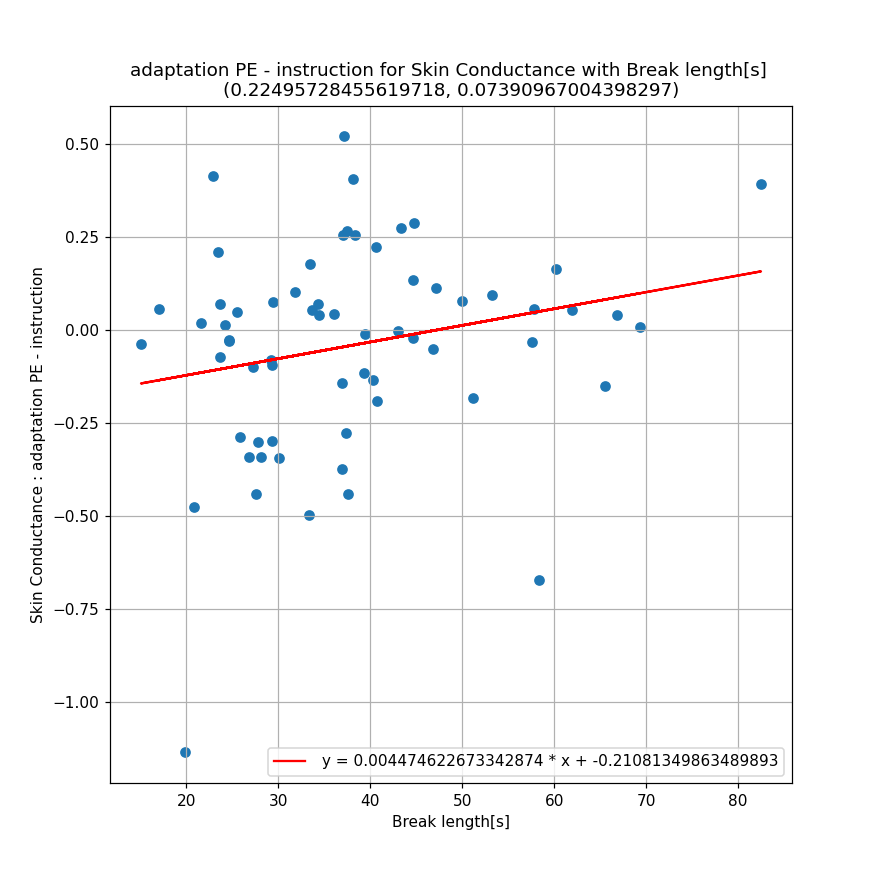

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Skin Conductance :
pearson r = -0.049799036167205685 (p = 0.6959577028131353)
regressive line first order :  y = -0.001312831738836924 * x + -0.0038838784283122324


<IPython.core.display.Javascript object>


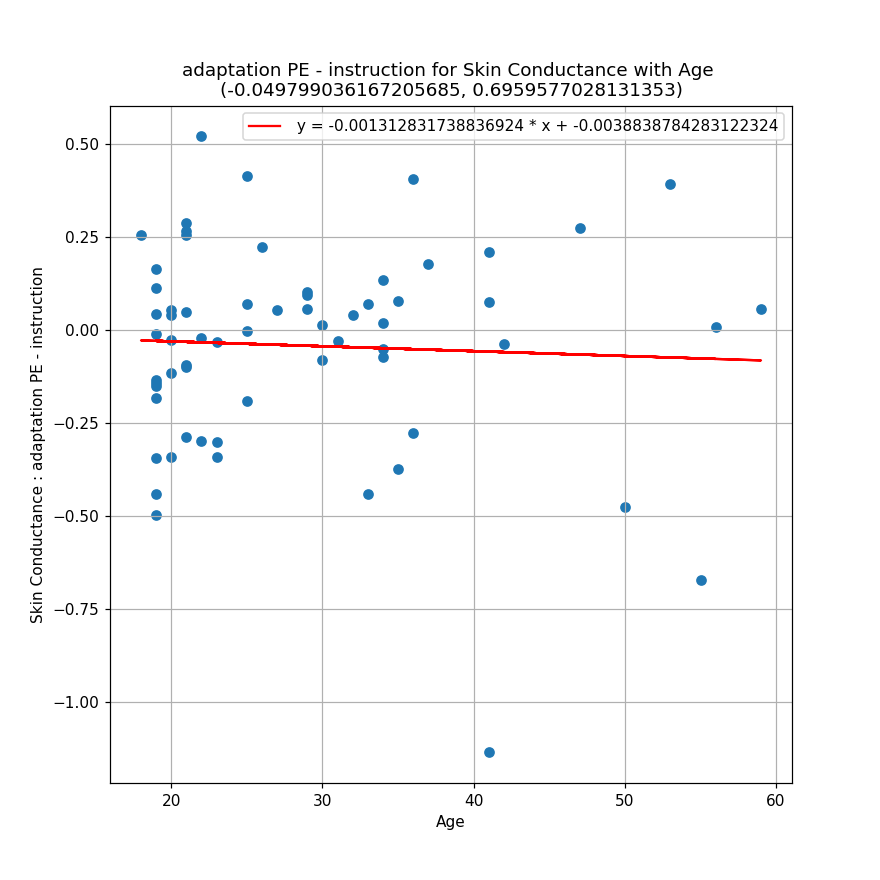

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Skin Conductance :
pearson r = 0.1166206671269302 (p = 0.3587686259476603)
regressive line first order :  y = 0.0013833121705076681 * x + -0.06933946534884519


<IPython.core.display.Javascript object>


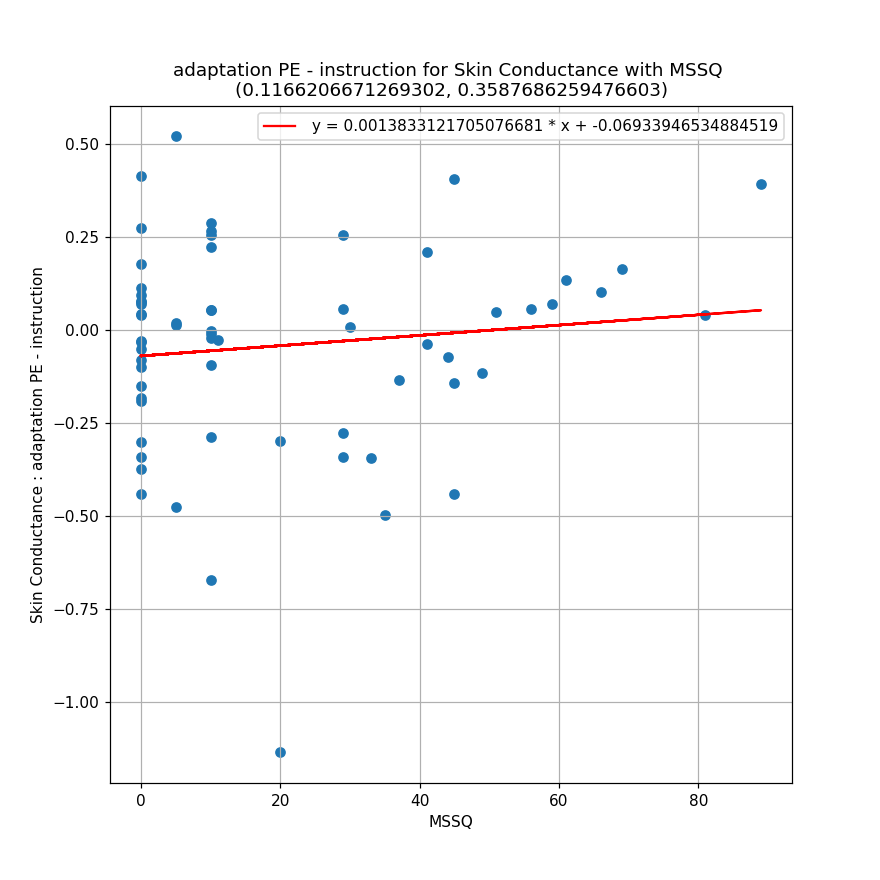




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for adaptation PE - instruction : -1.0591250391742832
standard deviation for differences in Phasic Component for adaptation PE - instruction : 2.587764650785978
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.3989065885543823, pvalue=9.638019447474628e-15)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.78967274344623, pvalue=7.052369382028885e-09)
__________________________________________________
Skew : -4.409717522049862
__________________________________________________


<IPython.core.display.Javascript object>


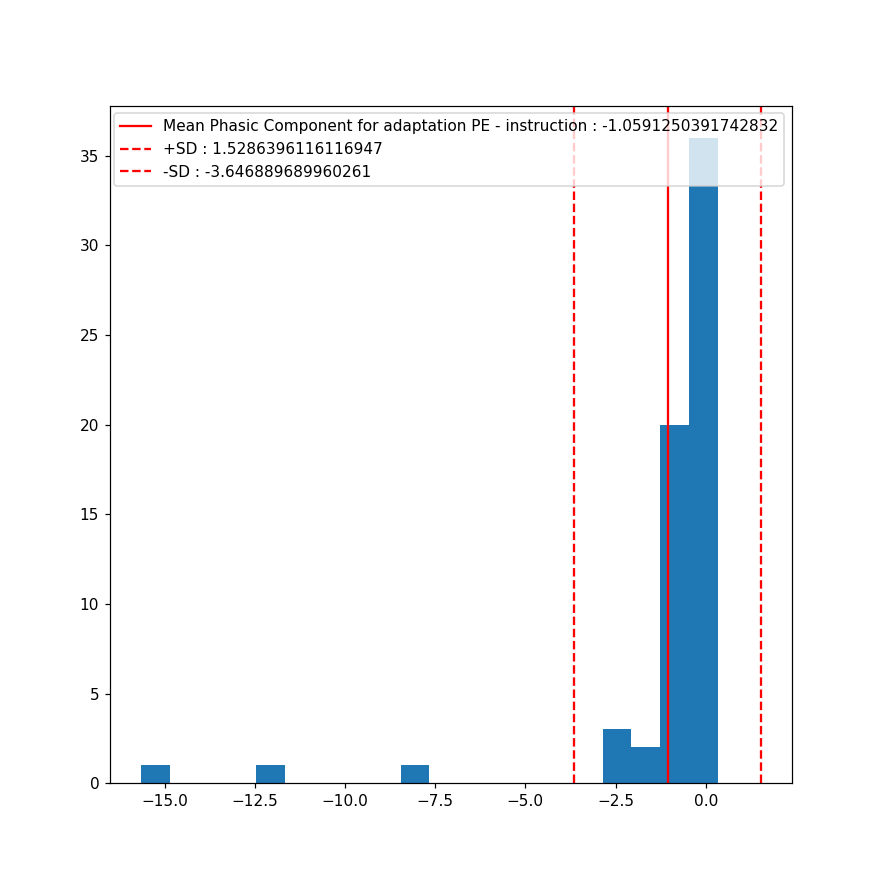

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-3.2742546007113793, pvalue=0.0017232559817109956)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=78.0, pvalue=1.2479751925932432e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Phasic Component :
pearson r = 0.20424592923737012 (p = 0.10547323696516059)
regressive line first order :  y = 0.03775477157428116 * x + -2.4869810041983027


<IPython.core.display.Javascript object>


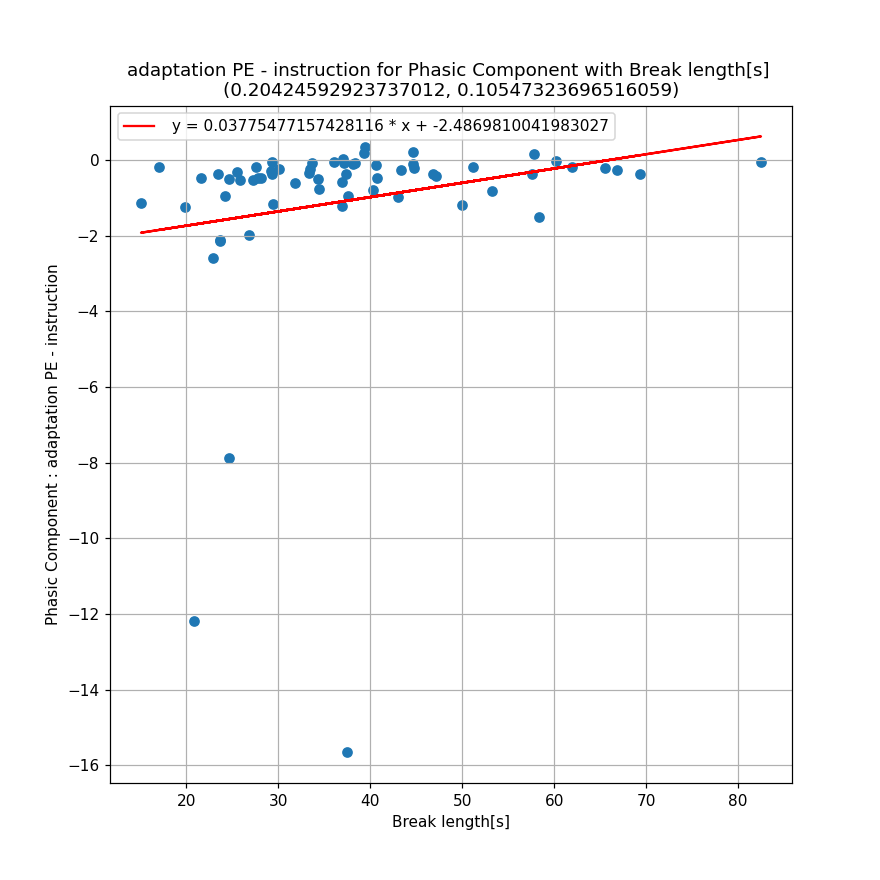

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Phasic Component :
pearson r = -0.07909605369914664 (p = 0.5344209316120916)
regressive line first order :  y = -0.019377824841028707 * x + -0.5026181320209892


<IPython.core.display.Javascript object>


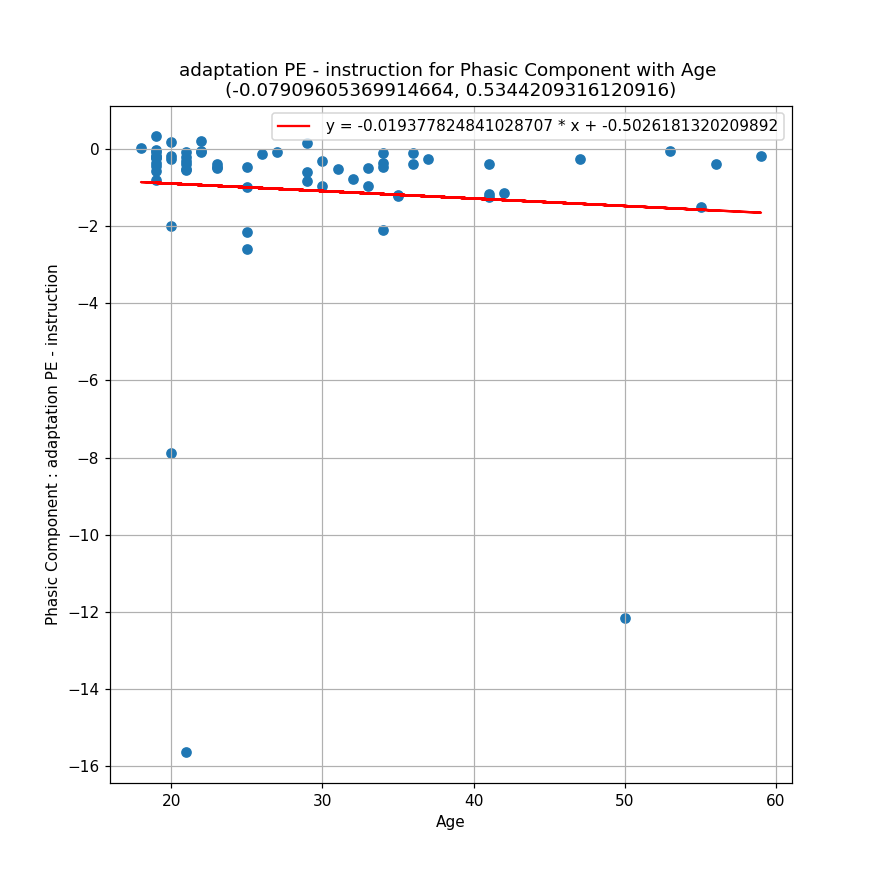

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Phasic Component :
pearson r = 0.11124599184799833 (p = 0.3814932897058098)
regressive line first order :  y = 0.012262841884288821 * x + -1.3051483044778267


<IPython.core.display.Javascript object>


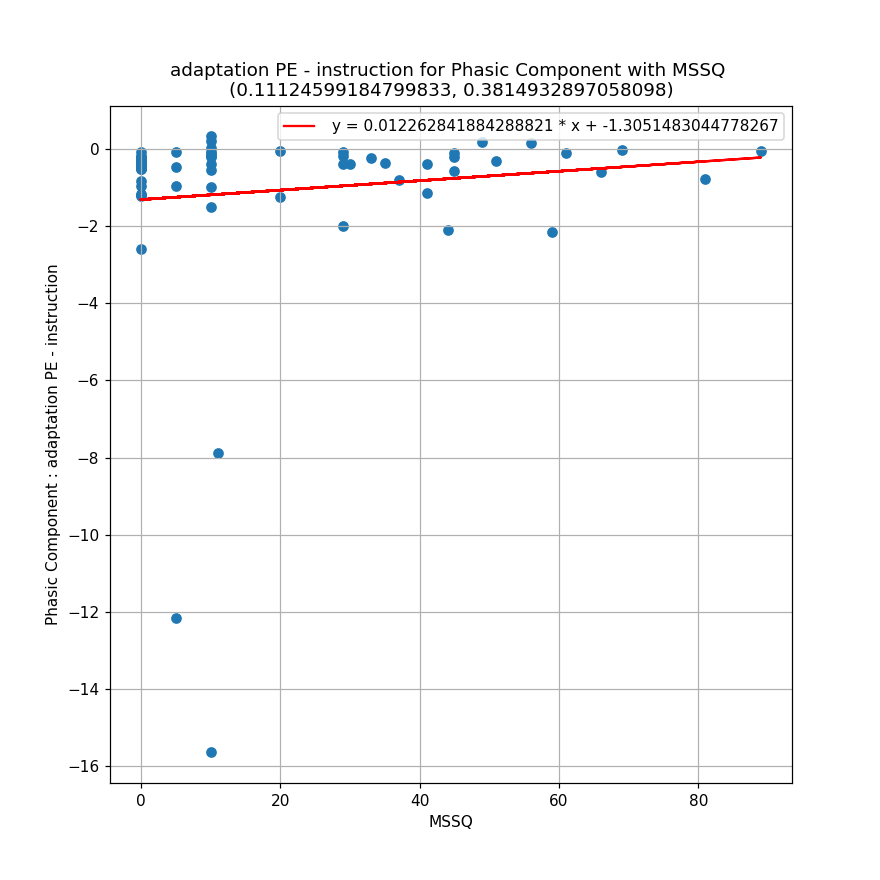




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for adaptation PE - instruction : 1.047740686699888
standard deviation for differences in Tonic Component for adaptation PE - instruction : 2.623618097767302
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.477039635181427, pvalue=9.61008480909395e-14)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.827463014688632, pvalue=5.627631665127431e-09)
__________________________________________________
Skew : 4.311035898718172
__________________________________________________


<IPython.core.display.Javascript object>


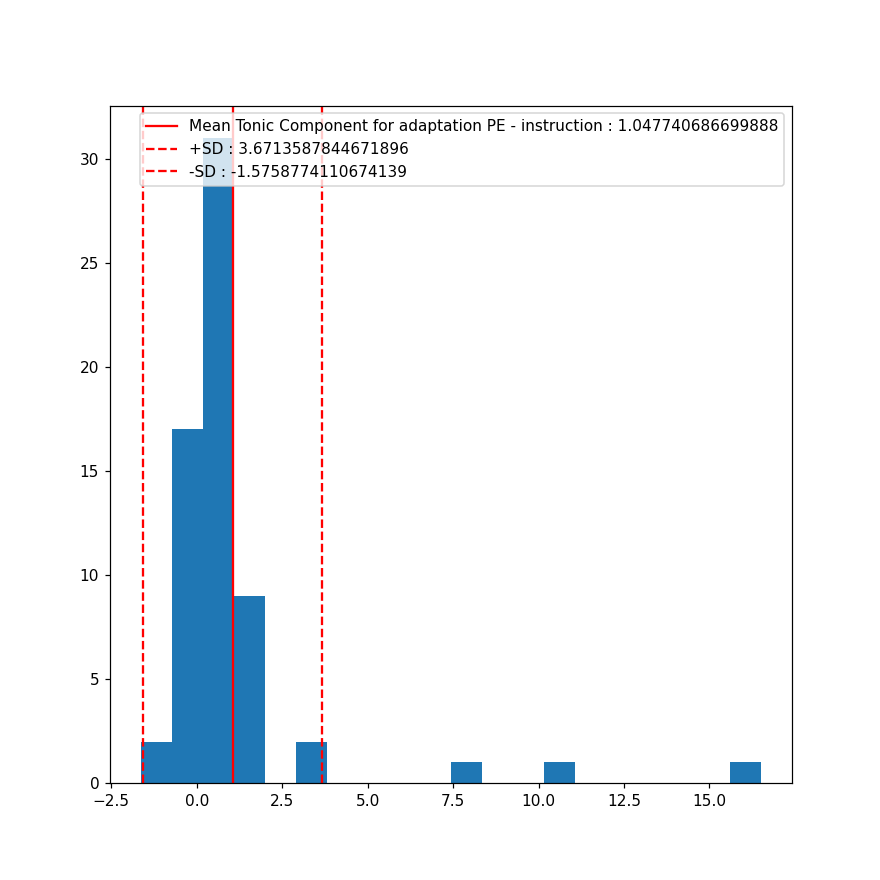

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=3.194796338968739, pvalue=0.0021867580101948892)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=267.0, pvalue=2.347950751147718e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Tonic Component :
pearson r = -0.14817049470077284 (p = 0.24261946914781266)
regressive line first order :  y = -0.027768729524764904 * x + 2.097932343006554


<IPython.core.display.Javascript object>


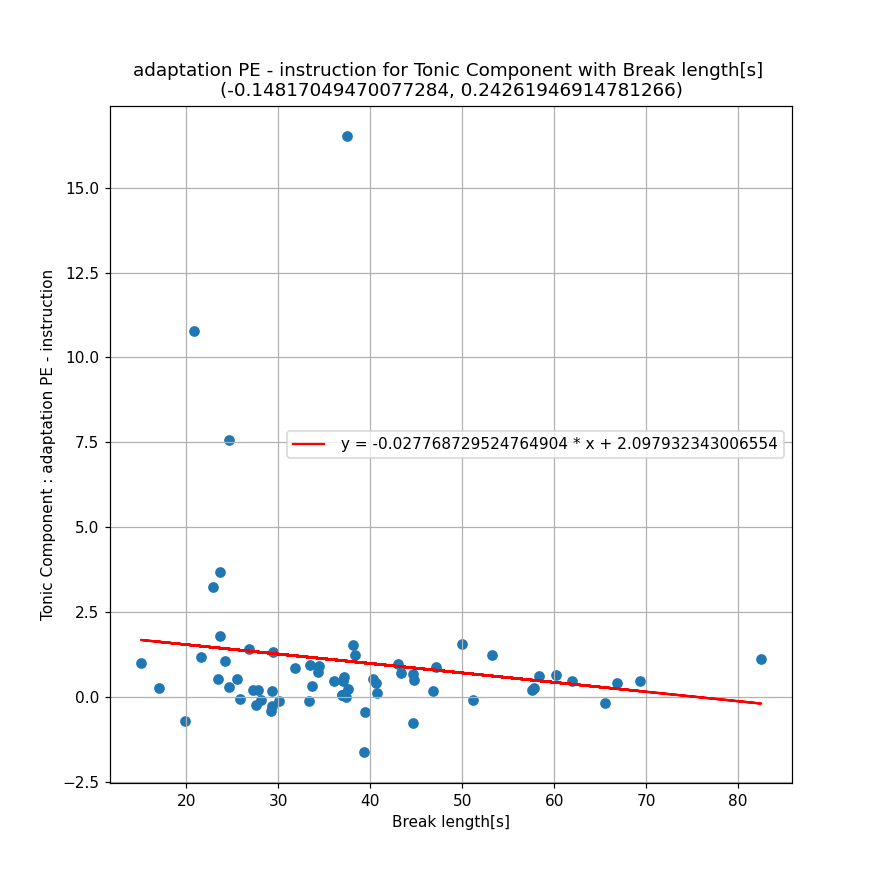

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Tonic Component :
pearson r = 0.07086432527355602 (p = 0.5779090828136)
regressive line first order :  y = 0.017601663264702406 * x + 0.5422429198167152


<IPython.core.display.Javascript object>


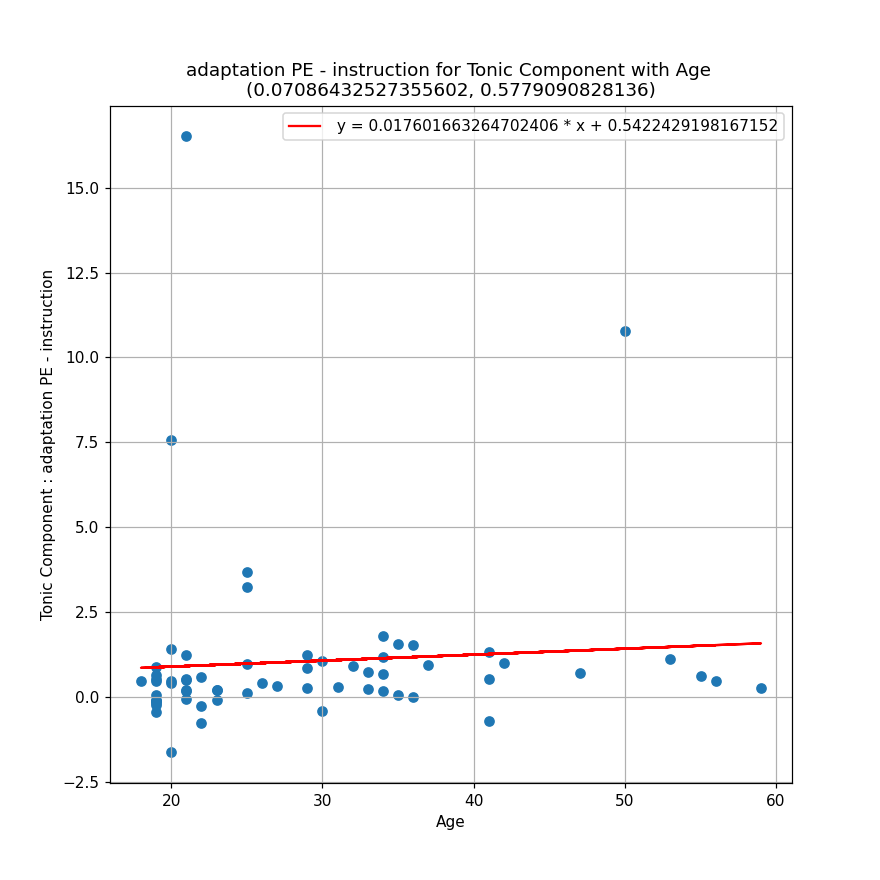

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Tonic Component :
pearson r = -0.055420143551086376 (p = 0.6635933434764806)
regressive line first order :  y = -0.006193701119781962 * x + 1.172001815415513


<IPython.core.display.Javascript object>


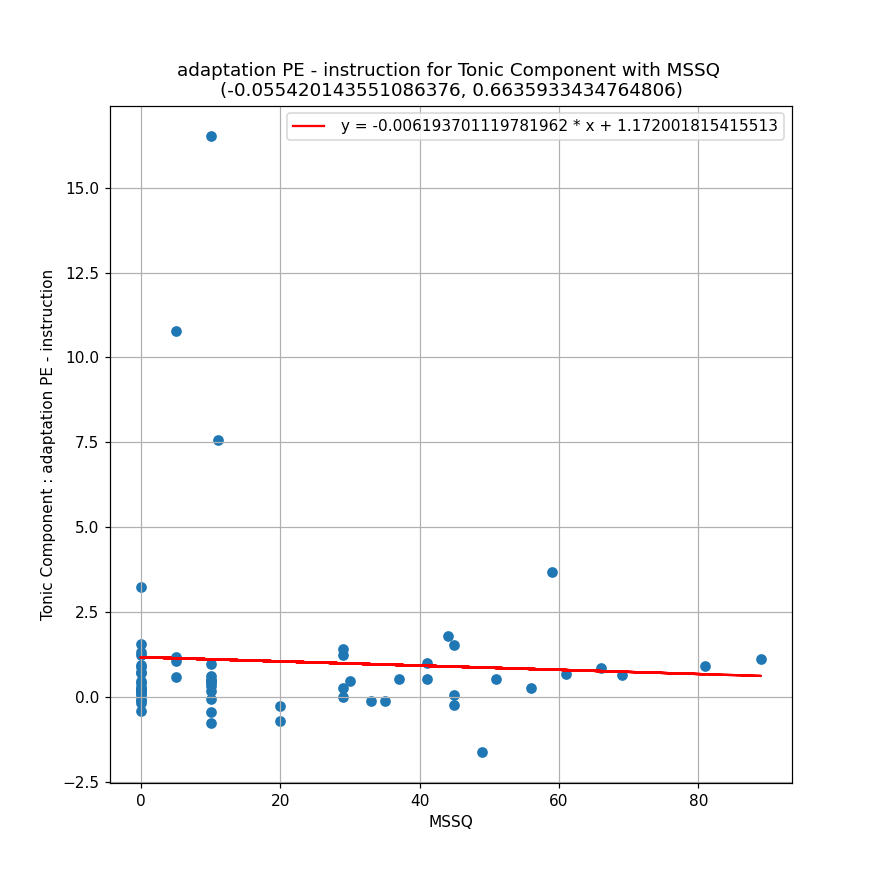




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for adaptation PE - instruction _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for adaptation PE - instruction : -3.6732210499662887
standard deviation for differences in HR[1] for adaptation PE - instruction : 8.992173485737037
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.792171835899353, pvalue=4.215728566236976e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.811382424427113, pvalue=1.4988990161357825e-06)
__________________________________________________
Skew : 1.0679396011288729
__________________________________________________


<IPython.core.display.Javascript object>


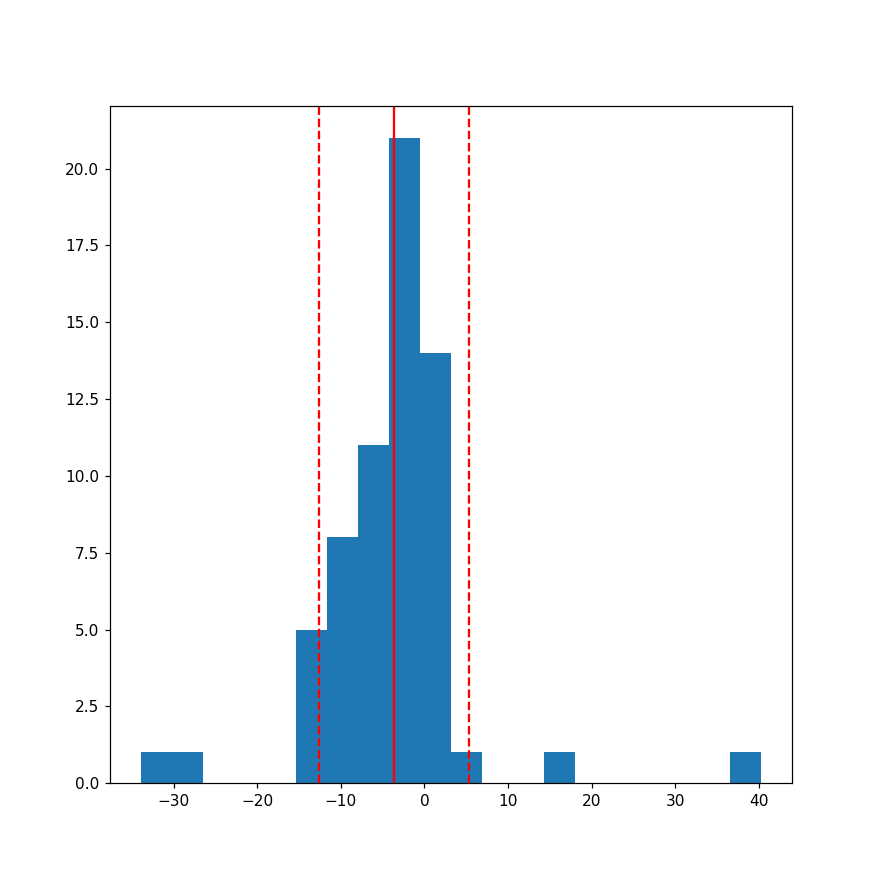

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for adaptation PE - instruction : 

Ttest results : Ttest_relResult(statistic=-3.2679272087377584, pvalue=0.0017564743365040298)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=329.0, pvalue=1.986273900017716e-06)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - instruction in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.2690497273620118 (p = 0.03157198592072313)
regressive line first order :  y = 0.17281876406740967 * x + -10.209091692336289


<IPython.core.display.Javascript object>


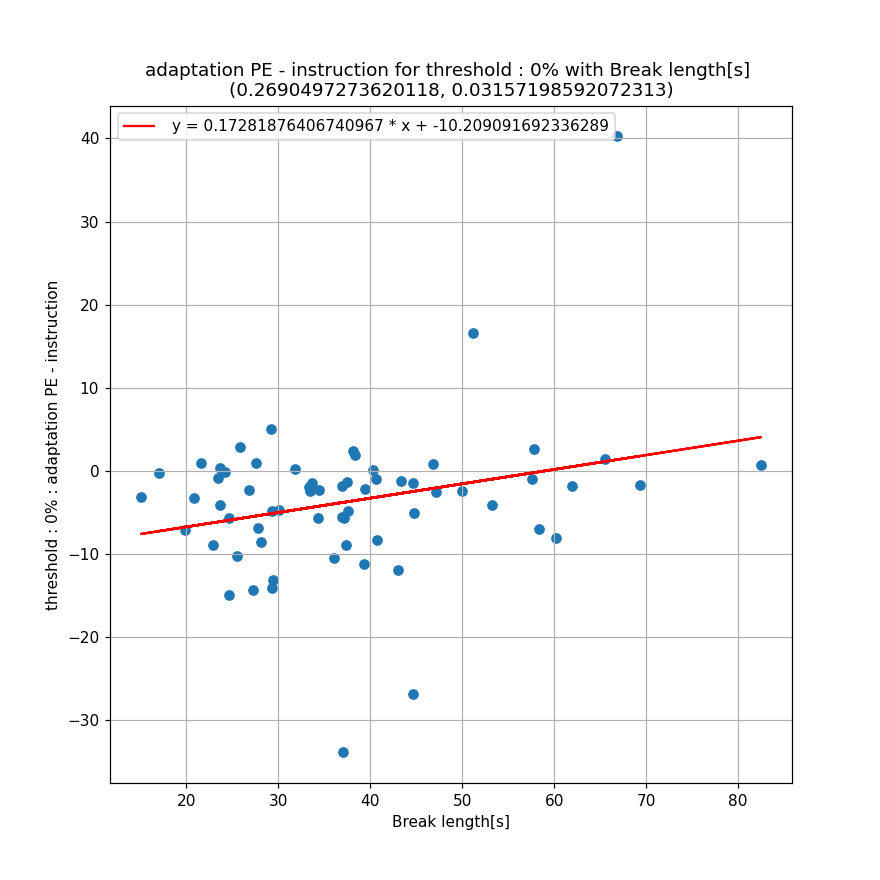

____________________________________________________________________________________________________
correlation for Age and adaptation PE - instruction in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.05967598751941125 (p = 0.6394868343185006)
regressive line first order :  y = 0.050803042889186724 * x + -5.132220937940118


<ipython-input-10-0e64d09c308b>:255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig8, ax8 = plt.subplots(figsize=(8, 8))


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - instruction in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.056027226319201776 (p = 0.6601330477386912)
regressive line first order :  y = 0.02146079371309181 * x + -4.103778223835191


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for adaptation PE - break : -0.4457325098173891
standard deviation for differences in Skin Conductance for adaptation PE - break : 0.6035405046578179
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8821191787719727, pvalue=1.8070706573780626e-05)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.003276154121549, pvalue=0.0451476555340976)
__________________________________________________
Skew : -1.2466230898160848
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-5.908236565764221, pvalue=1.519548448533127e-07)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=226.0, pvalue=5.220594547594895e-08)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Skin Conductance :
pearson r = 0.19775457367563284 (p = 0.11726235058991033)
regressive line first order :  y = 0.008525632725628356 * x + -0.7681652788500858


<IPython.core.display.Javascript object>


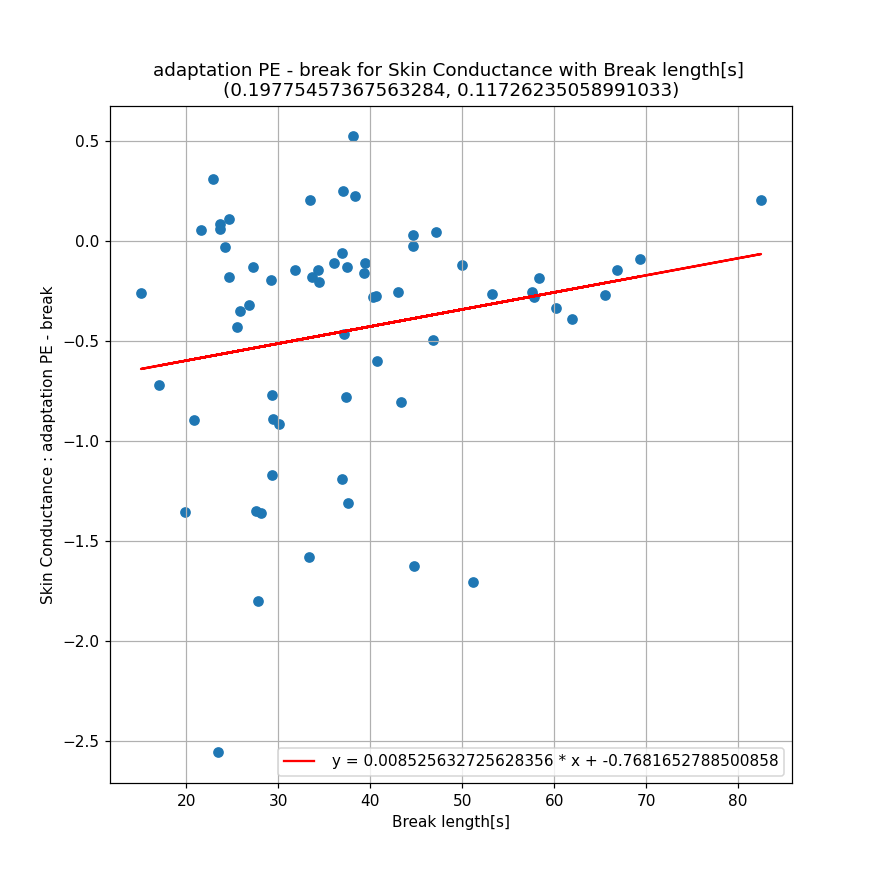

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Skin Conductance :
pearson r = -0.023918494944029634 (p = 0.8511875302545213)
regressive line first order :  y = -0.0013666764284053768 * x + -0.40648327113912164


<IPython.core.display.Javascript object>


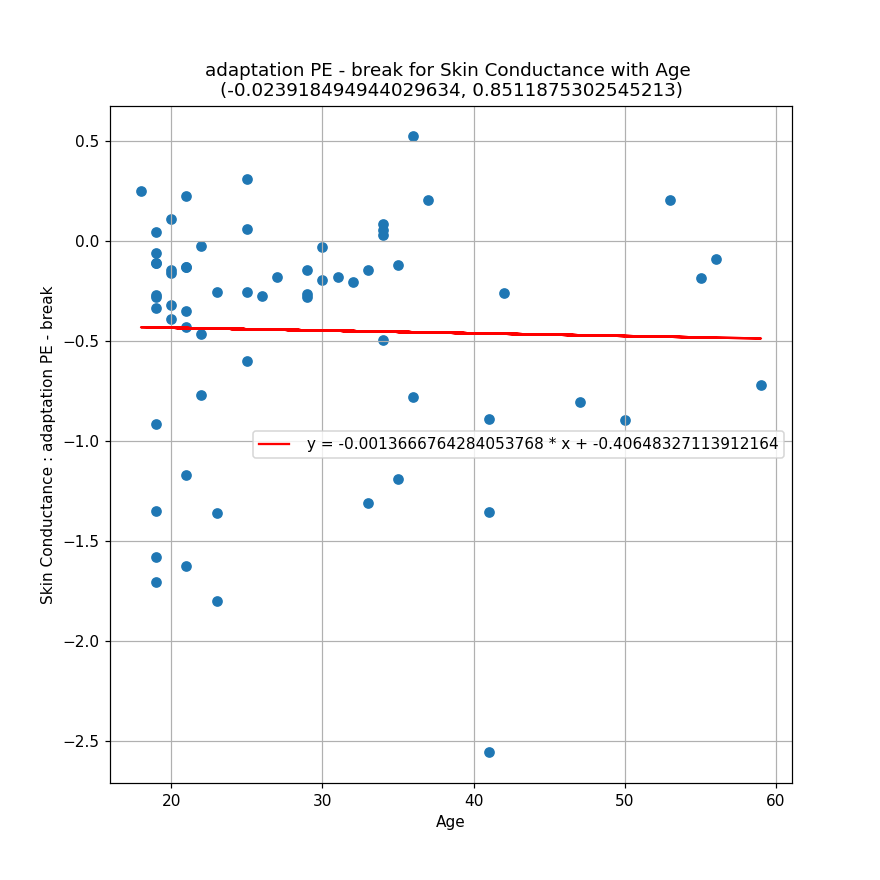

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Skin Conductance :
pearson r = 0.12622620451583985 (p = 0.32027664245695897)
regressive line first order :  y = 0.003245173533478997 * x + -0.510838803832811


<IPython.core.display.Javascript object>


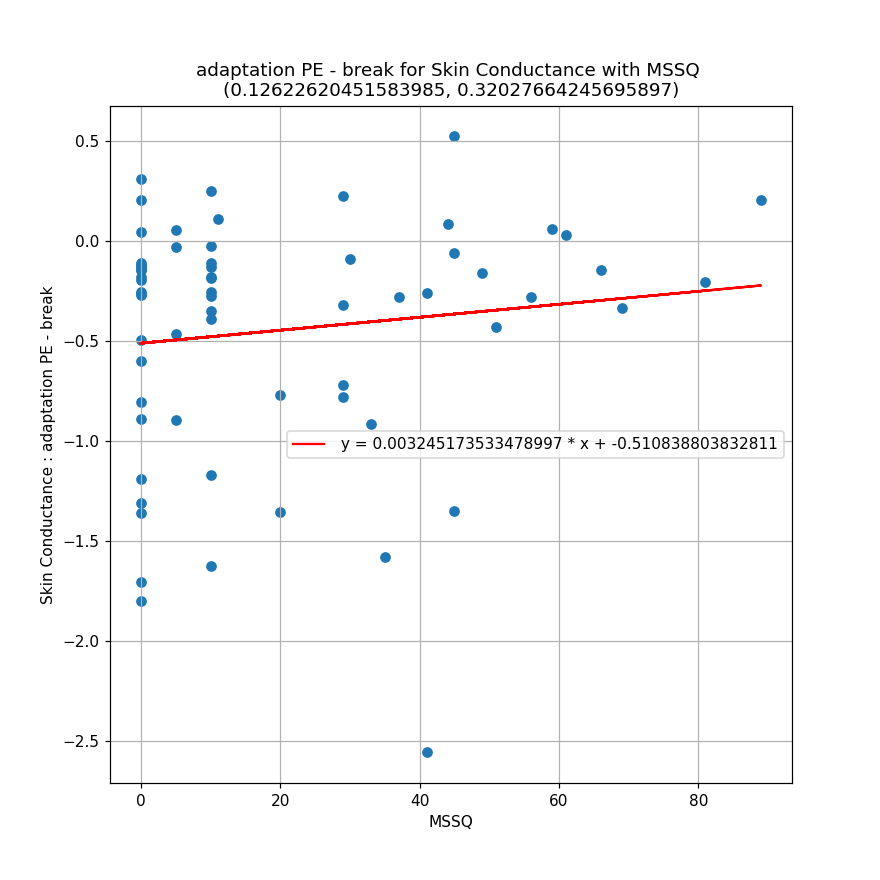




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for adaptation PE - break : -3.3722686611209163
standard deviation for differences in Phasic Component for adaptation PE - break : 6.2141928000229125
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5300037860870361, pvalue=5.276682411327338e-13)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.544015651991301, pvalue=5.5192556911887885e-06)
__________________________________________________
Skew : -2.9253866760922436
__________________________________________________


<IPython.core.display.Javascript object>


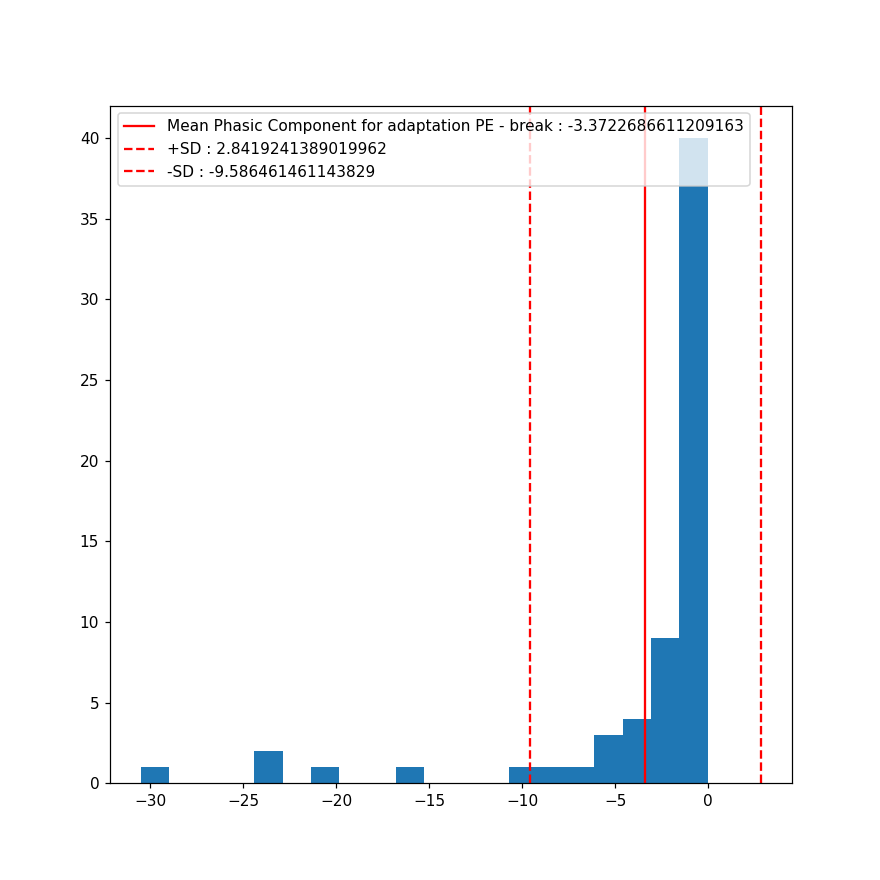

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-4.341376290878497, pvalue=5.234863462308522e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=3.5254980732707397e-12)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Phasic Component :
pearson r = 0.17605821688588302 (p = 0.16404264971596172)
regressive line first order :  y = 0.07815102598840325 * x + -6.327879408513269


<IPython.core.display.Javascript object>


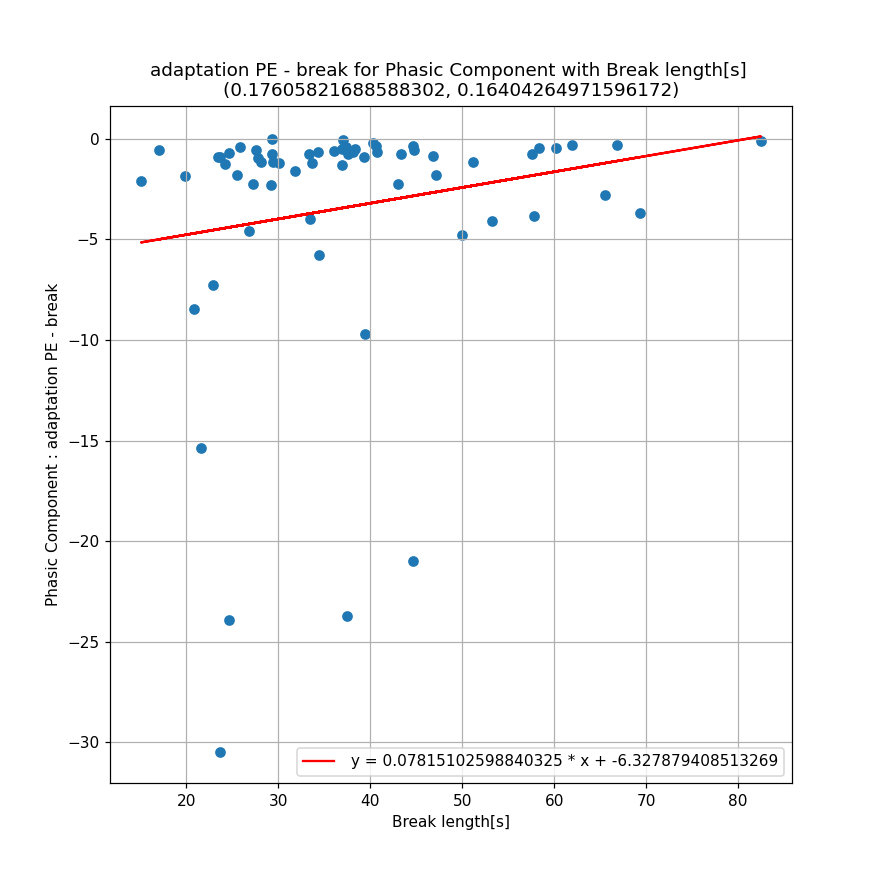

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Phasic Component :
pearson r = 0.03054829198560656 (p = 0.810620538190978)
regressive line first order :  y = 0.01797202815730106 * x + -3.888402844763403


<IPython.core.display.Javascript object>


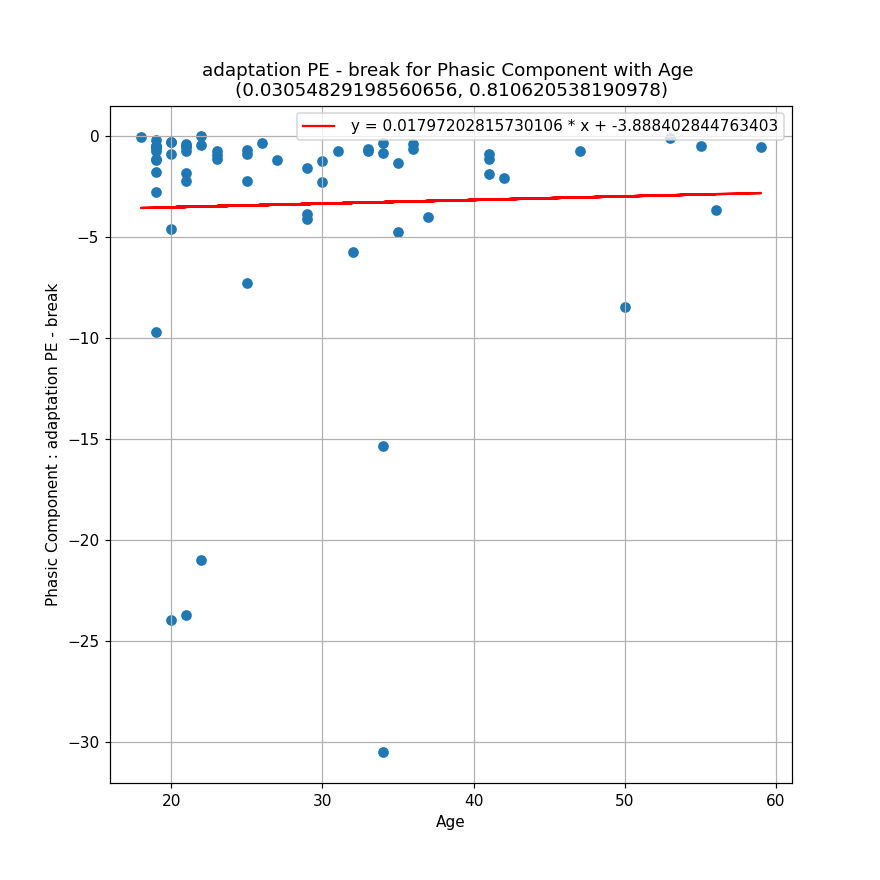

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Phasic Component :
pearson r = 0.038603443207981133 (p = 0.7620013511364361)
regressive line first order :  y = 0.01021863169753519 * x + -3.5772799595527136


<IPython.core.display.Javascript object>


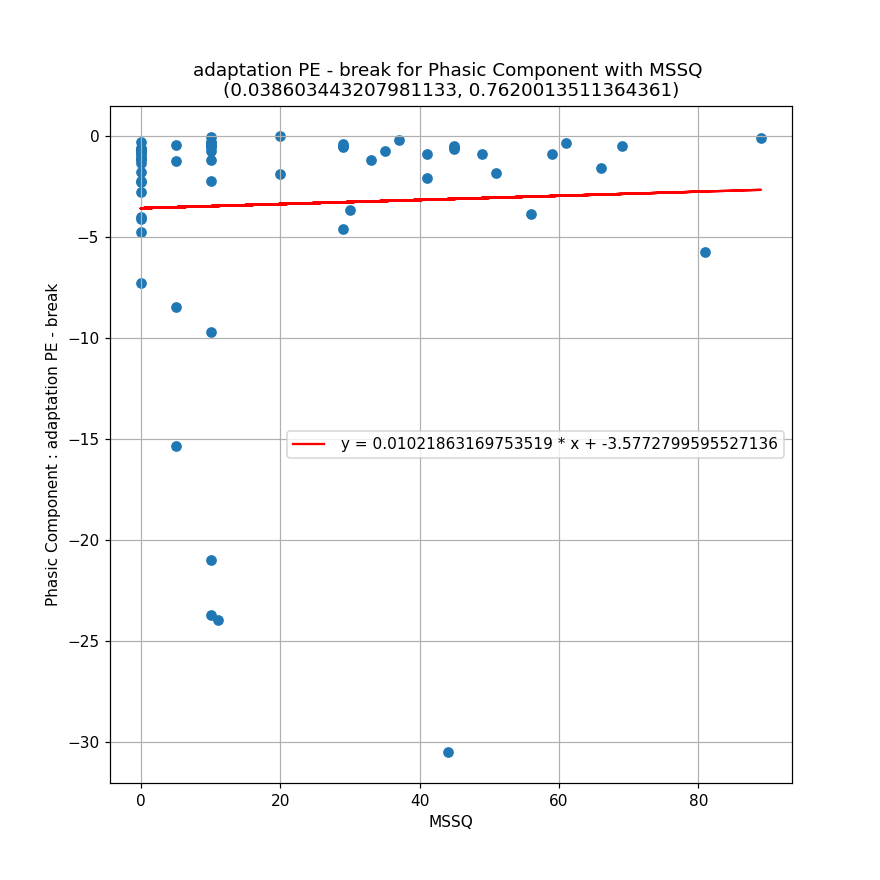




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for adaptation PE - break : 2.529901908202659
standard deviation for differences in Tonic Component for adaptation PE - break : 6.628265582710332
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5779573321342468, pvalue=2.784567715297115e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.446720432402023, pvalue=8.719119124066543e-06)
__________________________________________________
Skew : 2.8265866546748195
__________________________________________________


<IPython.core.display.Javascript object>


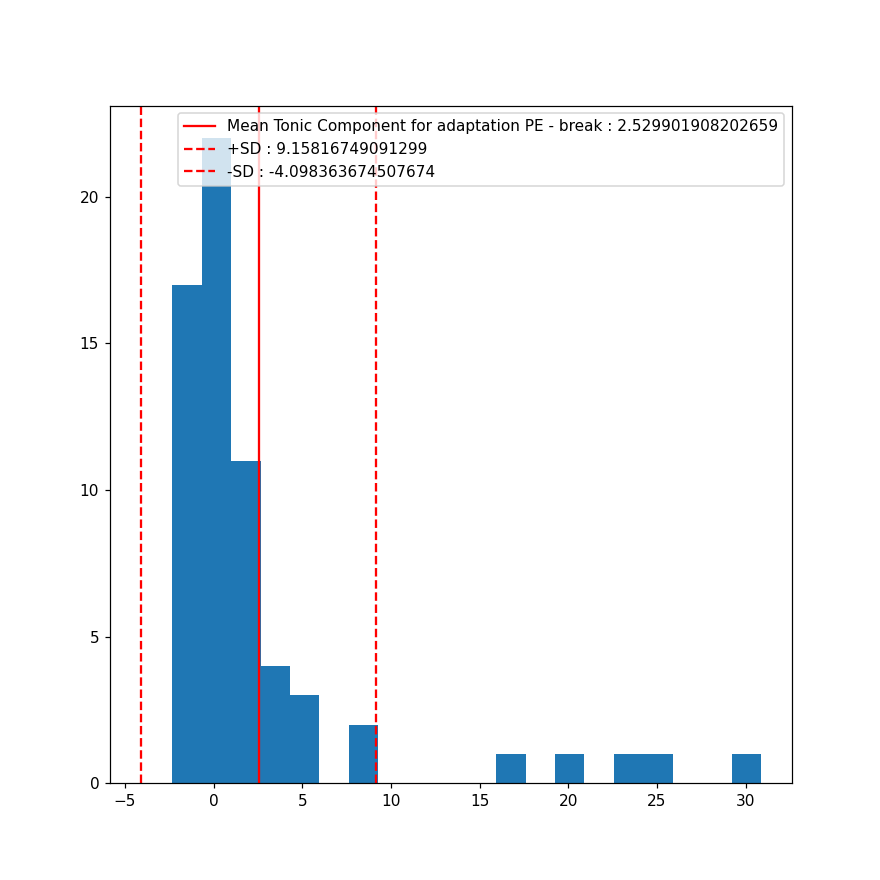

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=3.0534707779988124, pvalue=0.0033119345614391845)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=706.0, pvalue=0.02550765413881958)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Tonic Component :
pearson r = -0.16857334039577707 (p = 0.18300519307679514)
regressive line first order :  y = -0.07981462099524148 * x + 5.548428519070034


<IPython.core.display.Javascript object>


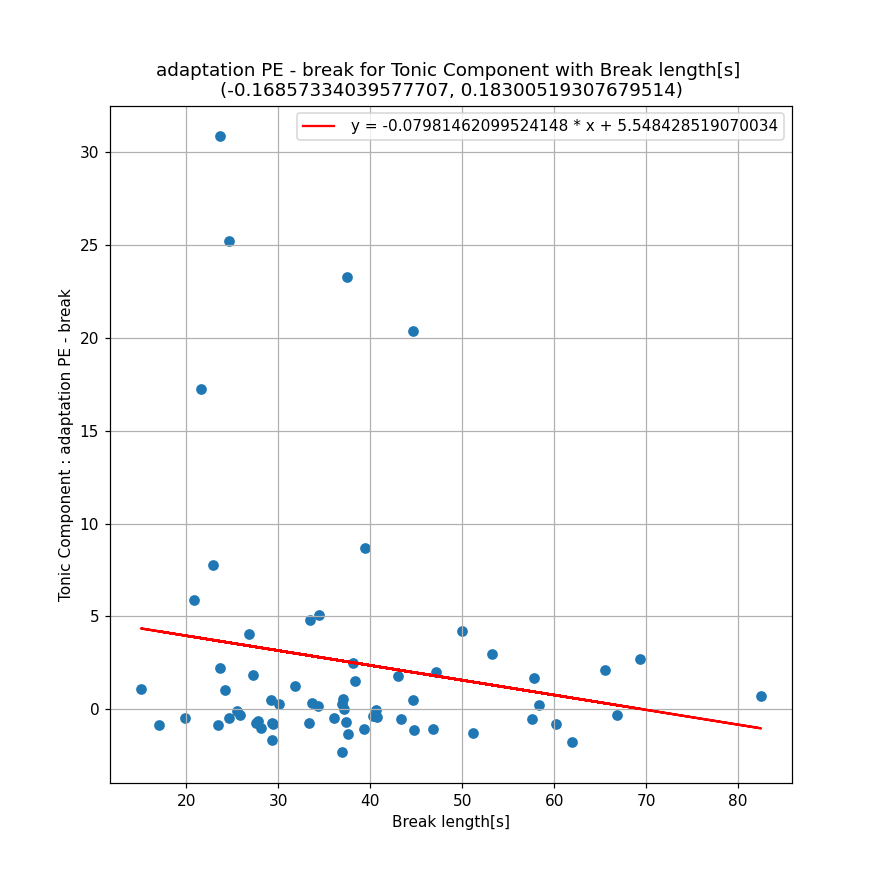

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Tonic Component :
pearson r = -0.03569359936950389 (p = 0.779469771543885)
regressive line first order :  y = -0.02239833212558111 * x + 3.1731540089341883


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Tonic Component :
pearson r = -0.005258833219721763 (p = 0.967103166319851)
regressive line first order :  y = -0.0014848113518934338 * x + 2.559690935950019


<IPython.core.display.Javascript object>




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for adaptation PE - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for adaptation PE - break : -18.64199508846803
standard deviation for differences in HR[1] for adaptation PE - break : 21.07980641098211
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8059670925140381, pvalue=9.49068379441087e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.394080455712731, pvalue=1.112426143075688e-05)
__________________________________________________
Skew : 0.7490733508982098
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for adaptation PE - break : 

Ttest results : Ttest_relResult(statistic=-7.074825916335157, pvalue=1.479944738655821e-09)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=79.0, pvalue=1.3041066034311836e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.1940646625404734 (p = 0.12439938344895488)
regressive line first order :  y = 0.29221784995821015 * x + -29.693445878692238


<IPython.core.display.Javascript object>


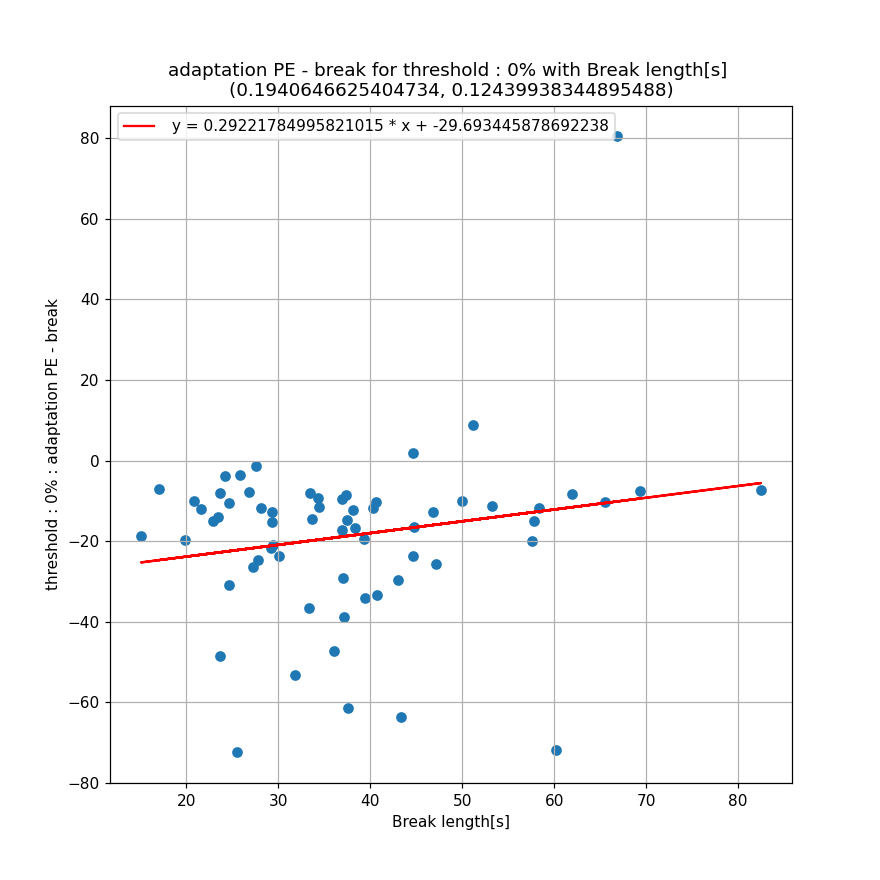

____________________________________________________________________________________________________
correlation for Age and adaptation PE - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.04667010482545472 (p = 0.7142144647802925)
regressive line first order :  y = 0.09313884079517726 * x + -21.316826172554507


<IPython.core.display.Javascript object>


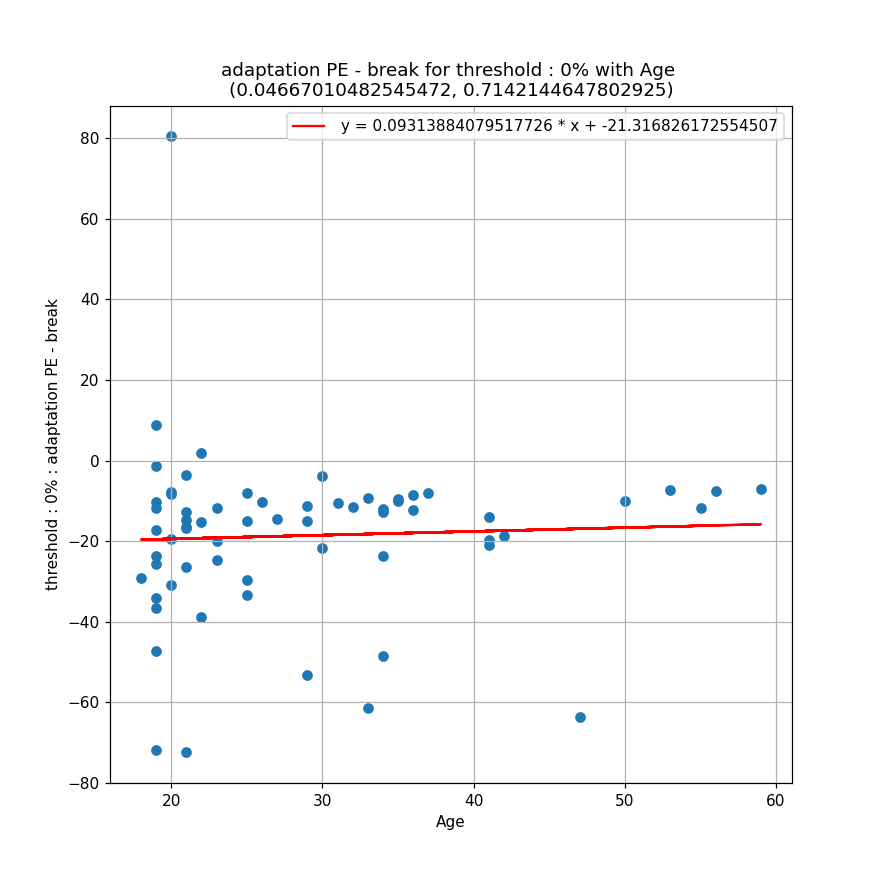

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - break in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.17555985972497198 (p = 0.16525845769708883)
regressive line first order :  y = -0.15764268504530604 * x + -15.479288719746563


<IPython.core.display.Javascript object>


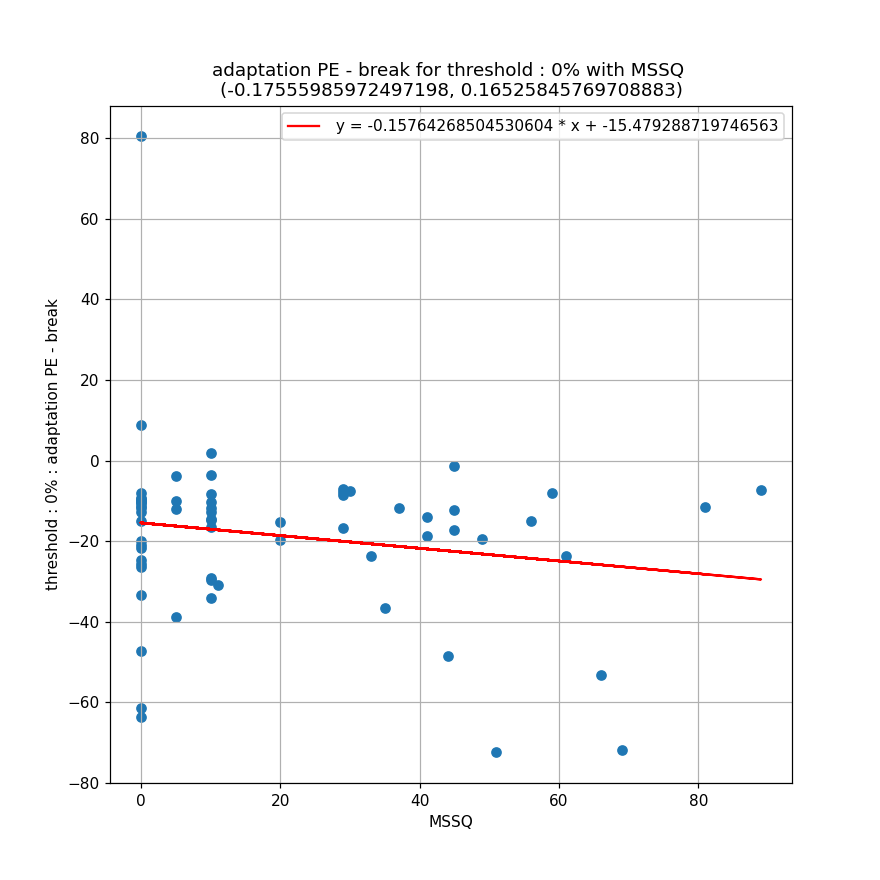




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for adaptation PE - adaptation VE : -0.25290591424191866
standard deviation for differences in Skin Conductance for adaptation PE - adaptation VE : 0.3901772661813839
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.963276743888855, pvalue=0.05395703390240669)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.1495573618316897, pvalue=0.031590244162566374)
__________________________________________________
Skew : -0.6533623649964706
__________________________________________________


<IPython.core.display.Javascript object>


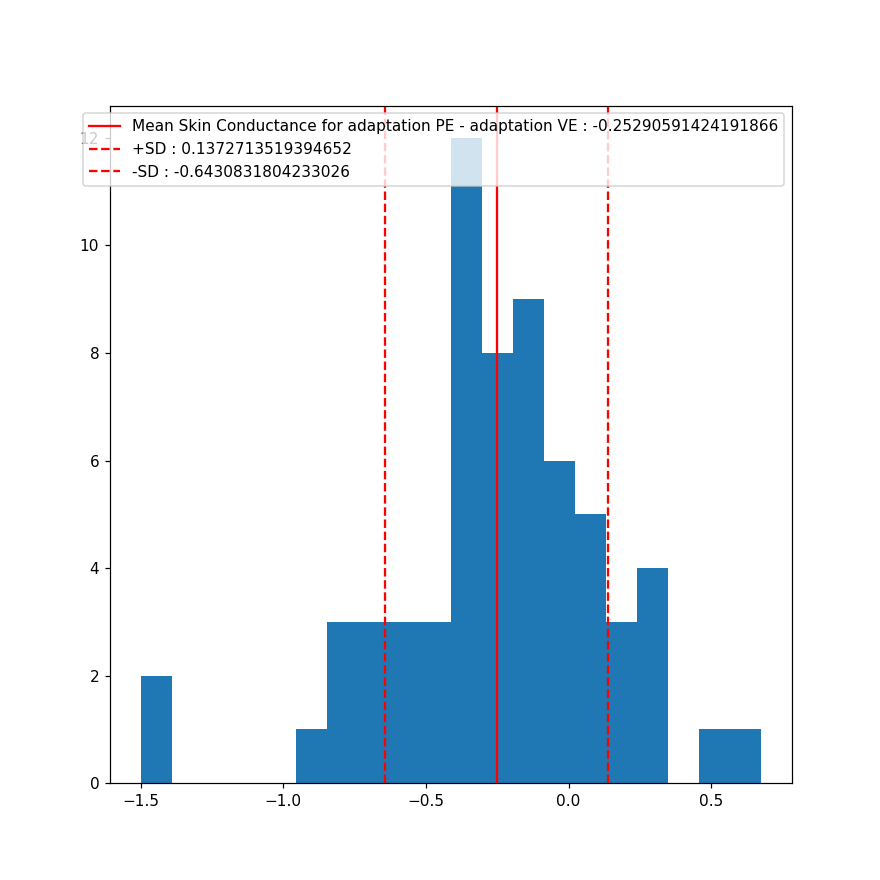

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-5.1854566867429694, pvalue=2.4300226837938967e-06)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=338.0, pvalue=2.6709193274650893e-06)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Skin Conductance :
pearson r = -0.0361522227975298 (p = 0.7767090867055705)
regressive line first order :  y = -0.0010076057280800738 * x + -0.21479905279790512


<IPython.core.display.Javascript object>


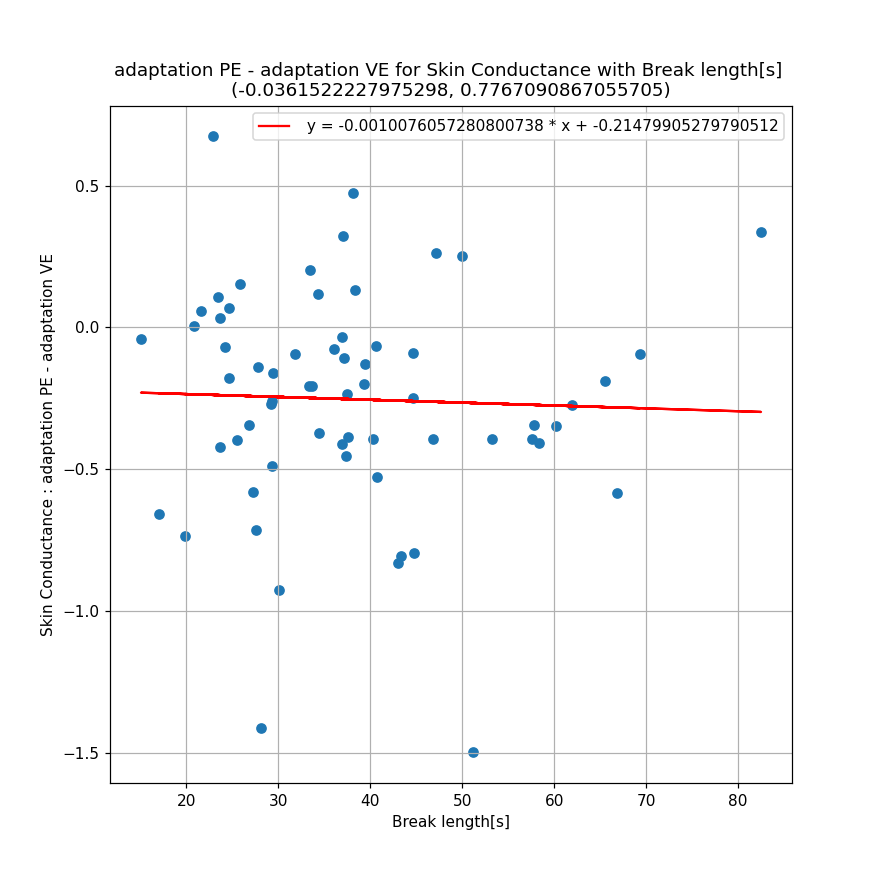

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Skin Conductance :
pearson r = 0.09895485315192819 (p = 0.43659942235688265)
regressive line first order :  y = 0.0036553123520700983 * x + -0.35788191585293155


<IPython.core.display.Javascript object>


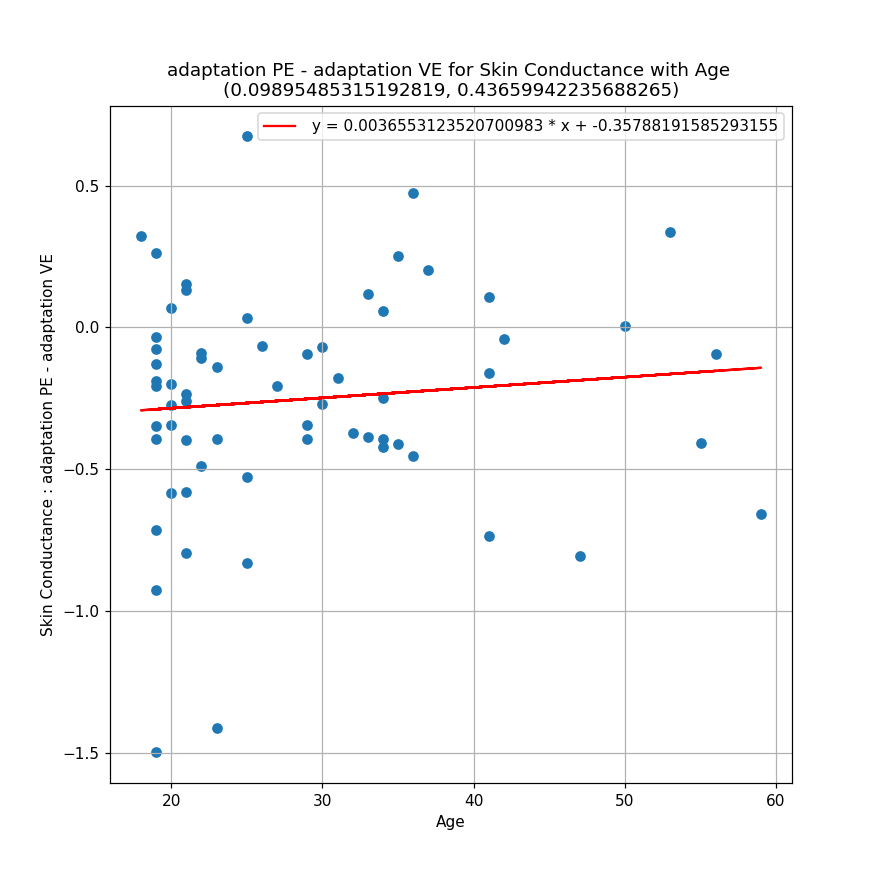

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Skin Conductance :
pearson r = 0.09979742663960654 (p = 0.43268484460308765)
regressive line first order :  y = 0.0016586825827092943 * x + -0.2861832335575237


<IPython.core.display.Javascript object>


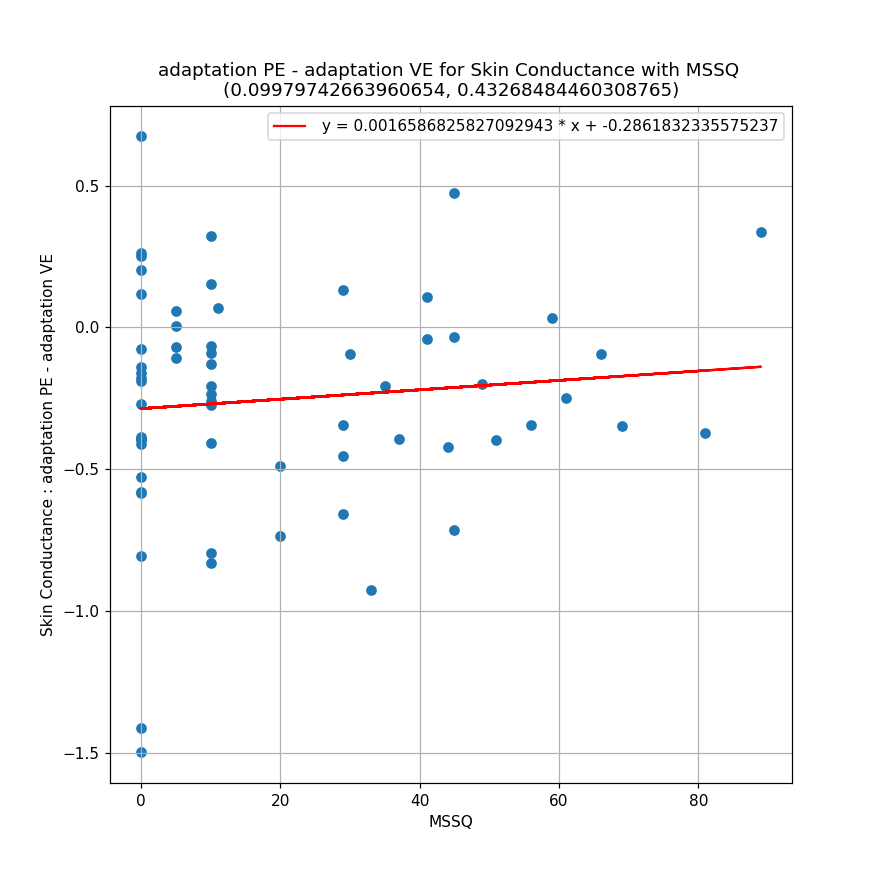




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for adaptation PE - adaptation VE : -0.11594100306745878
standard deviation for differences in Phasic Component for adaptation PE - adaptation VE : 0.6307633203485424
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.567838728427887, pvalue=1.939559407179714e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.59121504769811, pvalue=2.2548610341279905e-08)
__________________________________________________
Skew : -1.6107607894578506
__________________________________________________


<IPython.core.display.Javascript object>


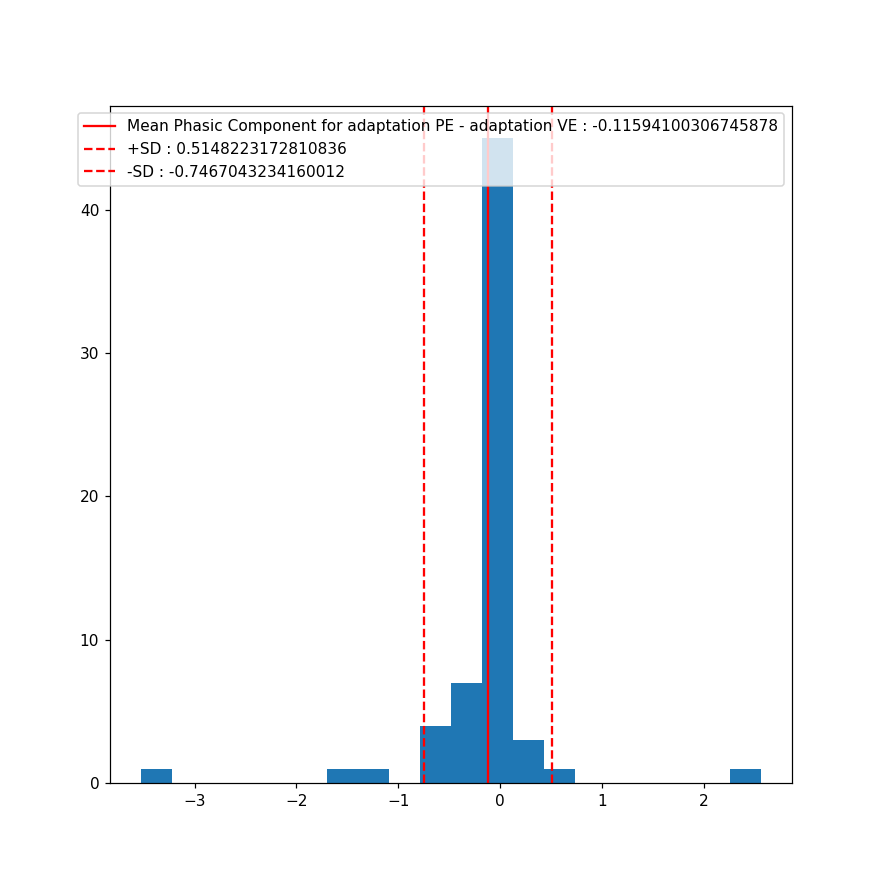

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-1.4704850371247709, pvalue=0.1464074945010088)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=640.0, pvalue=0.007472883093784643)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Phasic Component :
pearson r = 0.16529091308558658 (p = 0.1918028571677723)
regressive line first order :  y = 0.007447475288923172 * x + -0.3975987001544634


<IPython.core.display.Javascript object>


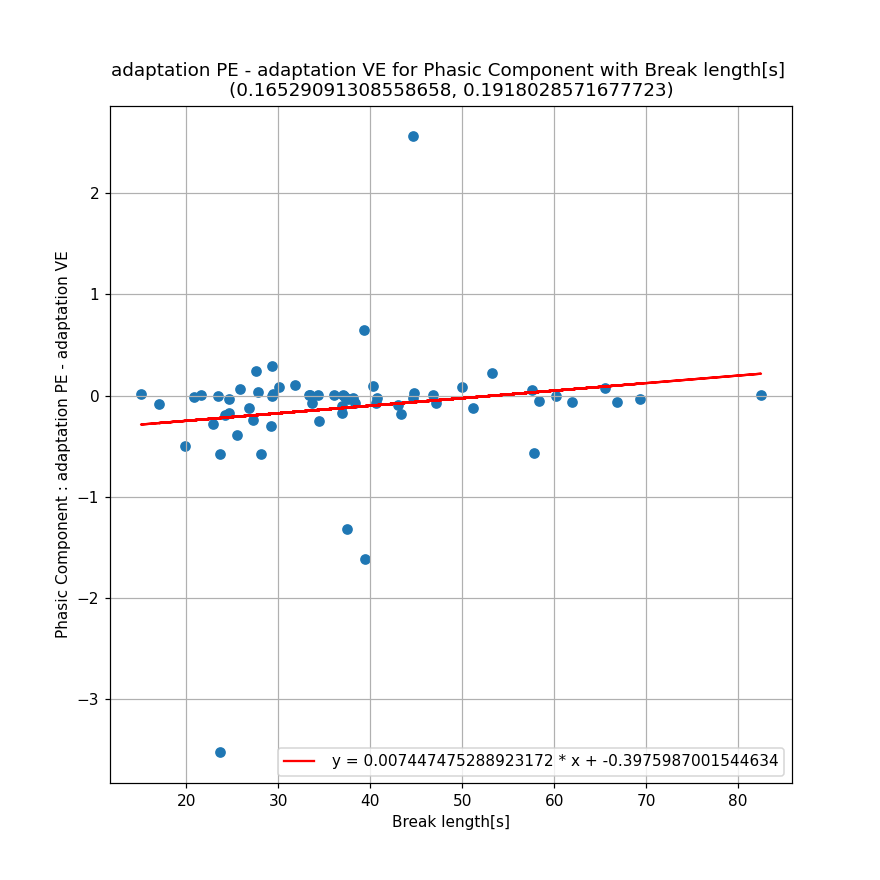

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Phasic Component :
pearson r = -0.05423699789038881 (p = 0.6703572226830937)
regressive line first order :  y = -0.0032388251808685774 * x + -0.022925992404389268


<IPython.core.display.Javascript object>


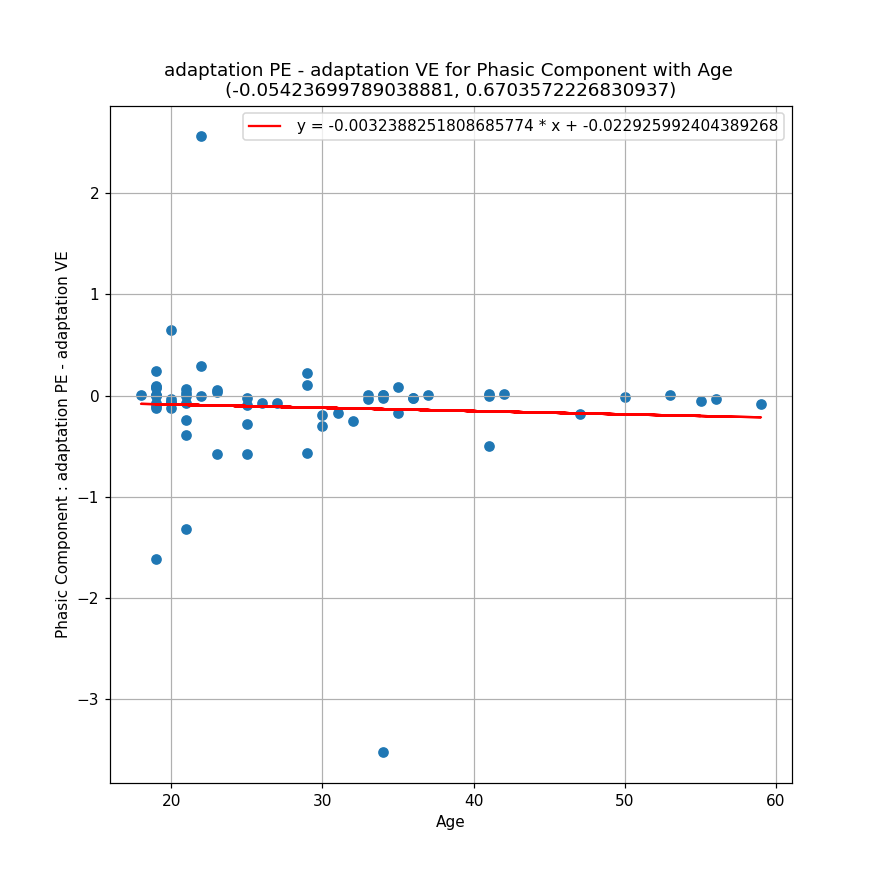

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Phasic Component :
pearson r = -0.09007226441970748 (p = 0.4790590346023314)
regressive line first order :  y = -0.0024201344386394685 * x + -0.06738705589225441


<IPython.core.display.Javascript object>


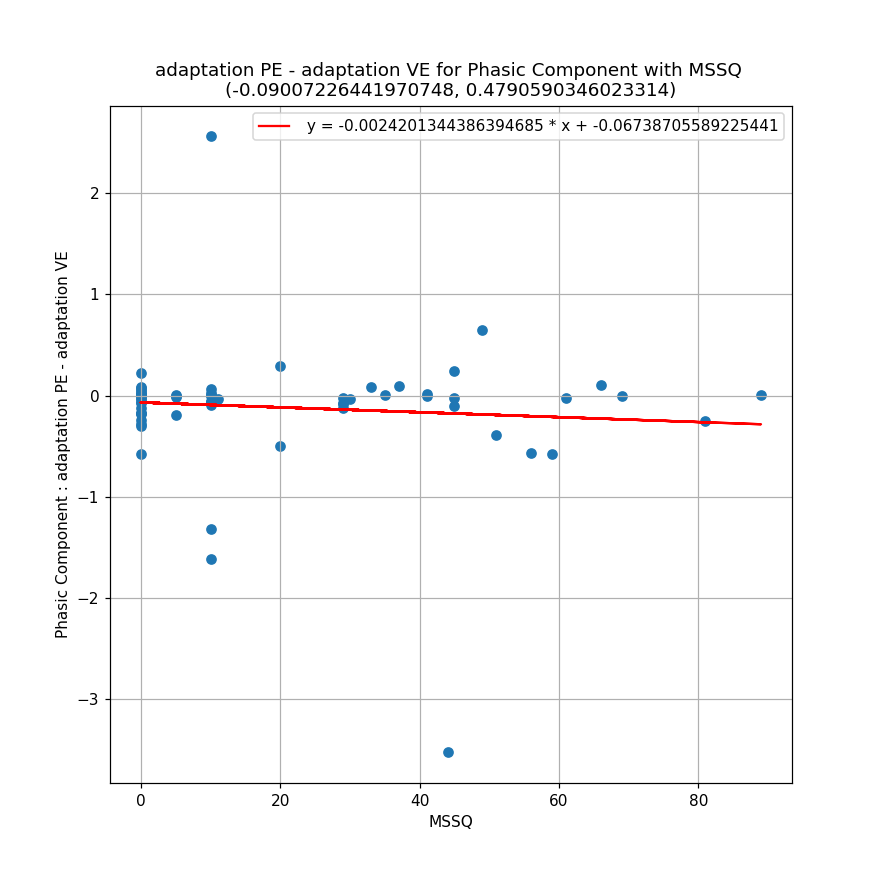




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for adaptation PE - adaptation VE : -0.5472503234449438
standard deviation for differences in Tonic Component for adaptation PE - adaptation VE : 1.2110787596266204
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.969699501991272, pvalue=0.11668615788221359)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.093588634139755, pvalue=0.03629664091359675)
__________________________________________________
Skew : -0.42771982571161743
__________________________________________________


<IPython.core.display.Javascript object>

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-3.614961085527834, pvalue=0.000597862935199117)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=538.0, pvalue=0.0007875682553027494)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Tonic Component :
pearson r = -0.26126975664280666 (p = 0.037039012645387365)
regressive line first order :  y = -0.02260243295049247 * x + 0.30755603259193875


<IPython.core.display.Javascript object>

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Tonic Component :
pearson r = 0.14394423575981716 (p = 0.2564678099306155)
regressive line first order :  y = 0.01650410961893723 * x + -1.0212277215637968


<IPython.core.display.Javascript object>


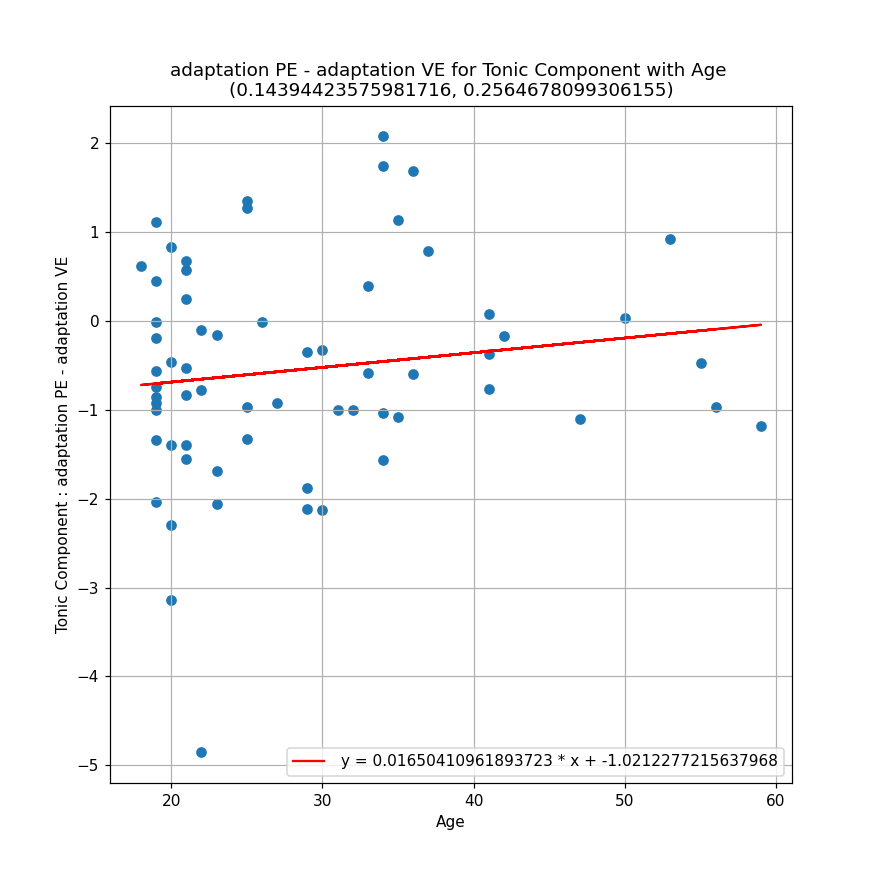

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Tonic Component :
pearson r = 0.06468996414144243 (p = 0.6115569377069762)
regressive line first order :  y = 0.0033372694880866877 * x + -0.6142042925496826


<IPython.core.display.Javascript object>


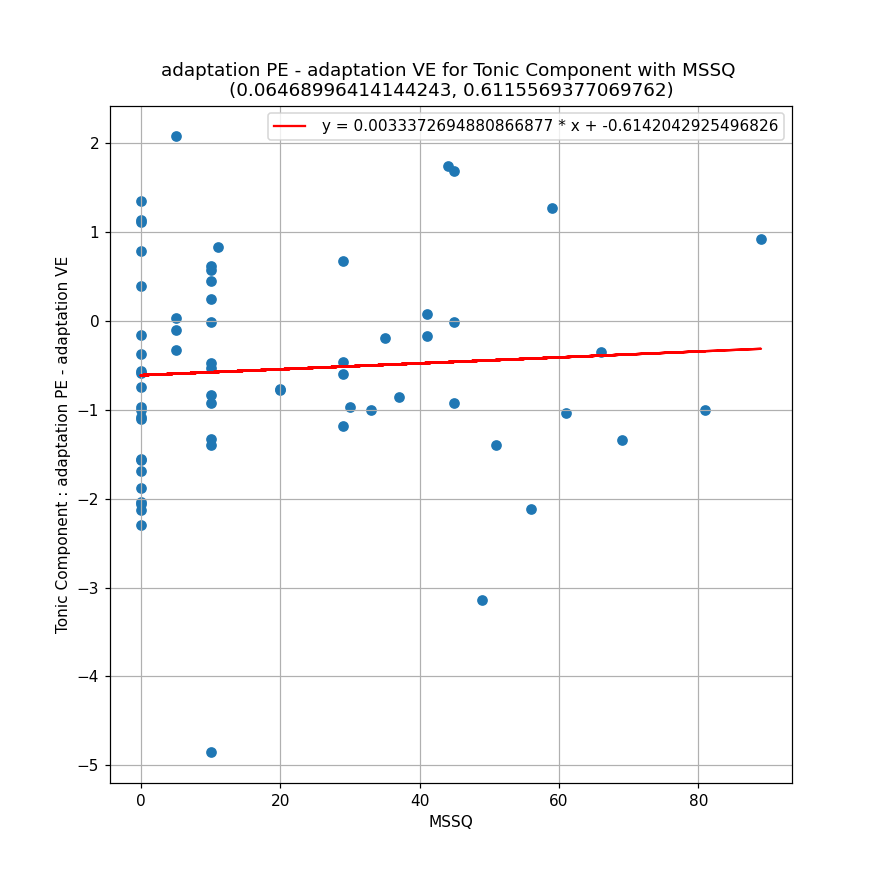




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for adaptation PE - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for adaptation PE - adaptation VE : -2.4365443237287394
standard deviation for differences in HR[1] for adaptation PE - adaptation VE : 23.185562372665373
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5553779602050781, pvalue=1.2525511227171049e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.4380003514130495, pvalue=5.388186837656961e-08)
__________________________________________________
Skew : 0.5549217050422672
__________________________________________________


<IPython.core.display.Javascript object>


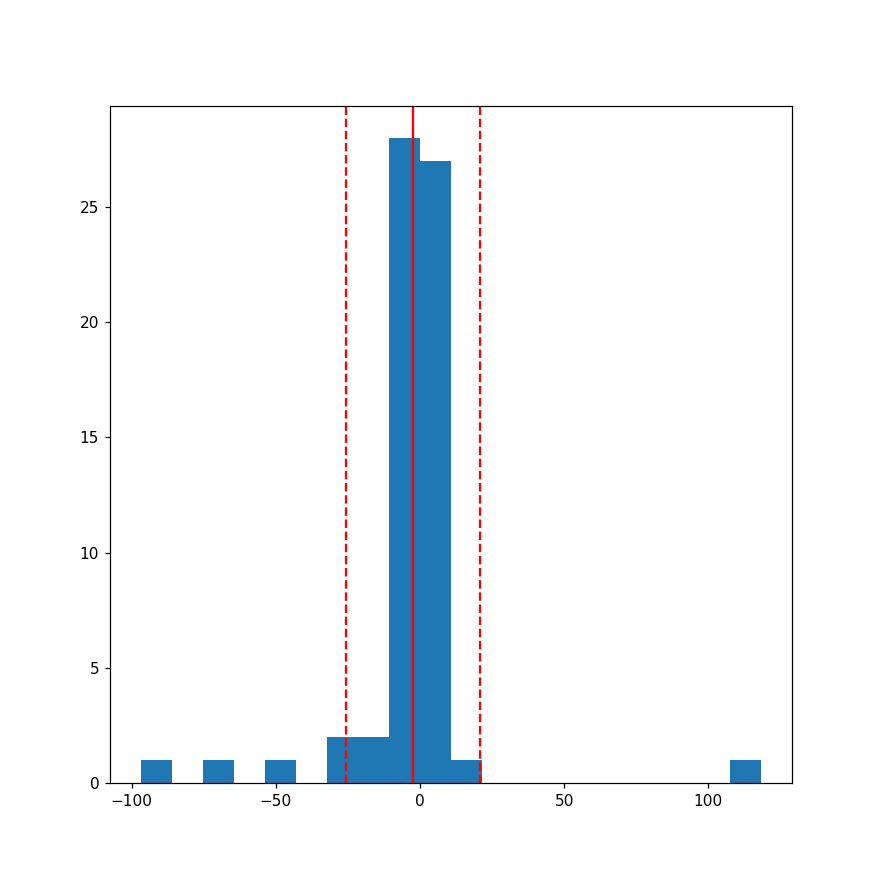

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for adaptation PE - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-0.8407108819068557, pvalue=0.40368949505406004)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=944.0, pvalue=0.5208728899052881)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.15061181144345323 (p = 0.23485800903063644)
regressive line first order :  y = 0.24944242945118578 * x + -11.87026212867457


<IPython.core.display.Javascript object>


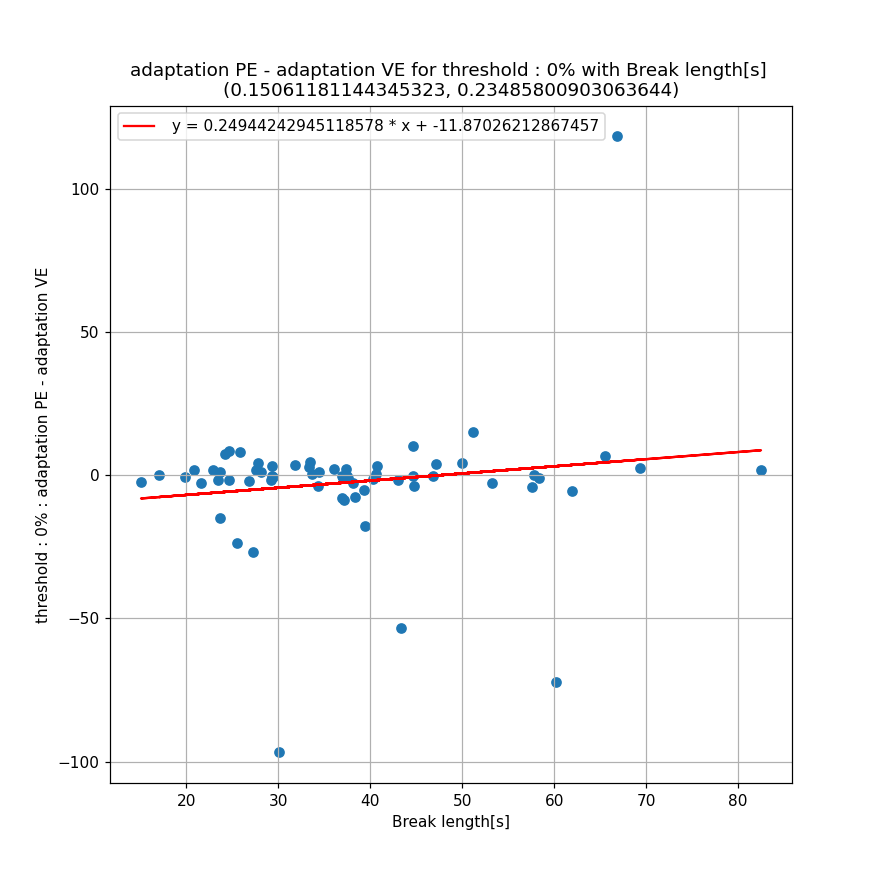

____________________________________________________________________________________________________
correlation for Age and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.001177598584542229 (p = 0.9926315515895575)
regressive line first order :  y = 0.0025848797433599842 * x + -2.5107788388583567


<IPython.core.display.Javascript object>


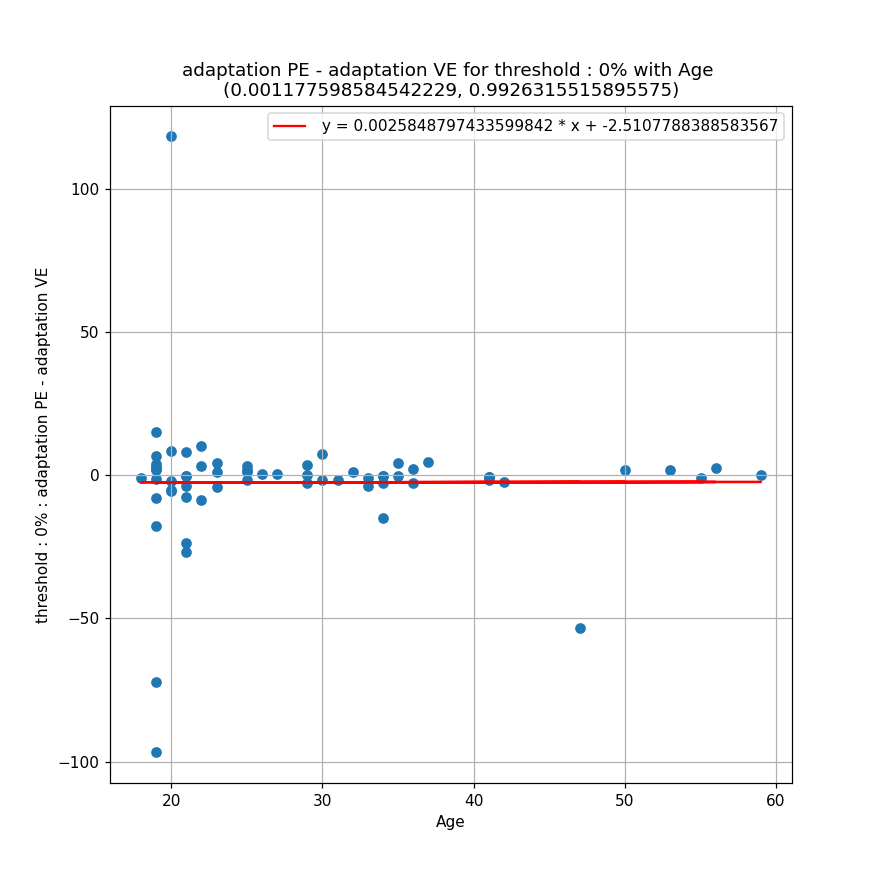

____________________________________________________________________________________________________
correlation for MSSQ and adaptation PE - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.21168890955866504 (p = 0.09310859244512269)
regressive line first order :  y = -0.20907288886542505 * x + 1.7579805091338514


<IPython.core.display.Javascript object>


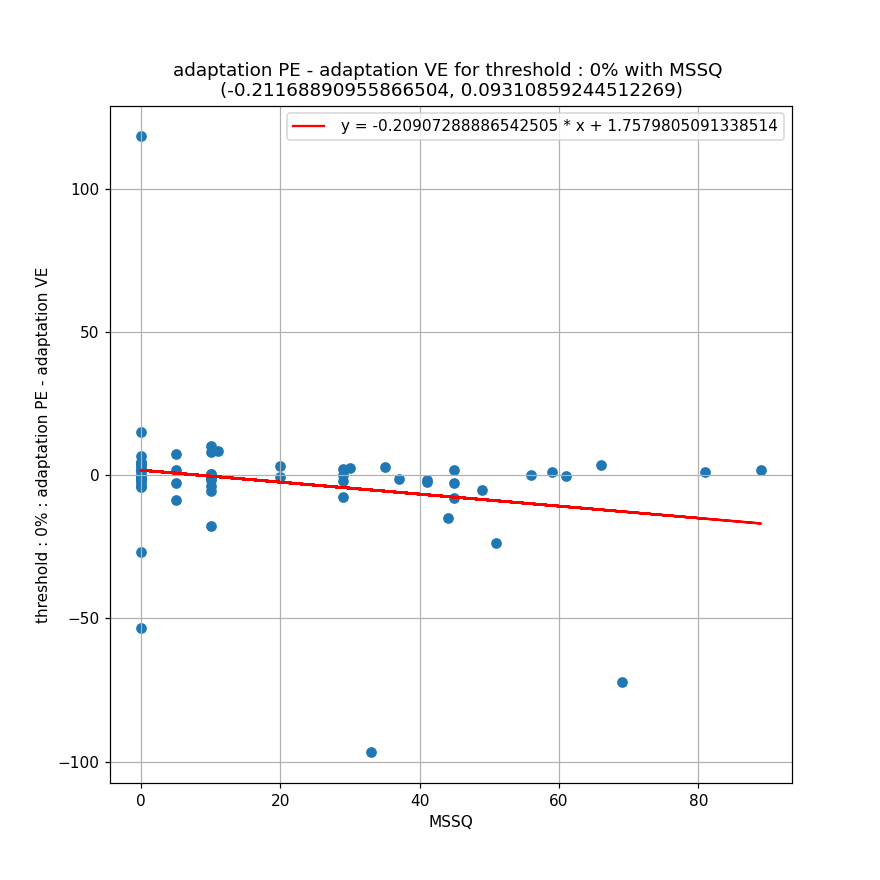




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for instruction - break : -0.40414574488935395
standard deviation for differences in Skin Conductance for instruction - break : 0.5402771257705969
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8234680891036987, pvalue=2.7998075324831007e-07)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=3.8245208402144644, pvalue=0.00013102666315449672)
__________________________________________________
Skew : -1.923677258222796
__________________________________________________


<IPython.core.display.Javascript object>


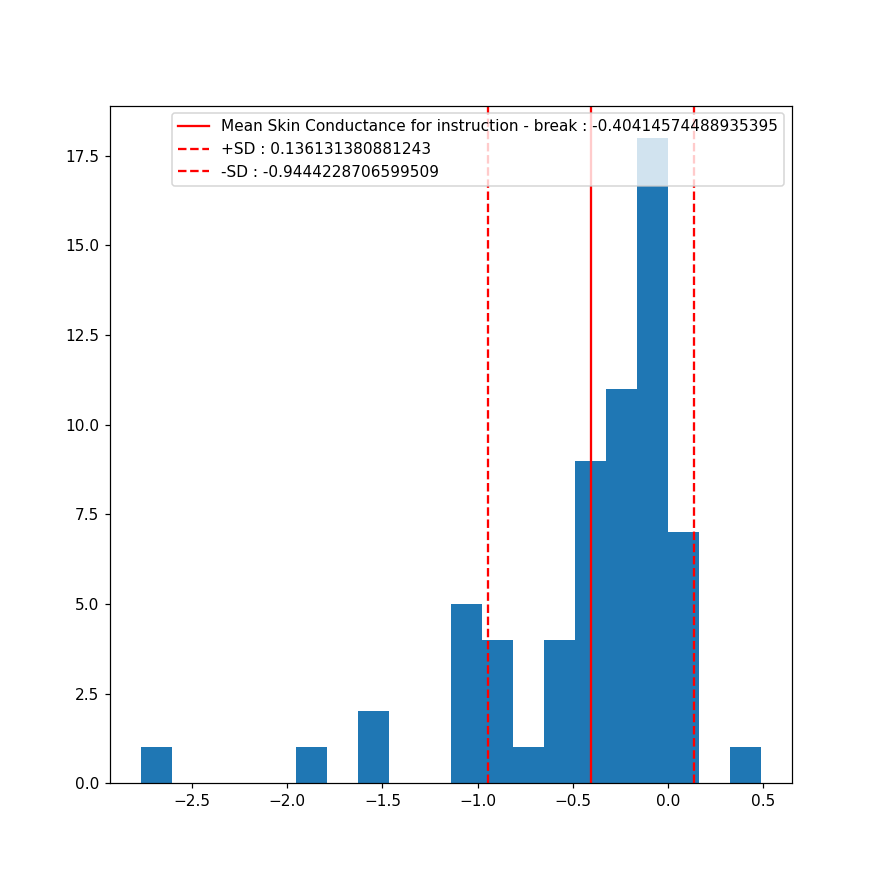

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for instruction - break : 

Ttest results : Ttest_relResult(statistic=-5.984273264398095, pvalue=1.128904761940322e-07)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=140.0, pvalue=1.7576449327996724e-09)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Skin Conductance :
pearson r = 0.10496707094480781 (p = 0.4091048626949124)
regressive line first order :  y = 0.004051010052285478 * x + -0.5573517802151869


<IPython.core.display.Javascript object>


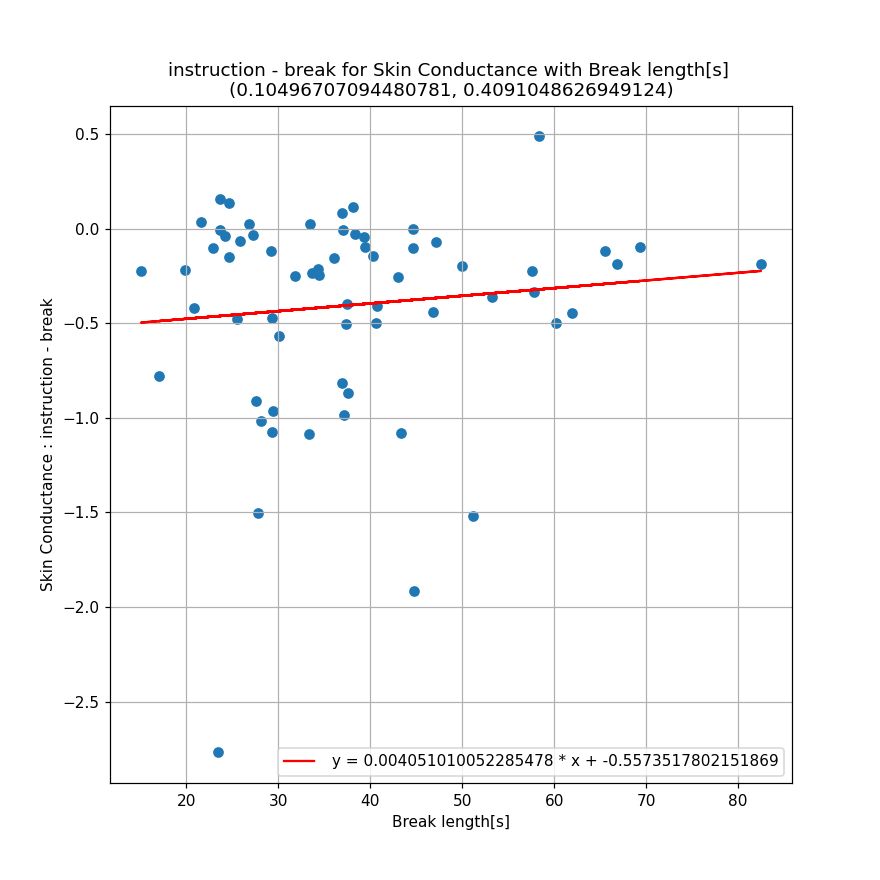

____________________________________________________________________________________________________
correlation for Age and instruction - break in Skin Conductance :
pearson r = -0.0010526908856824321 (p = 0.993413103417778)
regressive line first order :  y = -5.3844689568450106e-05 * x + -0.4025993927108097


<IPython.core.display.Javascript object>


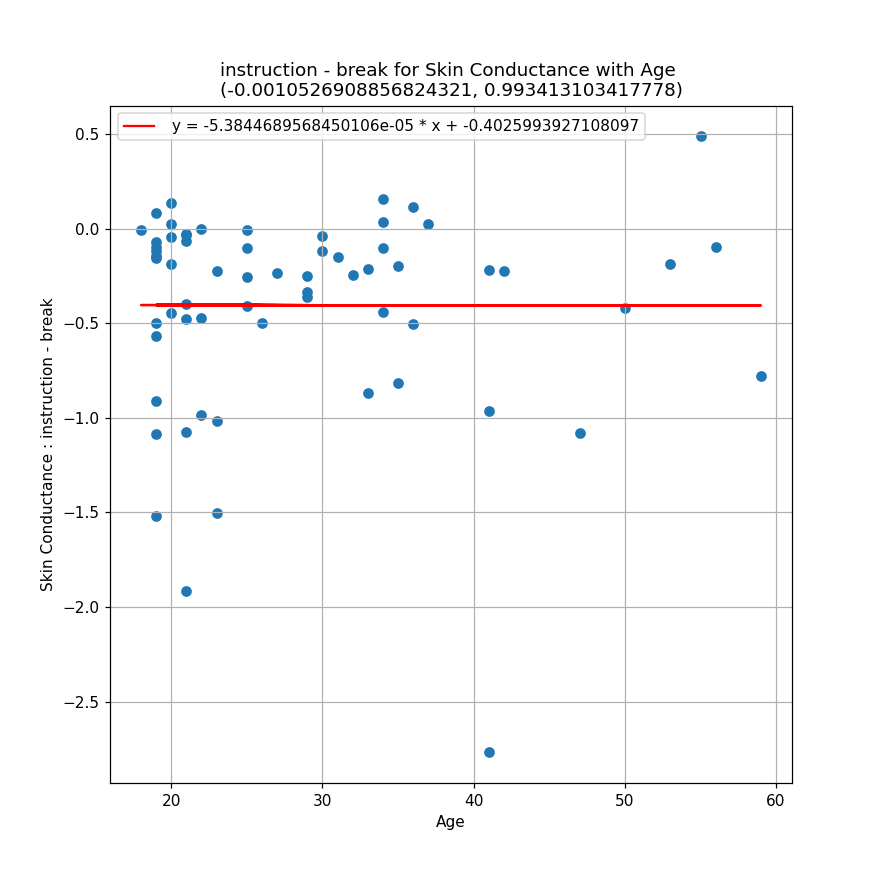

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Skin Conductance :
pearson r = 0.08090004790753993 (p = 0.5251105114489395)
regressive line first order :  y = 0.0018618613629713327 * x + -0.44149933848396605


<IPython.core.display.Javascript object>


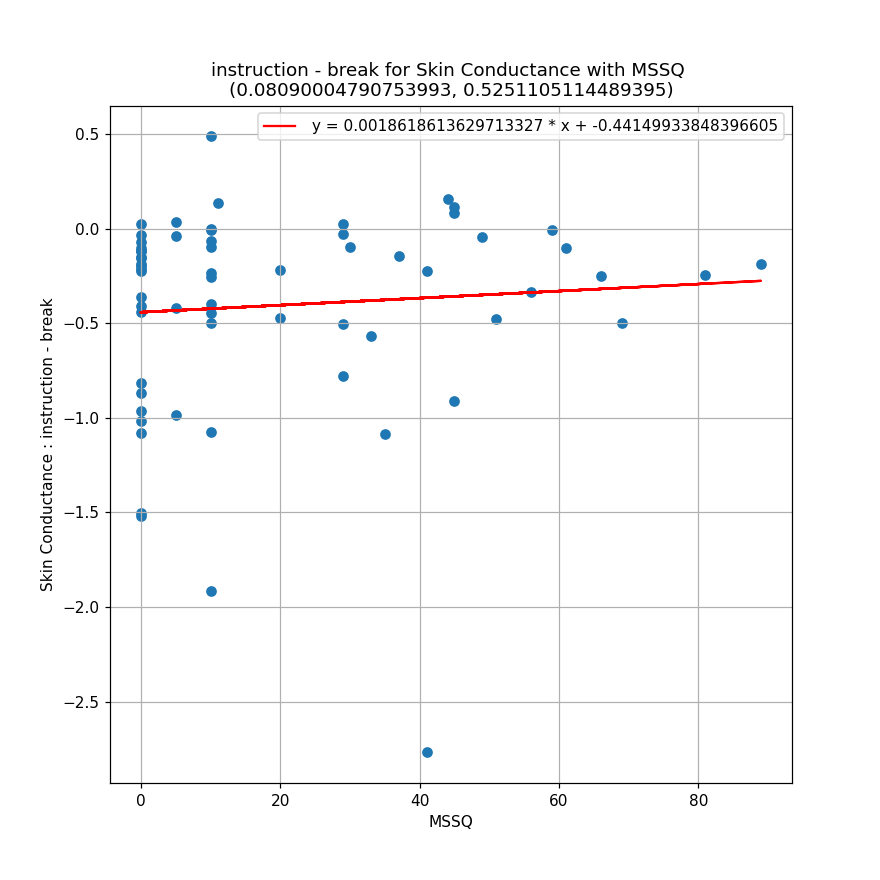




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for instruction - break : -2.3131436219466335
standard deviation for differences in Phasic Component for instruction - break : 5.229910121513421
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5529558658599854, pvalue=1.1516412823375788e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.036104573905845, pvalue=4.751010715433824e-07)
__________________________________________________
Skew : -3.2584888749295473
__________________________________________________


<IPython.core.display.Javascript object>


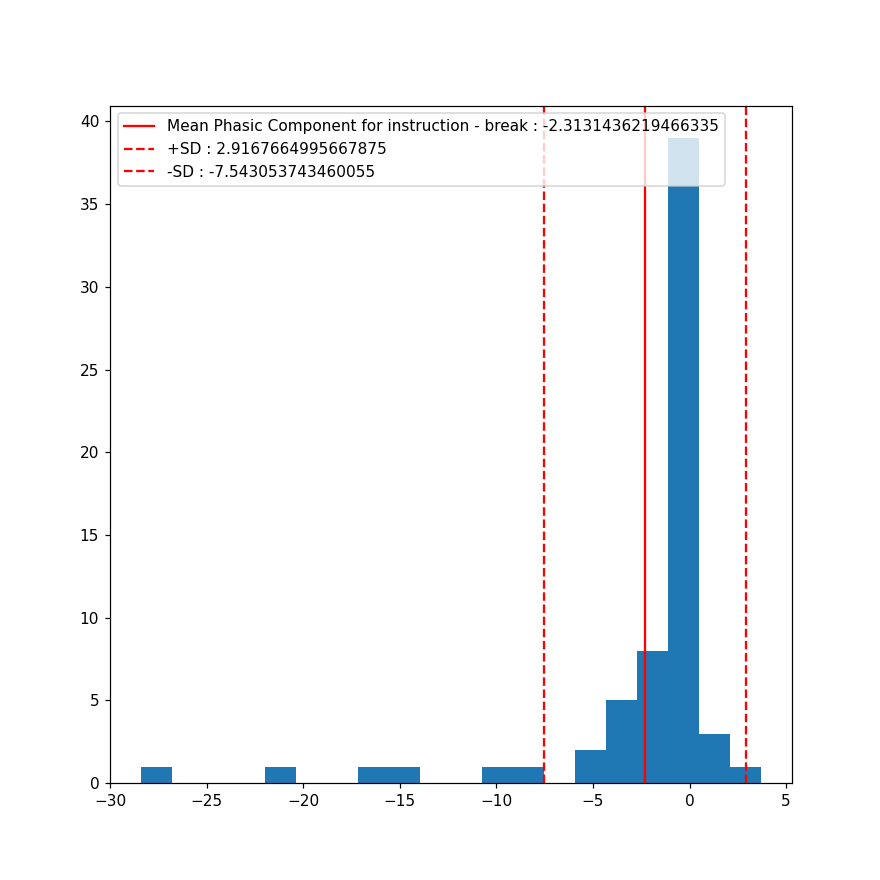

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for instruction - break : 

Ttest results : Ttest_relResult(statistic=-3.538330209433519, pvalue=0.0007624544221168367)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=200.0, pvalue=1.9373574696720898e-08)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Phasic Component :
pearson r = 0.10813174507214608 (p = 0.3950459850638382)
regressive line first order :  y = 0.04039625441412207 * x + -3.8408984043149674


<IPython.core.display.Javascript object>


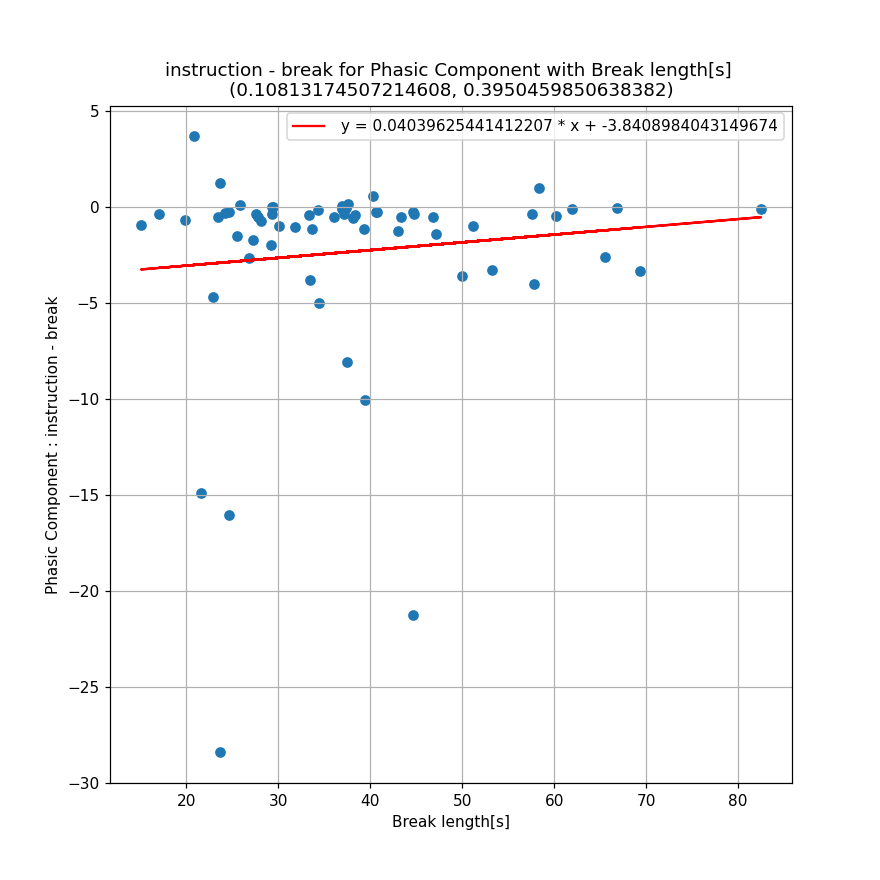

____________________________________________________________________________________________________
correlation for Age and instruction - break in Phasic Component :
pearson r = 0.07543436478313917 (p = 0.5535653683438613)
regressive line first order :  y = 0.037349852998329755 * x + -3.3857847127424145


<IPython.core.display.Javascript object>


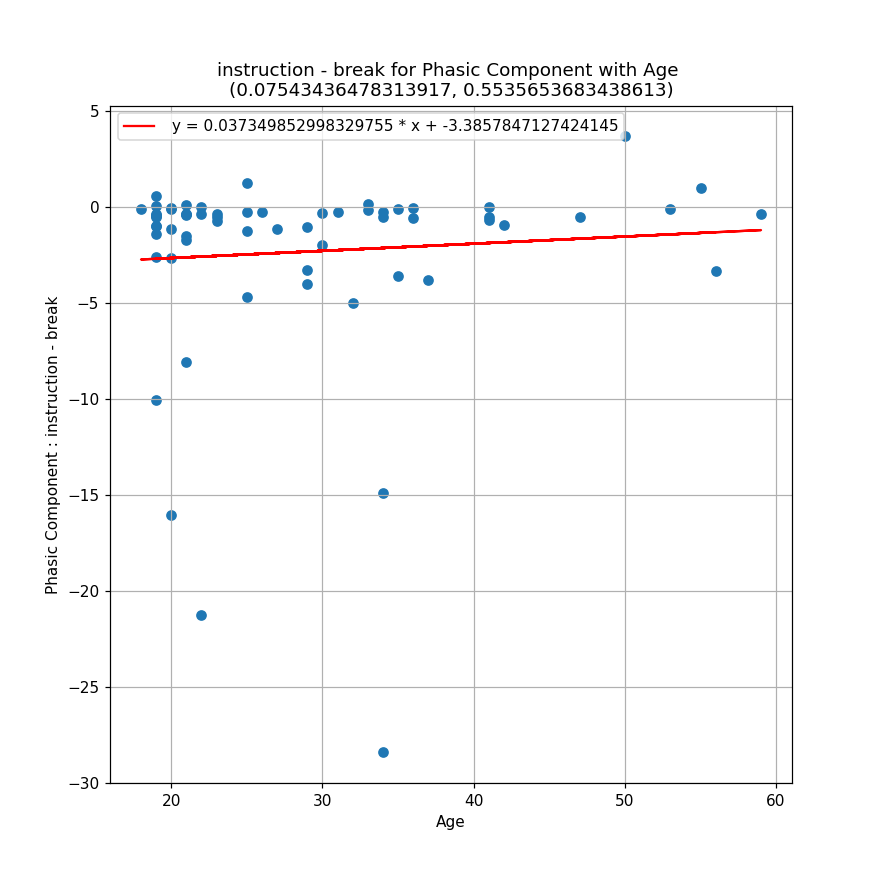

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Phasic Component :
pearson r = -0.009175914172853558 (p = 0.942632148317975)
regressive line first order :  y = -0.002044210186753647 * x + -2.2721316550748876


<IPython.core.display.Javascript object>


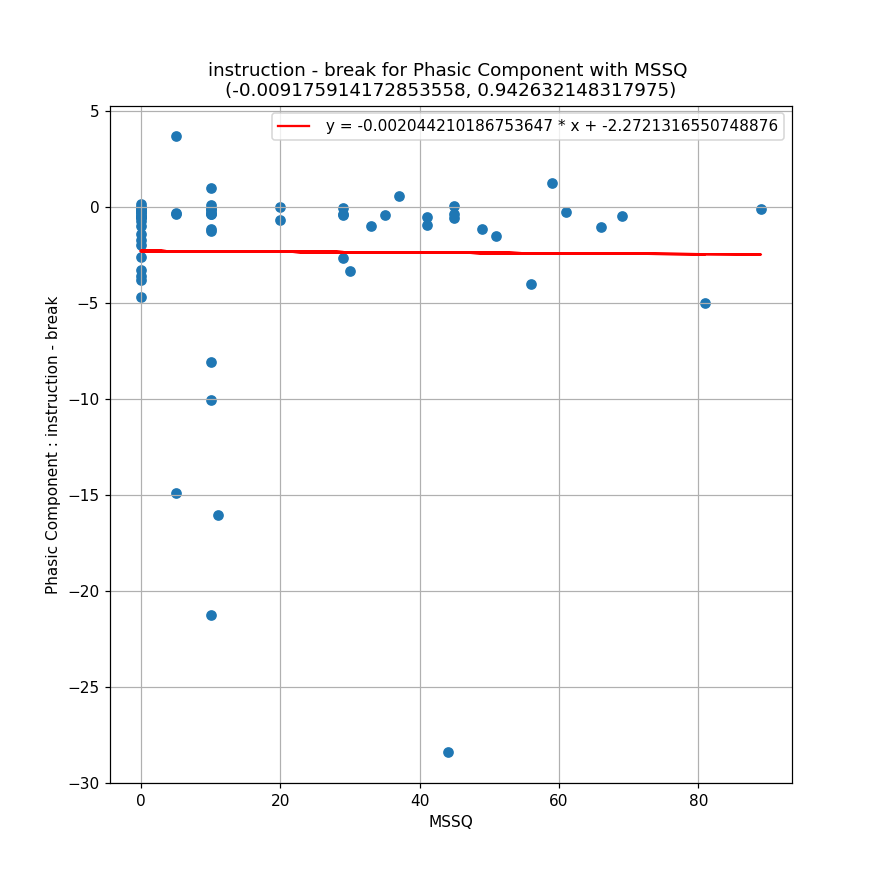




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for instruction - break : 1.4821612215027704
standard deviation for differences in Tonic Component for instruction - break : 5.646084271219076
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5783933997154236, pvalue=2.8286932258342334e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.943369770894517, pvalue=7.67836483475594e-07)
__________________________________________________
Skew : 3.173512911878682
__________________________________________________


<IPython.core.display.Javascript object>


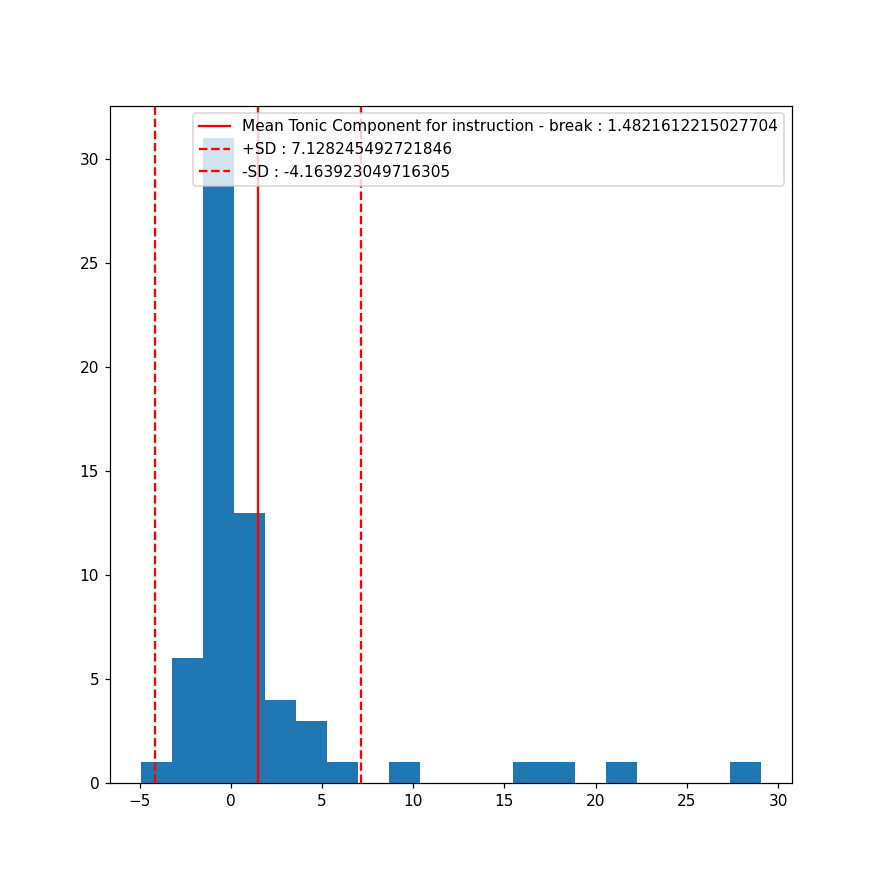

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for instruction - break : 

Ttest results : Ttest_relResult(statistic=2.100090824443539, pvalue=0.03973076449934634)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=1011.0, pvalue=0.8462247135727818)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Tonic Component :
pearson r = -0.1290462635440692 (p = 0.3094960685427498)
regressive line first order :  y = -0.05204589147047654 * x + 3.45049617606348


<IPython.core.display.Javascript object>


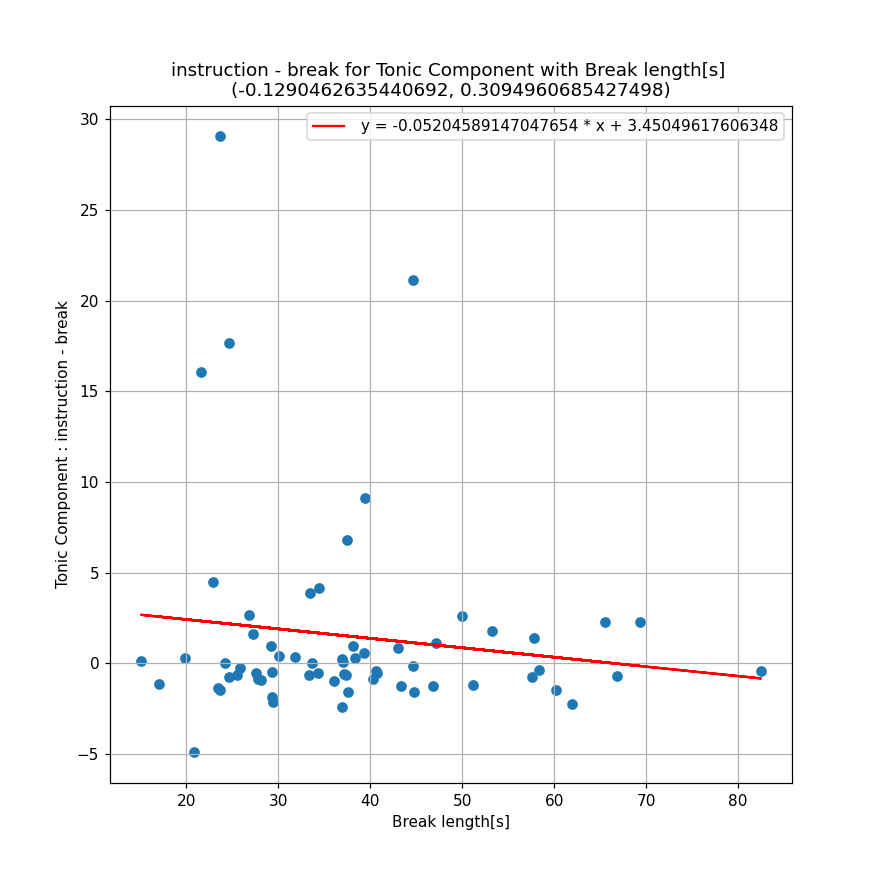

____________________________________________________________________________________________________
correlation for Age and instruction - break in Tonic Component :
pearson r = -0.07483196534126091 (p = 0.5567459975643289)
regressive line first order :  y = -0.039999995390283545 * x + 2.6309110891174745


<IPython.core.display.Javascript object>


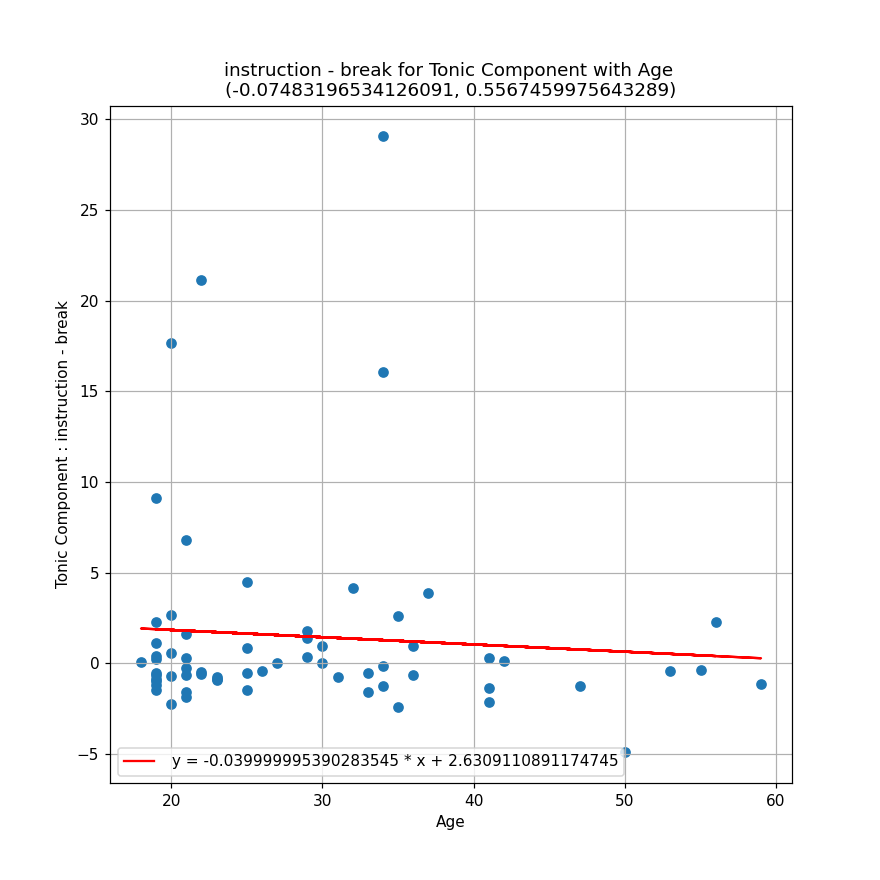

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Tonic Component :
pearson r = 0.01957894056408199 (p = 0.8779573749258435)
regressive line first order :  y = 0.0047088897678885236 * x + 1.3876891205345065


<IPython.core.display.Javascript object>


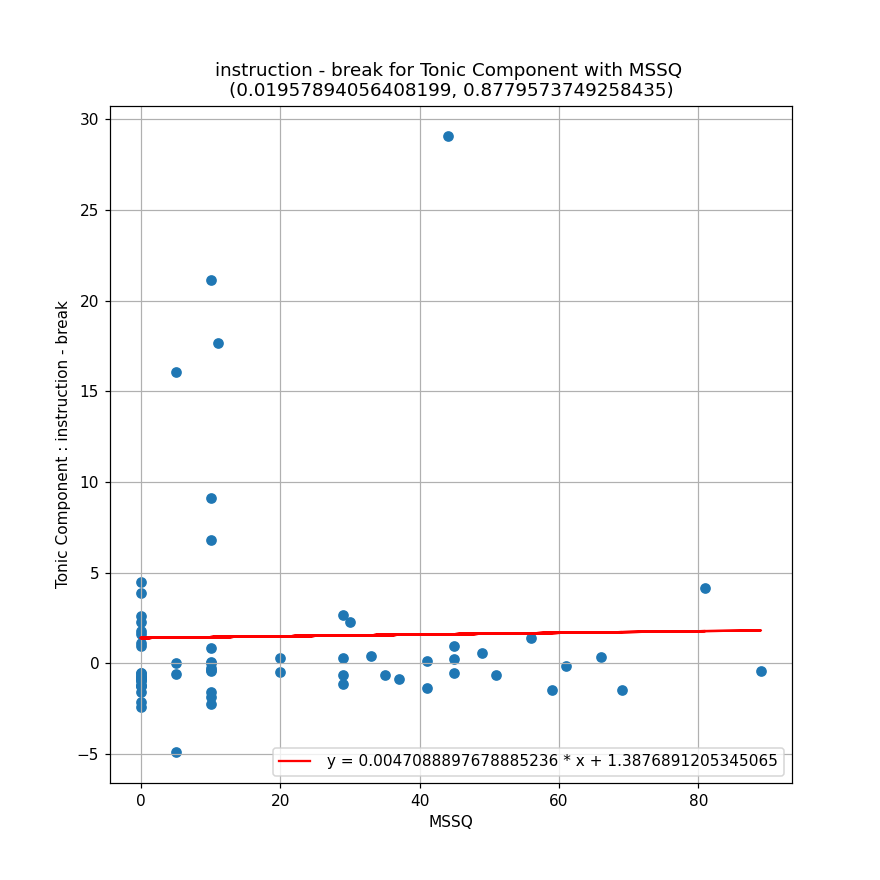




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for instruction - break _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for instruction - break : -14.968774038501737
standard deviation for differences in HR[1] for instruction - break : 18.12680299151939
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.8593689799308777, pvalue=3.201282197551336e-06)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=2.731680270362165, pvalue=0.006301225823510125)
__________________________________________________
Skew : -0.6178015882858184
__________________________________________________


<IPython.core.display.Javascript object>


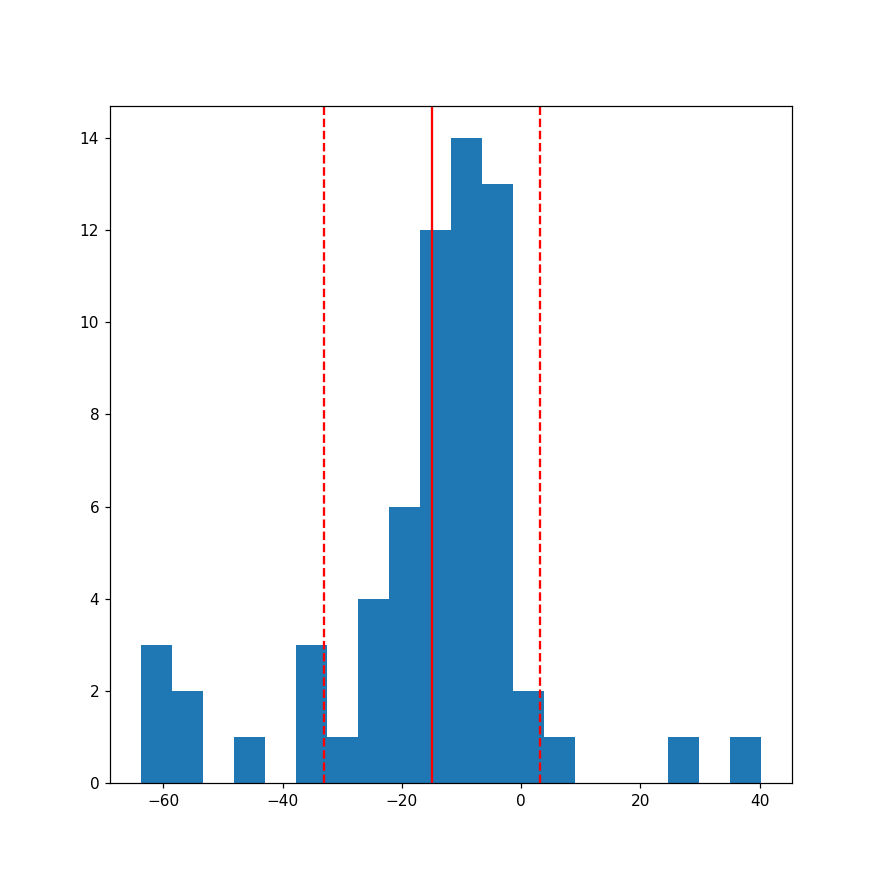

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for instruction - break : 

Ttest results : Ttest_relResult(statistic=-6.60625000249845, pvalue=9.656036140112103e-09)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=123.0, pvalue=8.654036635008001e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.09221172060061006 (p = 0.46863574395300606)
regressive line first order :  y = 0.11939908589080062 * x + -19.48435418635595


<IPython.core.display.Javascript object>


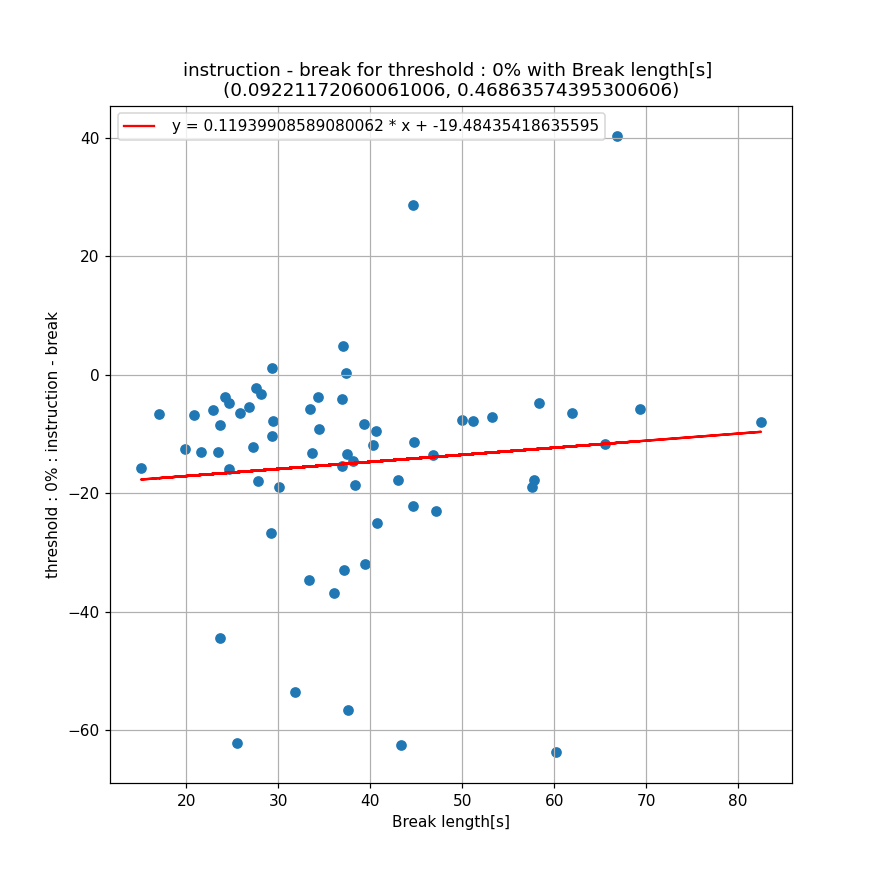

____________________________________________________________________________________________________
correlation for Age and instruction - break in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.02466954279818764 (p = 0.8465705296356542)
regressive line first order :  y = 0.04233579790599054 * x + -16.18460523461439


<IPython.core.display.Javascript object>


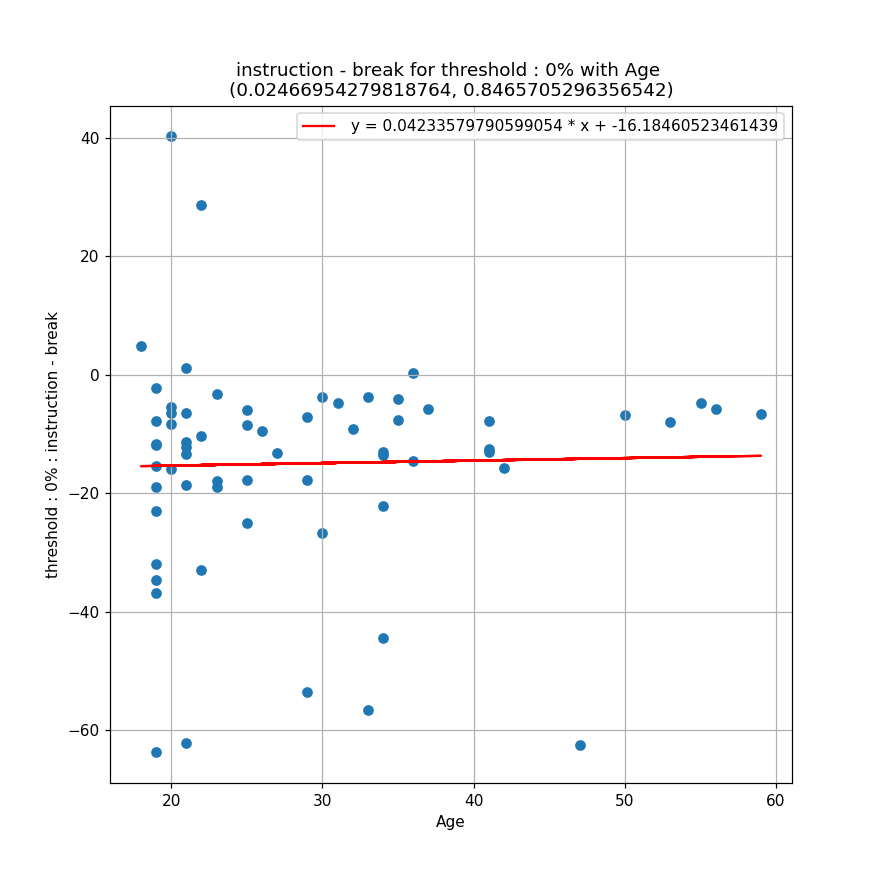

____________________________________________________________________________________________________
correlation for MSSQ and instruction - break in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.2319534447136433 (p = 0.06514005305820197)
regressive line first order :  y = -0.17910347875839785 * x + -11.375510495911373


<IPython.core.display.Javascript object>


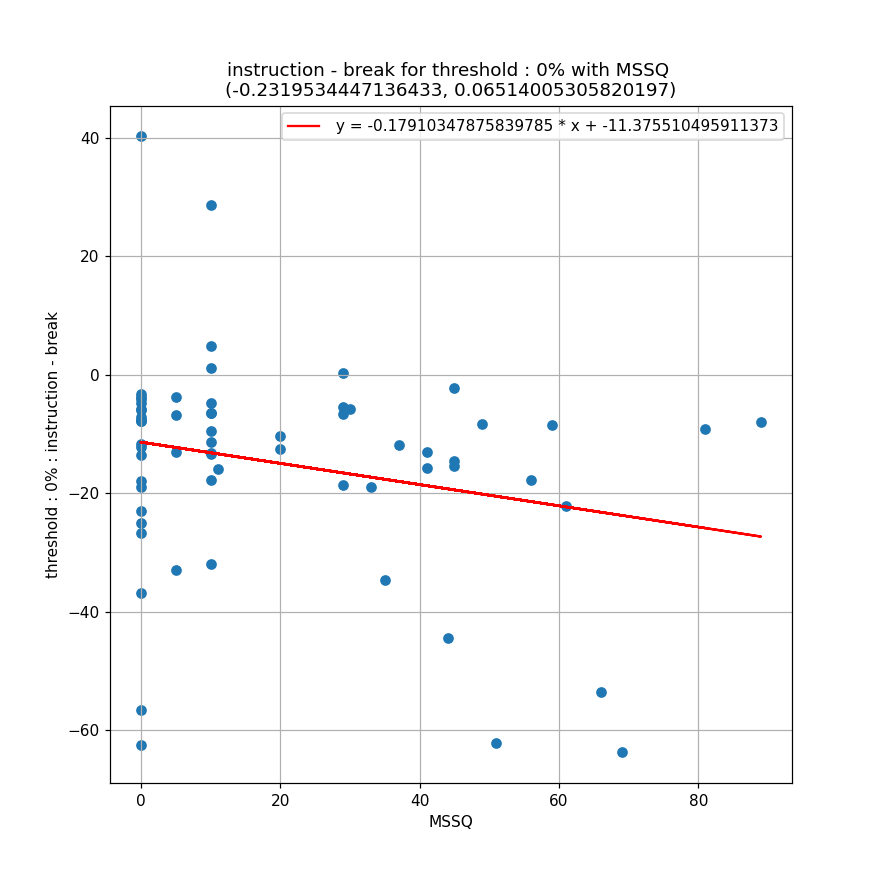




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for instruction - adaptation VE : -0.21131914931388346
standard deviation for differences in Skin Conductance for instruction - adaptation VE : 0.36727108523423346
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.9540634155273438, pvalue=0.018221784383058548)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=1.5576741378995747, pvalue=0.11931051418163126)
__________________________________________________
Skew : -0.7926019908207348
__________________________________________________


<IPython.core.display.Javascript object>


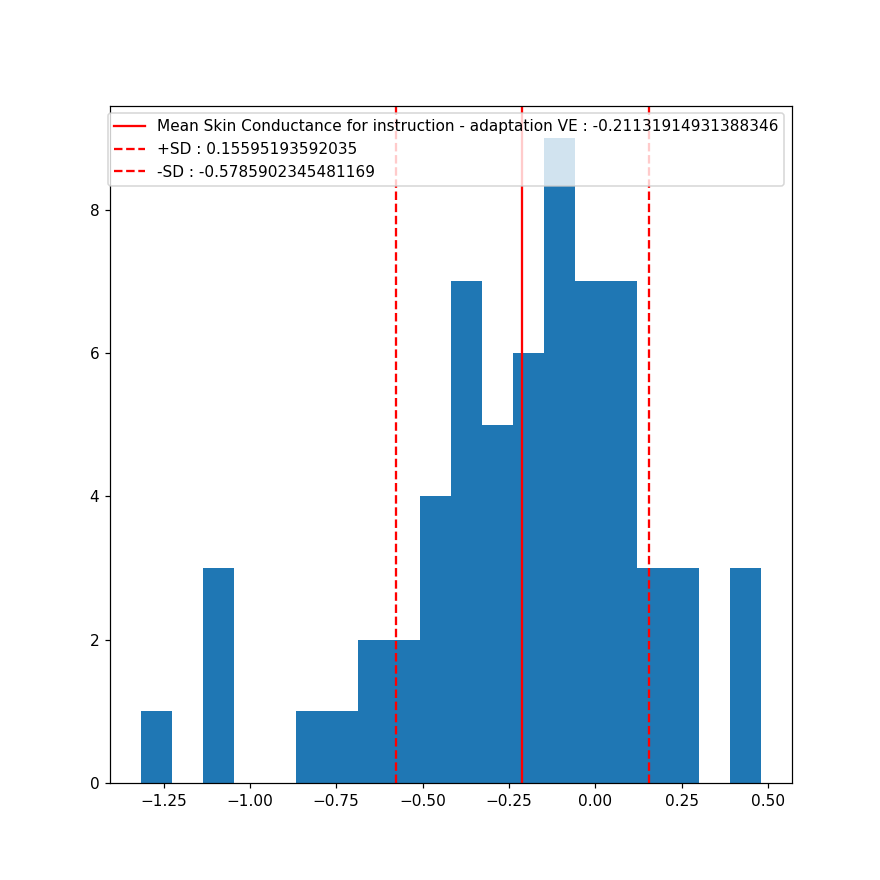

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-4.603011950785312, pvalue=2.0700622492450034e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=417.0, pvalue=3.095623039605578e-05)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Skin Conductance :
pearson r = -0.20896652730649212 (p = 0.09749232737241775)
regressive line first order :  y = -0.005482228401422949 * x + -0.003985554163006124


<IPython.core.display.Javascript object>


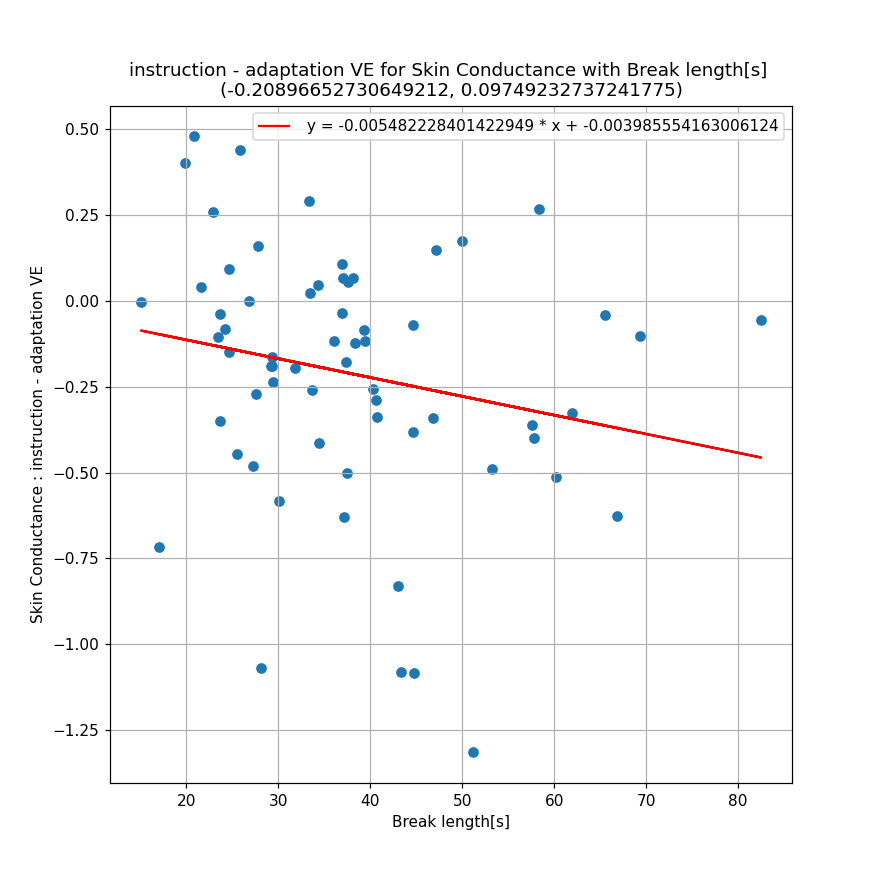

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Skin Conductance :
pearson r = 0.14288347733082568 (p = 0.26002605969373366)
regressive line first order :  y = 0.004968144090907025 * x + -0.3539980374246194


<IPython.core.display.Javascript object>


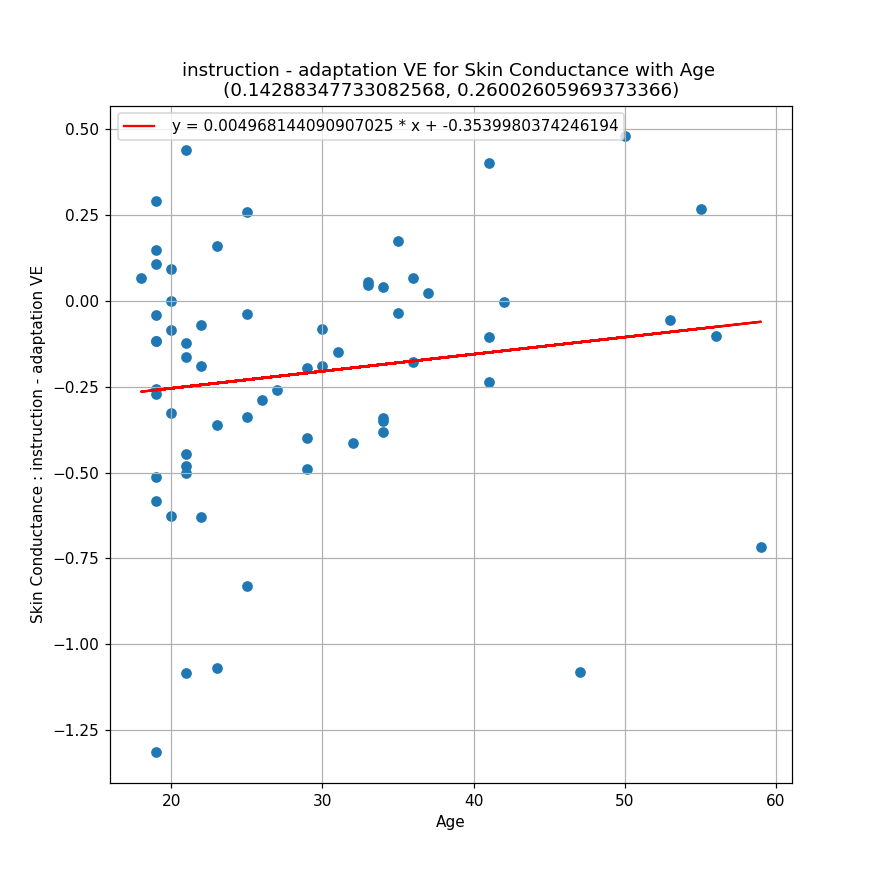

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Skin Conductance :
pearson r = 0.017601454461666714 (p = 0.8902032715414826)
regressive line first order :  y = 0.0002753704122016278 * x + -0.21684376820867848


<IPython.core.display.Javascript object>


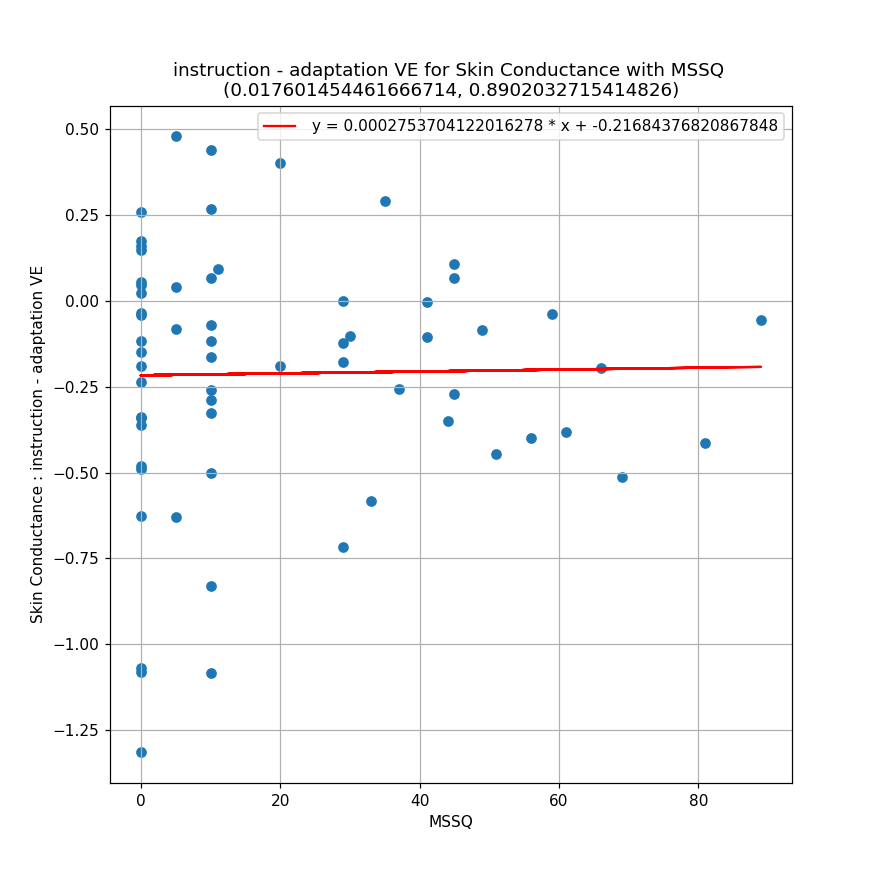




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for instruction - adaptation VE : 0.9431840361068242
standard deviation for differences in Phasic Component for instruction - adaptation VE : 2.512097543844638
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.44935137033462524, pvalue=4.141976881920015e-14)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.635651902352348, pvalue=1.7439733948080454e-08)
__________________________________________________
Skew : 4.1233048209851875
__________________________________________________


<IPython.core.display.Javascript object>


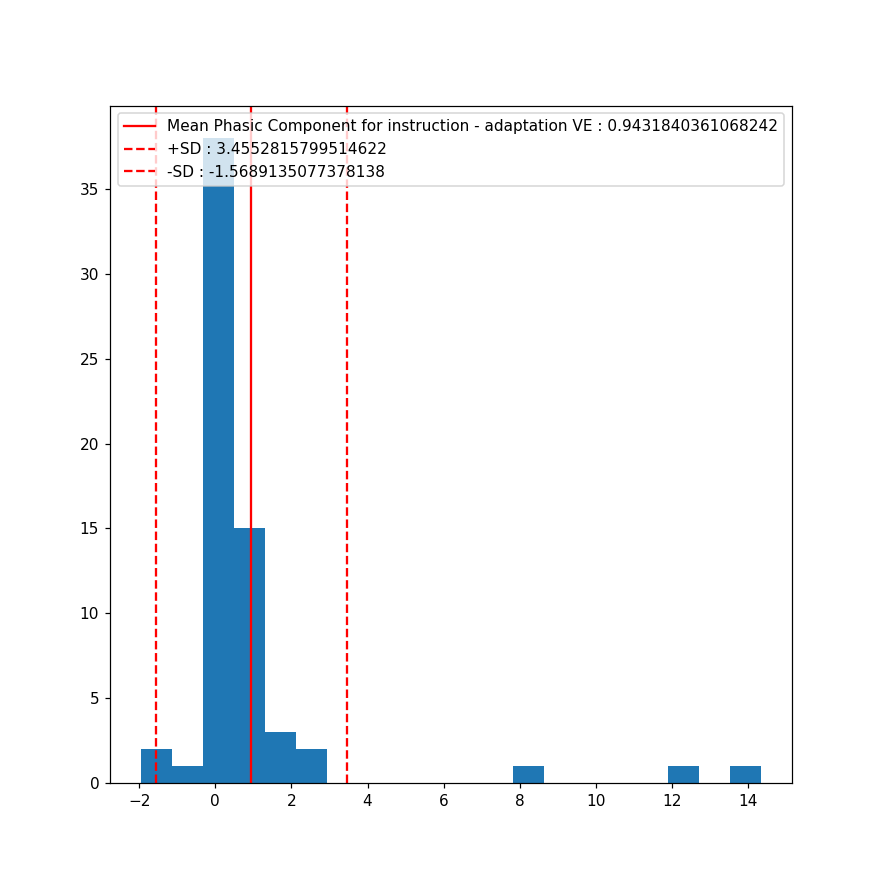

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=3.0036541802857823, pvalue=0.0038235529074255145)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=195.0, pvalue=1.5957142030065998e-08)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Phasic Component :
pearson r = -0.1688950939129351 (p = 0.18215878835806035)
regressive line first order :  y = -0.030307296285357988 * x + 2.0893823040438395


<IPython.core.display.Javascript object>


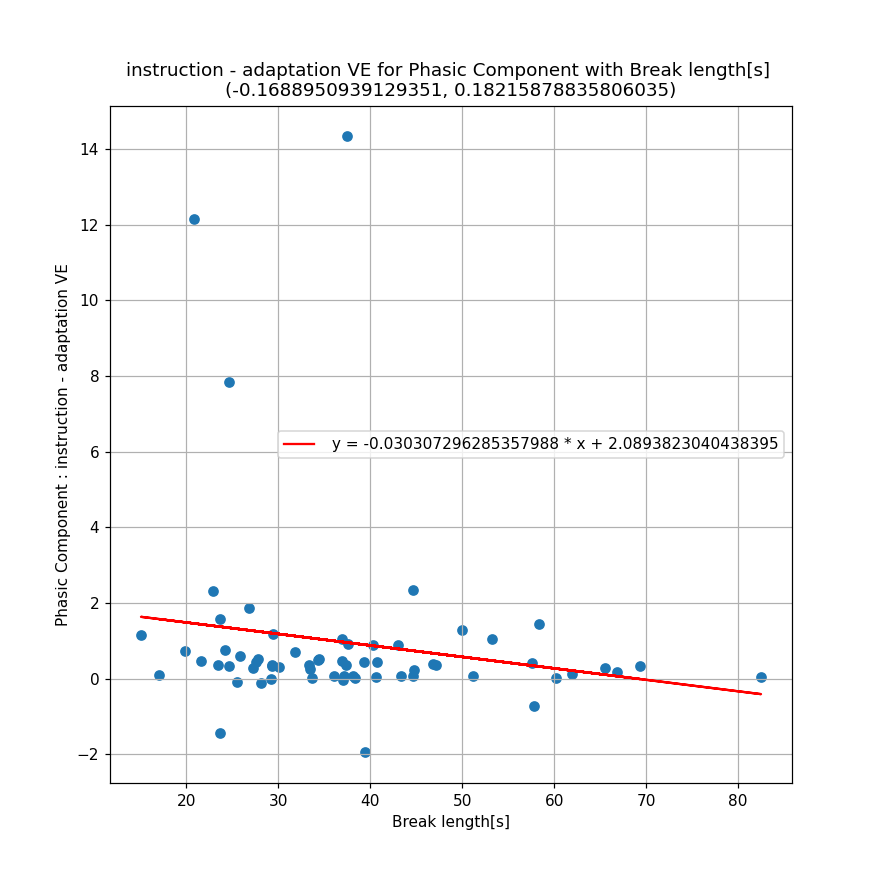

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Phasic Component :
pearson r = 0.06786012880827275 (p = 0.5941747356711409)
regressive line first order :  y = 0.016138999660160126 * x + 0.4796921396166003


<IPython.core.display.Javascript object>


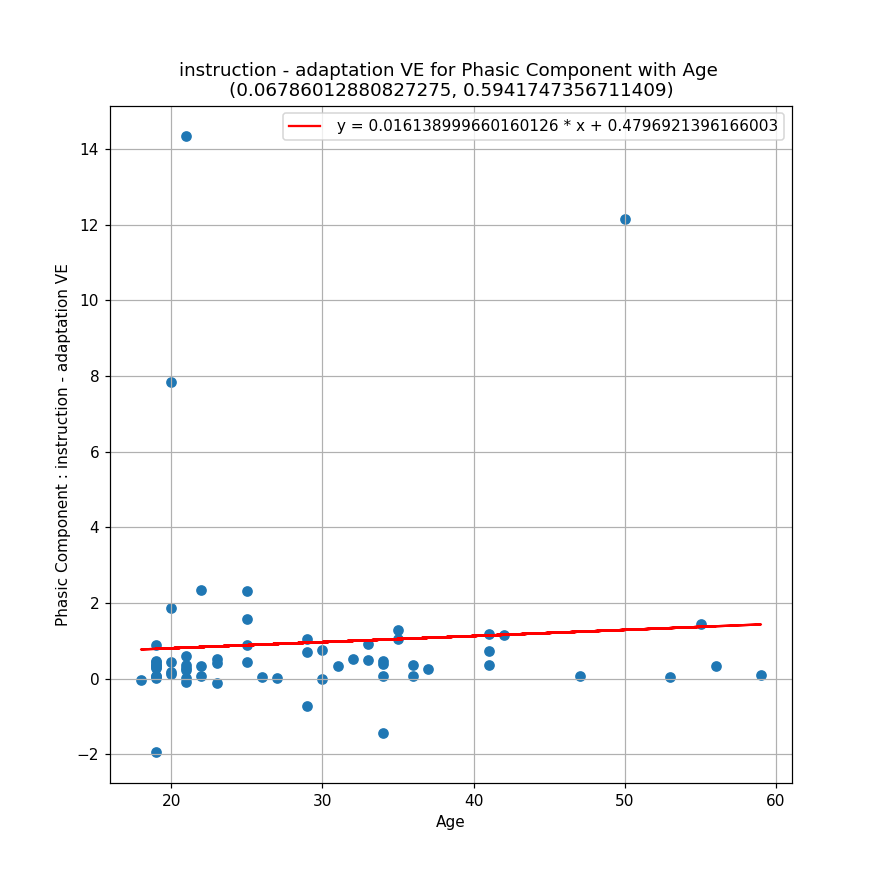

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Phasic Component :
pearson r = -0.1372131136655733 (p = 0.2796109323660665)
regressive line first order :  y = -0.014682976322928285 * x + 1.2377612485855725


<IPython.core.display.Javascript object>


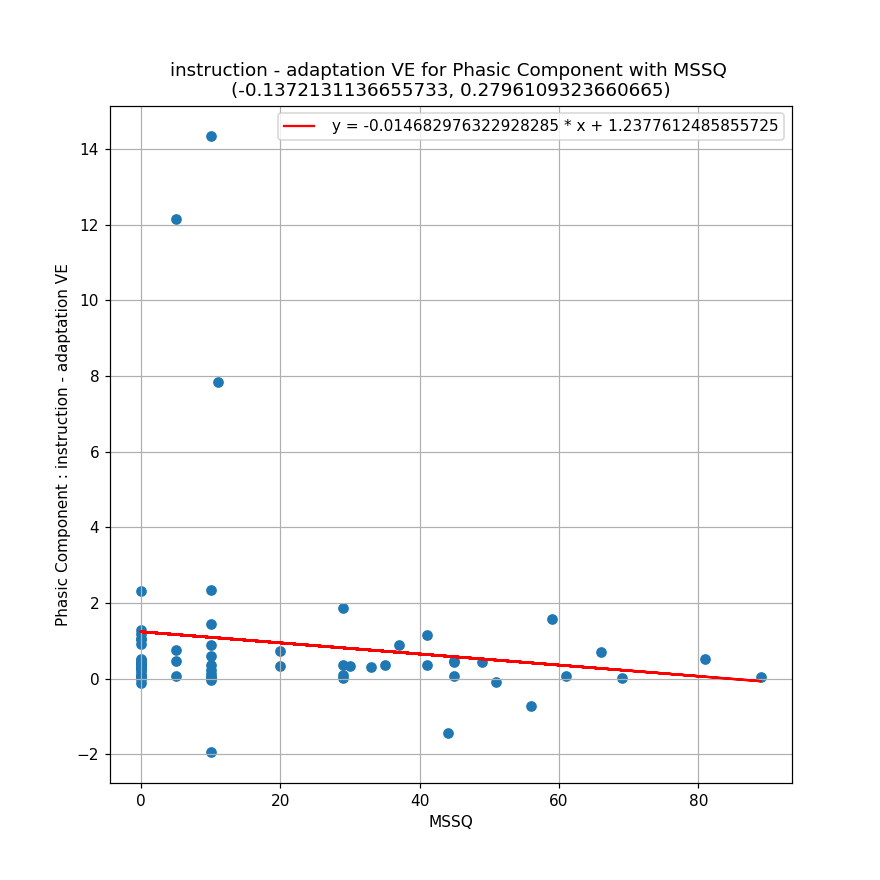




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for instruction - adaptation VE : -1.5949910101448315
standard deviation for differences in Tonic Component for instruction - adaptation VE : 2.471278552459728
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5671716928482056, pvalue=1.8942753182010774e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=5.732440153006553, pvalue=9.899596980085408e-09)
__________________________________________________
Skew : -4.015532215344958
__________________________________________________


<IPython.core.display.Javascript object>


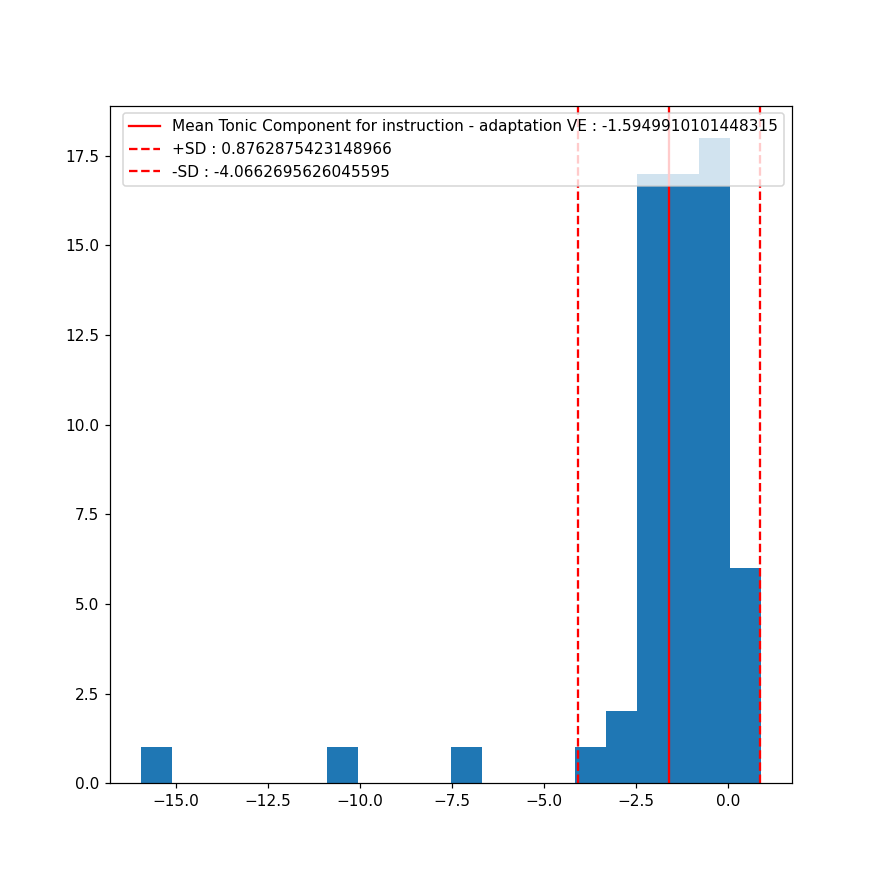

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-5.163290098745998, pvalue=2.640929922791321e-06)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=80.0, pvalue=1.362703043012955e-10)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Tonic Component :
pearson r = 0.02926604068051169 (p = 0.8184313746239368)
regressive line first order :  y = 0.005166296574272427 * x + -1.7903763104146153


<IPython.core.display.Javascript object>


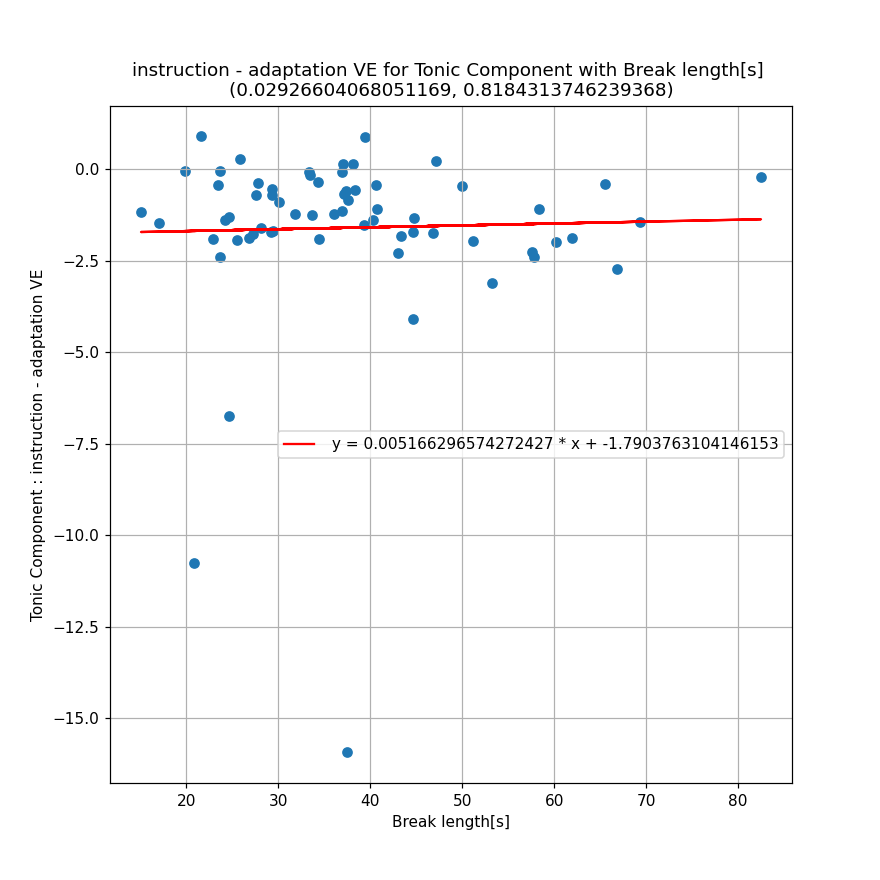

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Tonic Component :
pearson r = -0.0046911424706981425 (p = 0.9706527203250558)
regressive line first order :  y = -0.0010975536457651636 * x + -1.5634706413805124


<IPython.core.display.Javascript object>


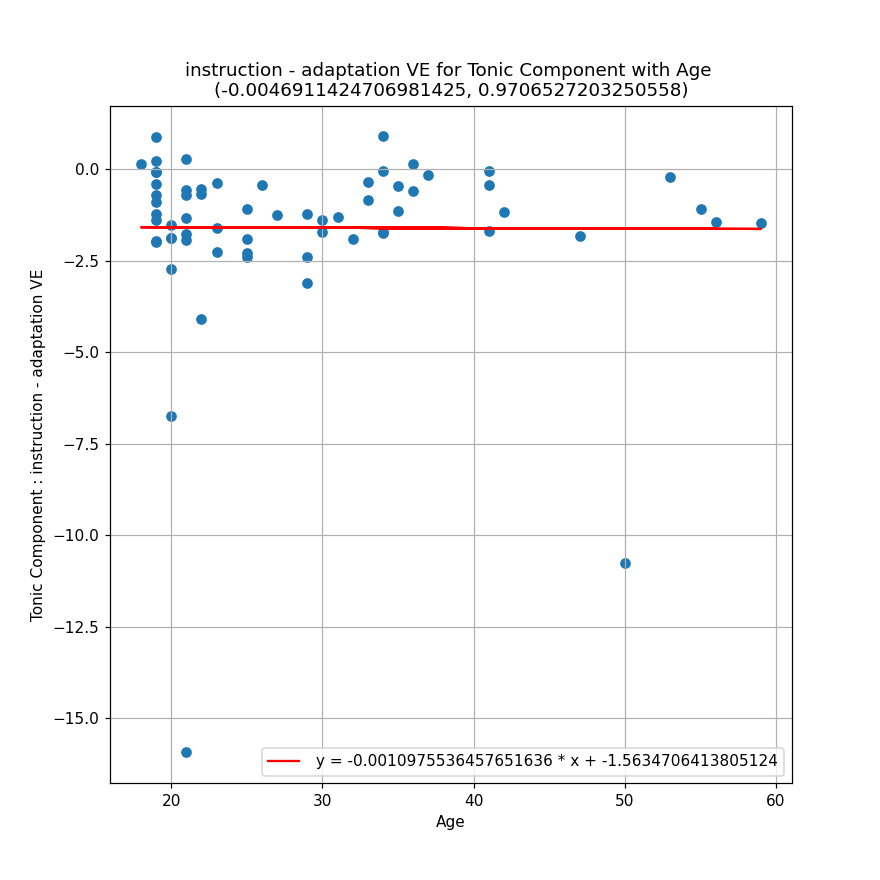

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Tonic Component :
pearson r = 0.09053853233642986 (p = 0.47677694022933664)
regressive line first order :  y = 0.009530970607868654 * x + -1.7862061079651956


<IPython.core.display.Javascript object>


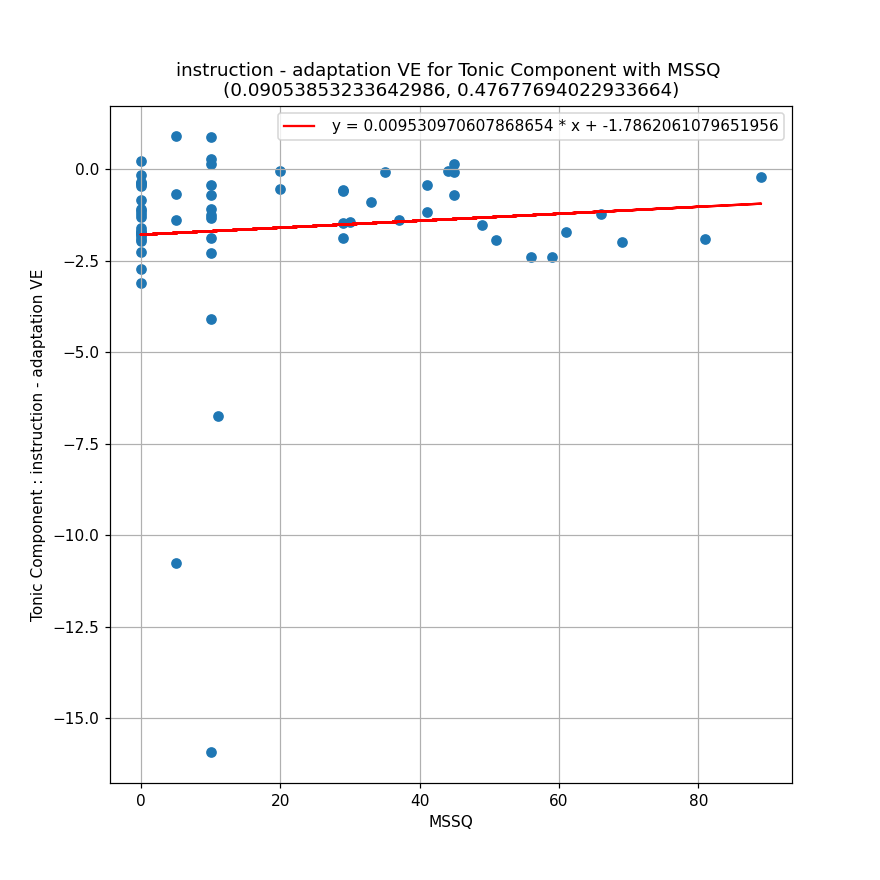




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for instruction - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for instruction - adaptation VE : 1.2366767262375506
standard deviation for differences in HR[1] for instruction - adaptation VE : 20.707164541250194
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.7100059390068054, pvalue=6.068925917368517e-10)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.7659693216883685, pvalue=1.8794785774867397e-06)
__________________________________________________
Skew : -1.267607737897151
__________________________________________________


<IPython.core.display.Javascript object>


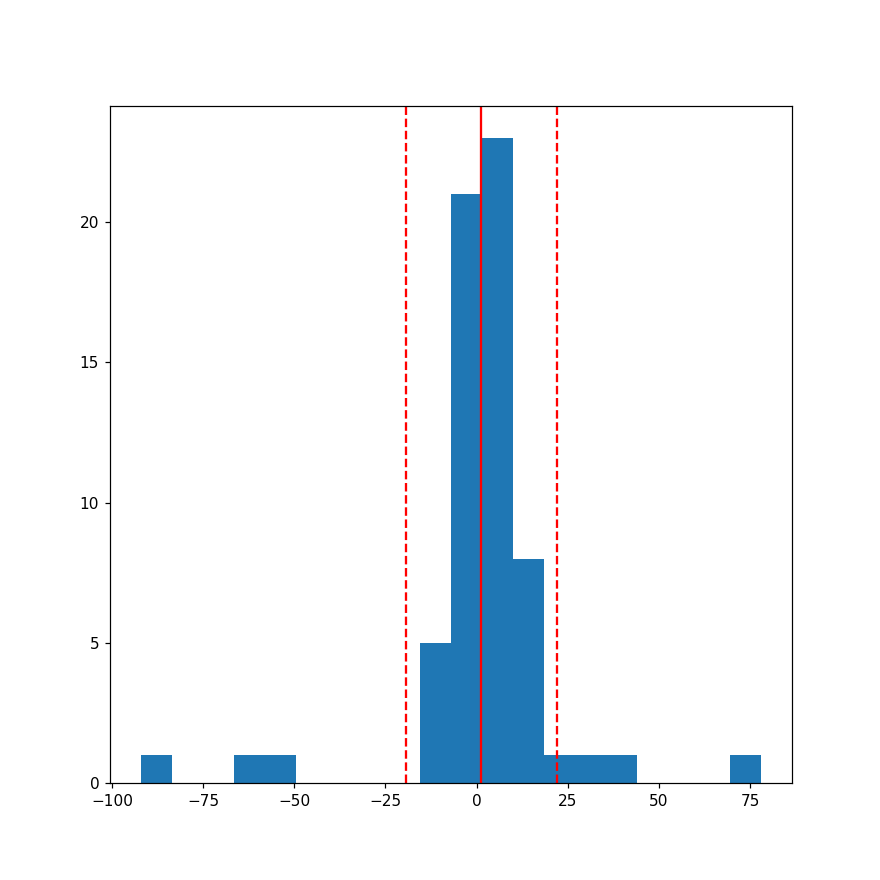

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for instruction - adaptation VE : 

Ttest results : Ttest_relResult(statistic=0.4777773311354142, pvalue=0.6344622958755326)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=692.0, pvalue=0.0199518762104551)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and instruction - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = 0.051802250444090786 (p = 0.6843581447055661)
regressive line first order :  y = 0.07662366538377605 * x + -1.661170436338277


<IPython.core.display.Javascript object>


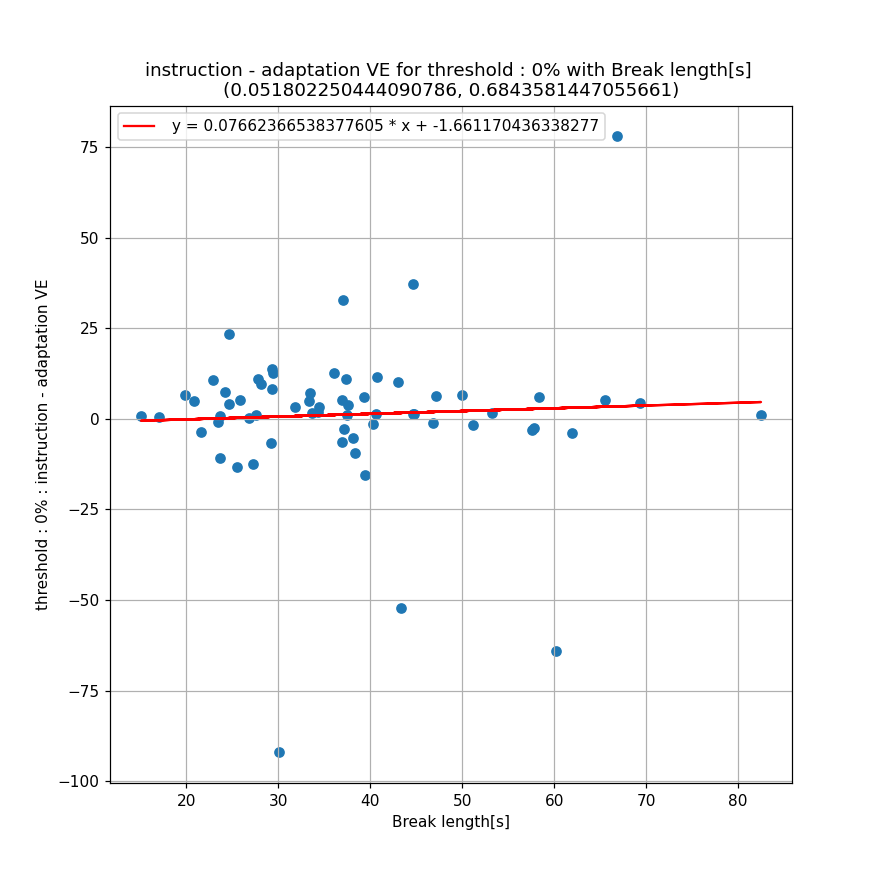

____________________________________________________________________________________________________
correlation for Age and instruction - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.024596006192000256 (p = 0.8470223652085702)
regressive line first order :  y = -0.048218163145826706 * x + 2.62144209908176


<IPython.core.display.Javascript object>


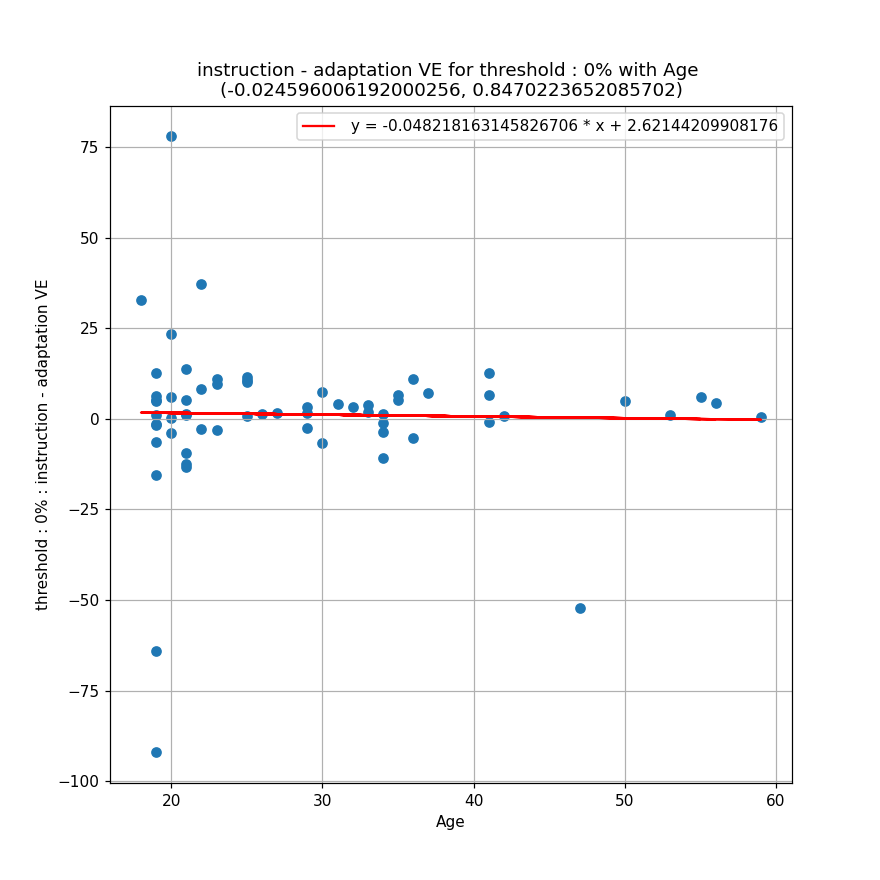

____________________________________________________________________________________________________
correlation for MSSQ and instruction - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.2613555778909223 (p = 0.03697467251767135)
regressive line first order :  y = -0.2305336825785169 * x + 5.861758732969044


<IPython.core.display.Javascript object>


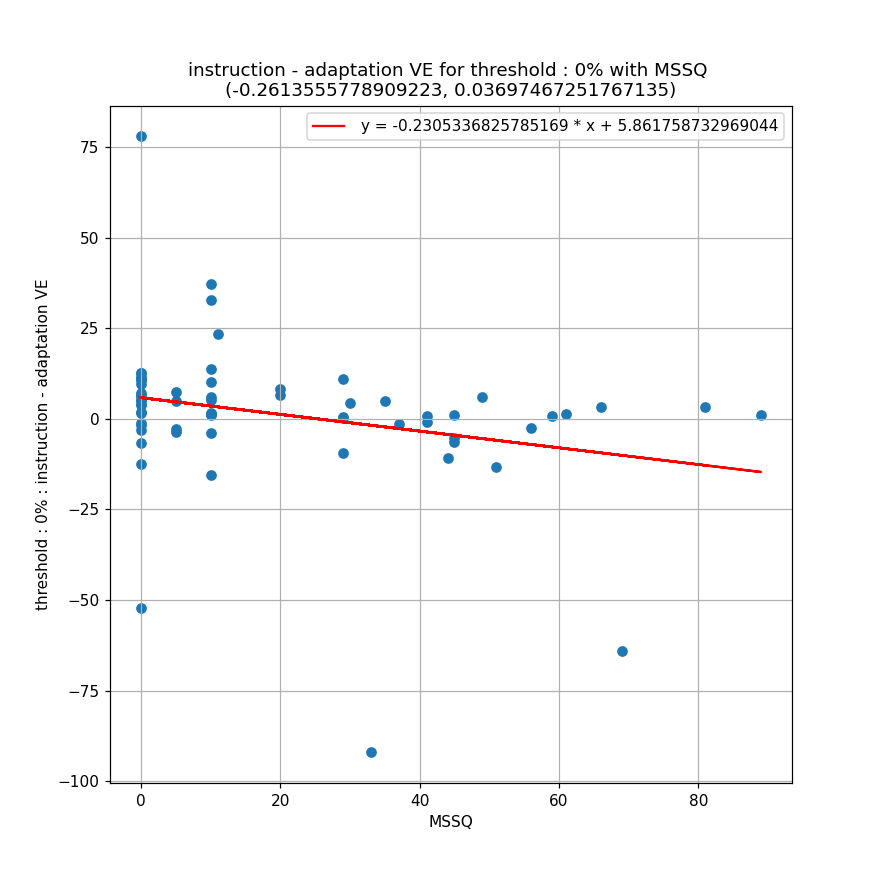




_ _ _ _ _ _ _ _ _ _ _ _ Test of Skin Conductance for : break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Skin Conductance for break - adaptation VE : 0.19282659557547036
standard deviation for differences in Skin Conductance for break - adaptation VE : 0.5173630051416044
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.78011155128479, pvalue=2.1304321862203324e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.438558985586015, pvalue=9.056316645032197e-06)
__________________________________________________
Skew : 2.3017707600203092
__________________________________________________


<IPython.core.display.Javascript object>


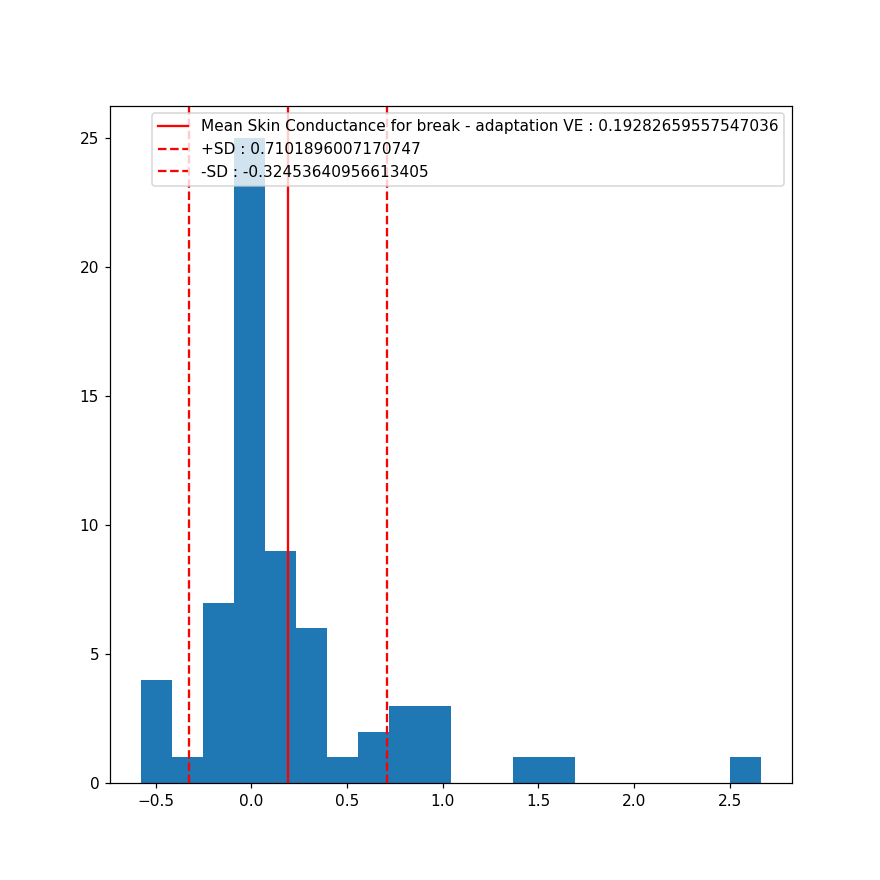

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Skin Conductance for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=2.981683555401383, pvalue=0.004071783573931597)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=697.0, pvalue=0.021801178429516347)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Skin Conductance :
pearson r = -0.2579594391670416 (p = 0.03959266122139927)
regressive line first order :  y = -0.009533238453708428 * x + 0.5533662260521808


<IPython.core.display.Javascript object>


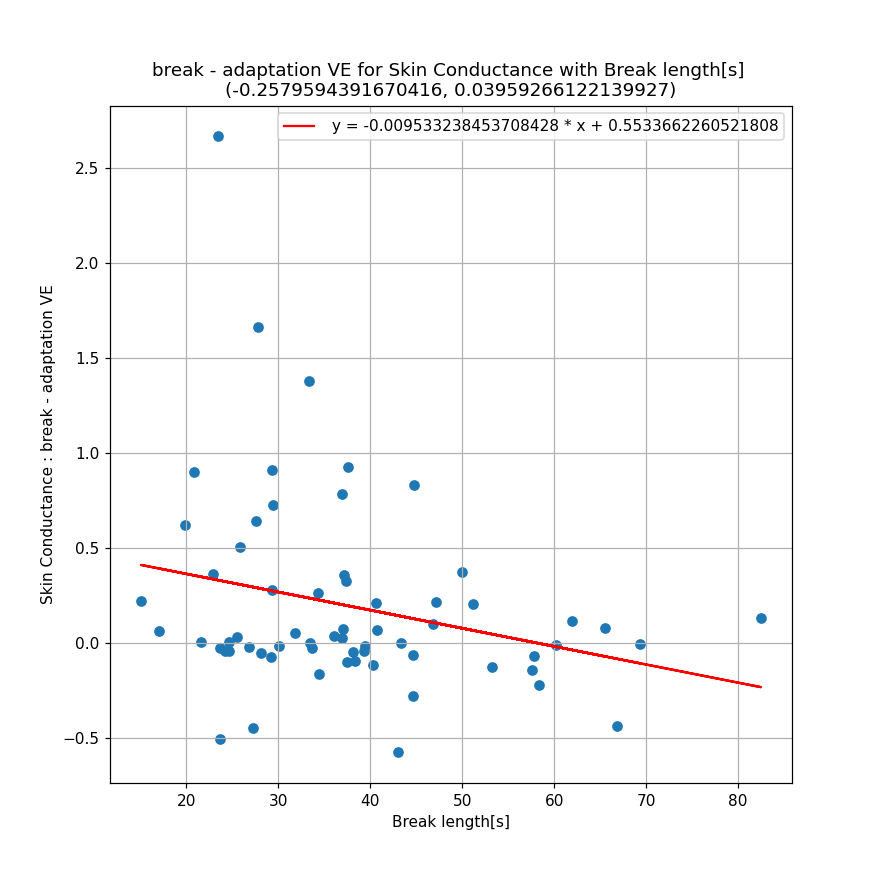

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Skin Conductance :
pearson r = 0.10253093874165958 (p = 0.4201223490676054)
regressive line first order :  y = 0.005021988780475475 * x + 0.04860135528619019


<IPython.core.display.Javascript object>


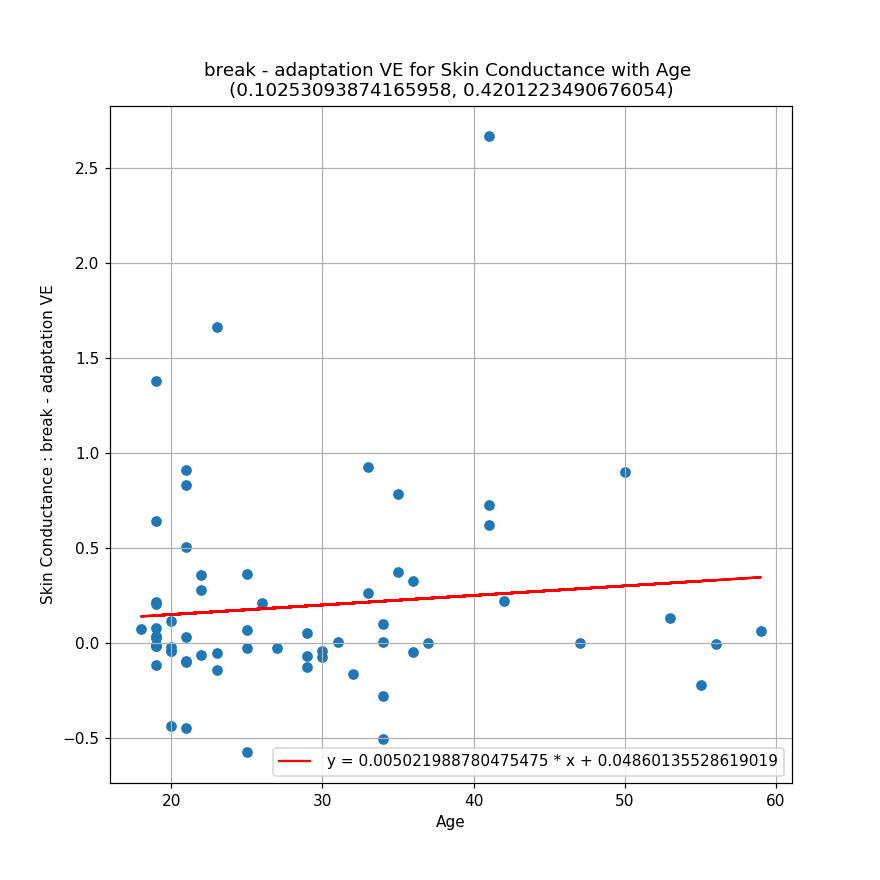

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Skin Conductance :
pearson r = -0.07198802331480617 (p = 0.5718780160644552)
regressive line first order :  y = -0.001586490950769704 * x + 0.22465557027528738


<IPython.core.display.Javascript object>


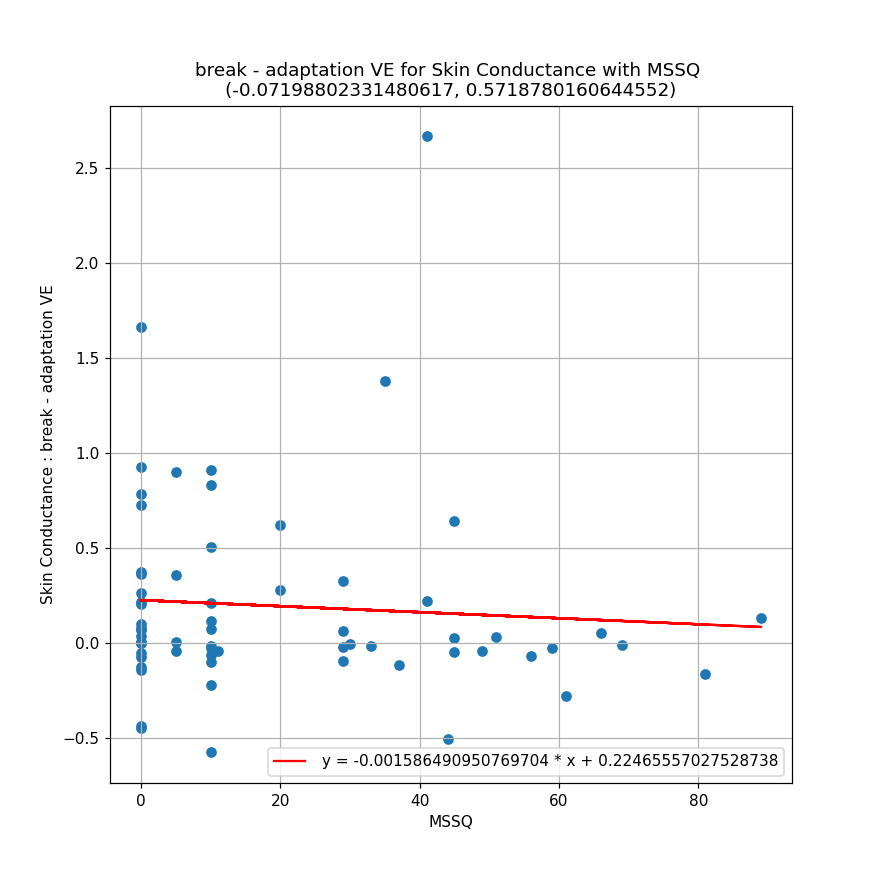




_ _ _ _ _ _ _ _ _ _ _ _ Test of Phasic Component for : break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Phasic Component for break - adaptation VE : 3.2563276580534573
standard deviation for differences in Phasic Component for break - adaptation VE : 6.023810304151215
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.523467481136322, pvalue=4.245969081970863e-13)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.3807231299776035, pvalue=1.1828609464351587e-05)
__________________________________________________
Skew : 2.841939894962698
__________________________________________________


<IPython.core.display.Javascript object>


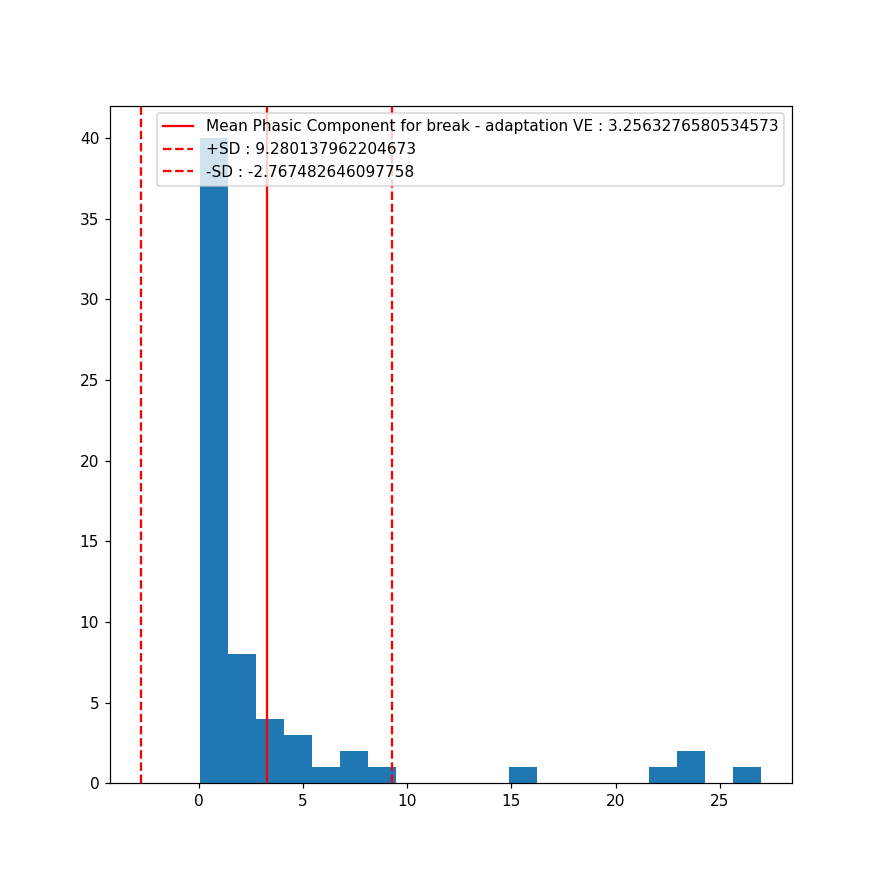

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Phasic Component for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=4.324608503437646, pvalue=5.550959324501533e-05)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=0.0, pvalue=3.5254980732707397e-12)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Phasic Component :
pearson r = -0.16431464614908511 (p = 0.19447707754375823)
regressive line first order :  y = -0.07070355069948006 * x + 5.930280708358807


<IPython.core.display.Javascript object>


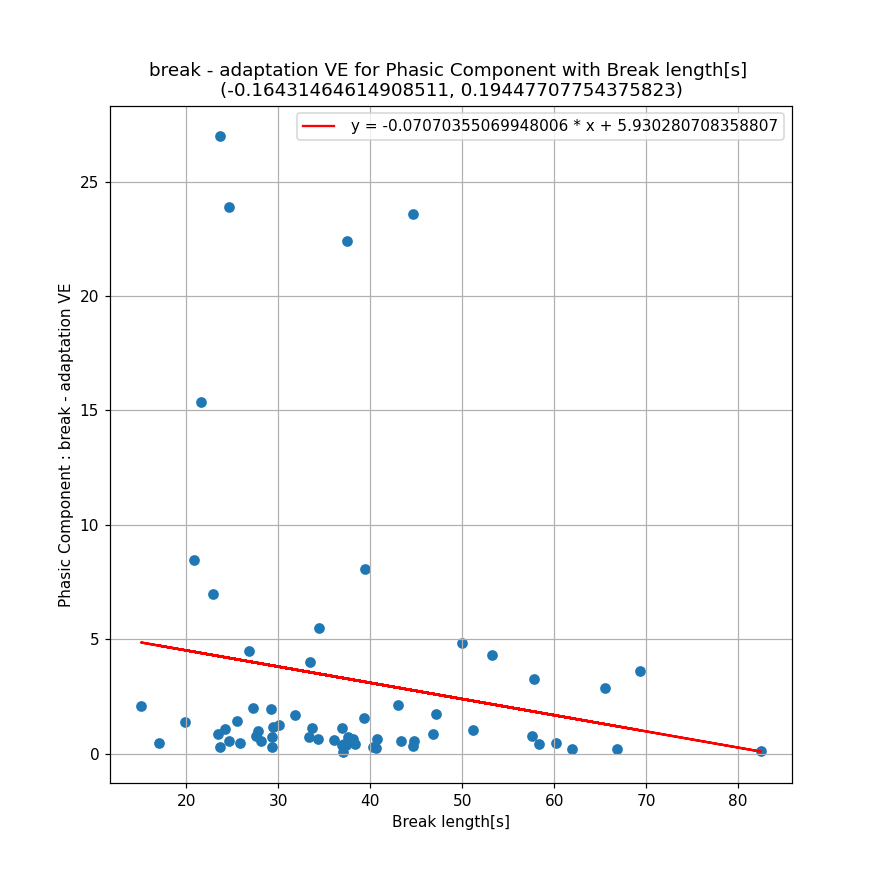

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Phasic Component :
pearson r = -0.03719301798574838 (p = 0.7704542646563473)
regressive line first order :  y = -0.021210853338169647 * x + 3.8654768523590146


<IPython.core.display.Javascript object>


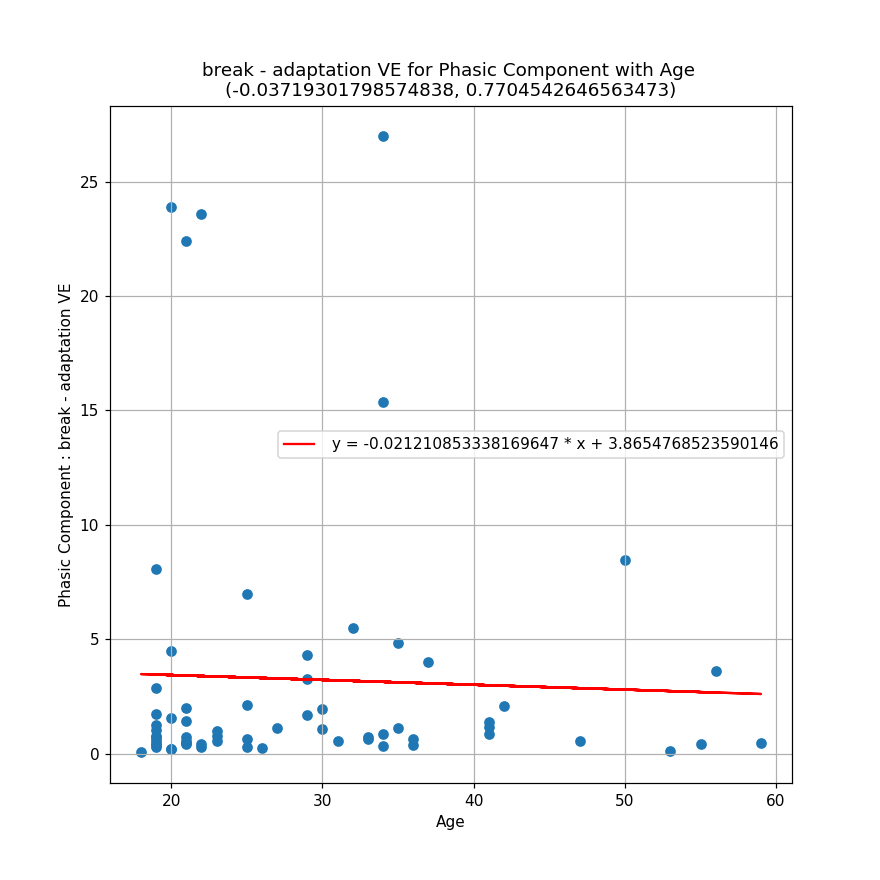

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Phasic Component :
pearson r = -0.049255123324741454 (p = 0.6991193669357942)
regressive line first order :  y = -0.012638766136174632 * x + 3.5098929036604596


<IPython.core.display.Javascript object>


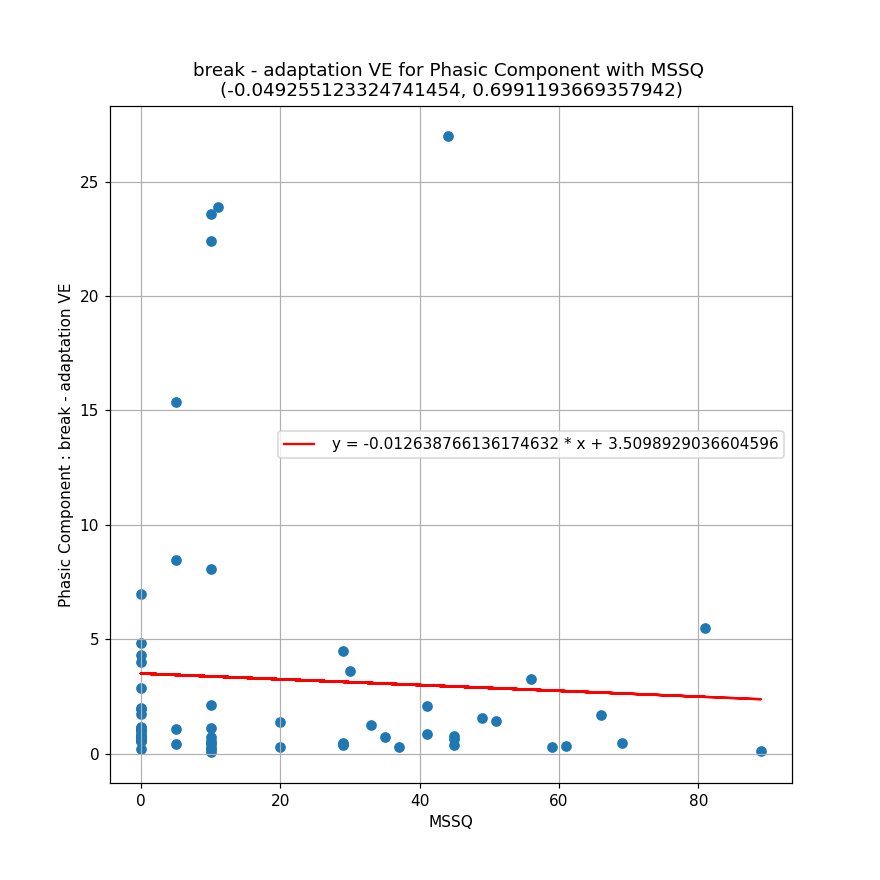




_ _ _ _ _ _ _ _ _ _ _ _ Test of Tonic Component for : break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in Tonic Component for break - adaptation VE : -3.077152231647603
standard deviation for differences in Tonic Component for break - adaptation VE : 6.387325479151132
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.5624464750289917, pvalue=1.603458685273118e-12)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.4542323580636545, pvalue=8.419388186623977e-06)
__________________________________________________
Skew : -2.8696175119841616
__________________________________________________


<IPython.core.display.Javascript object>


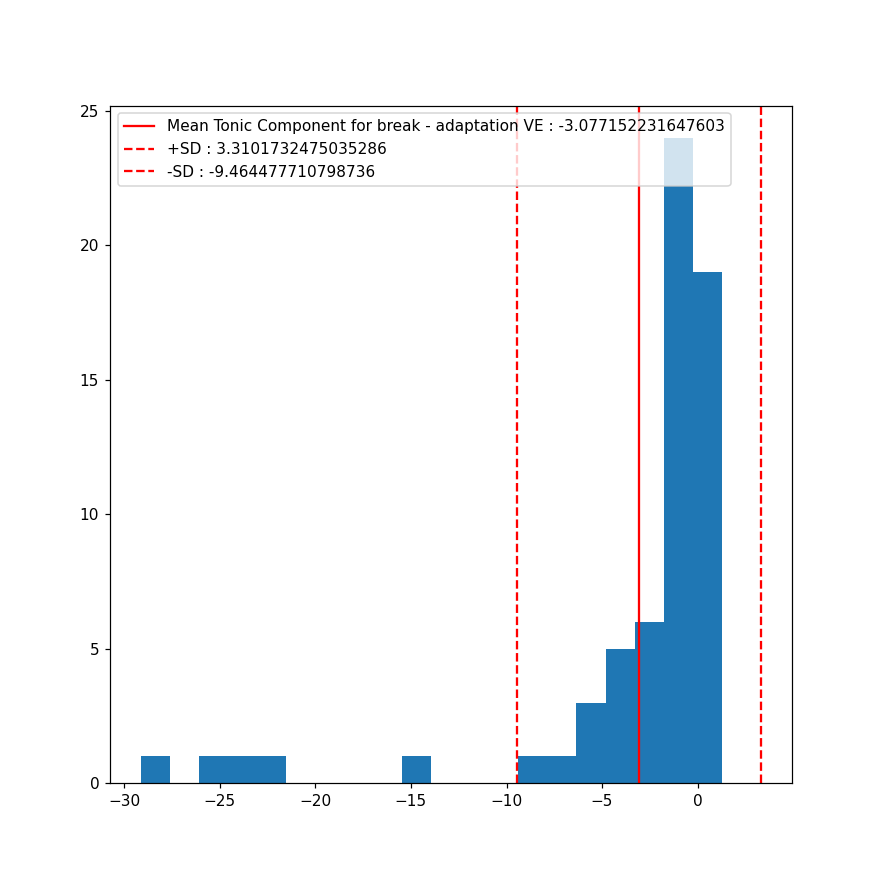

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of Tonic Component for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=-3.854072871898242, pvalue=0.00027499341373340584)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=253.0, pvalue=1.416725365381946e-07)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Tonic Component :
pearson r = 0.12539373797675427 (p = 0.323504242484653)
regressive line first order :  y = 0.05721218804474897 * x + -5.240872486478096


<IPython.core.display.Javascript object>


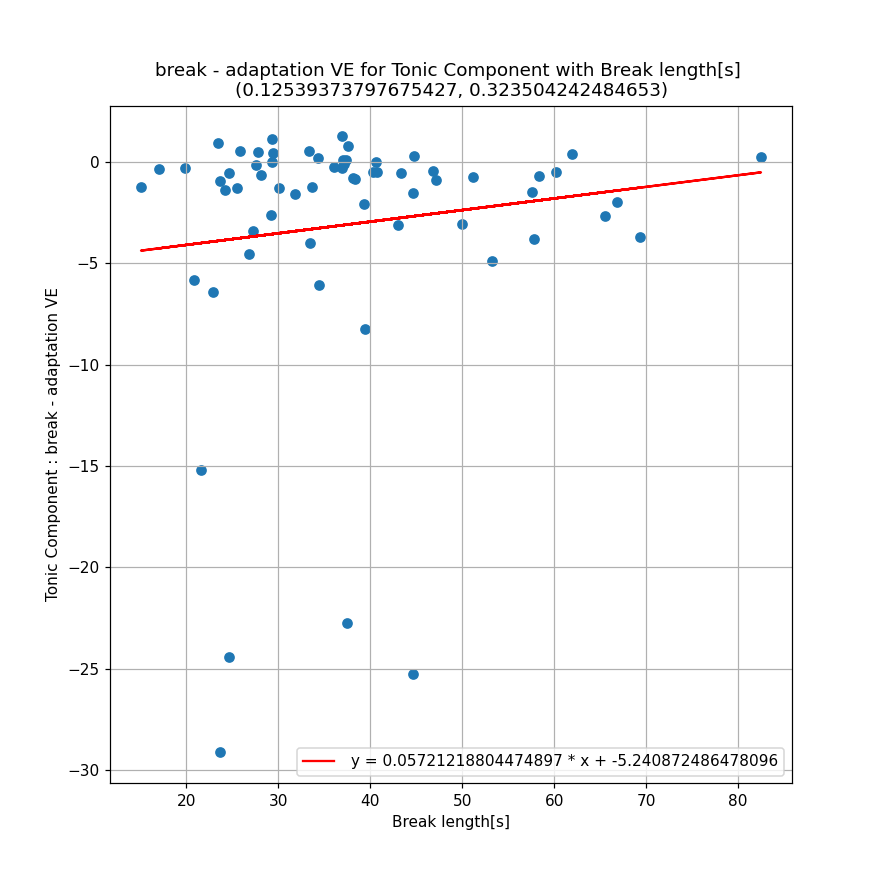

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Tonic Component :
pearson r = 0.06433278906243327 (p = 0.6135290442075828)
regressive line first order :  y = 0.038902441744518346 * x + -4.1943817304979865


<IPython.core.display.Javascript object>


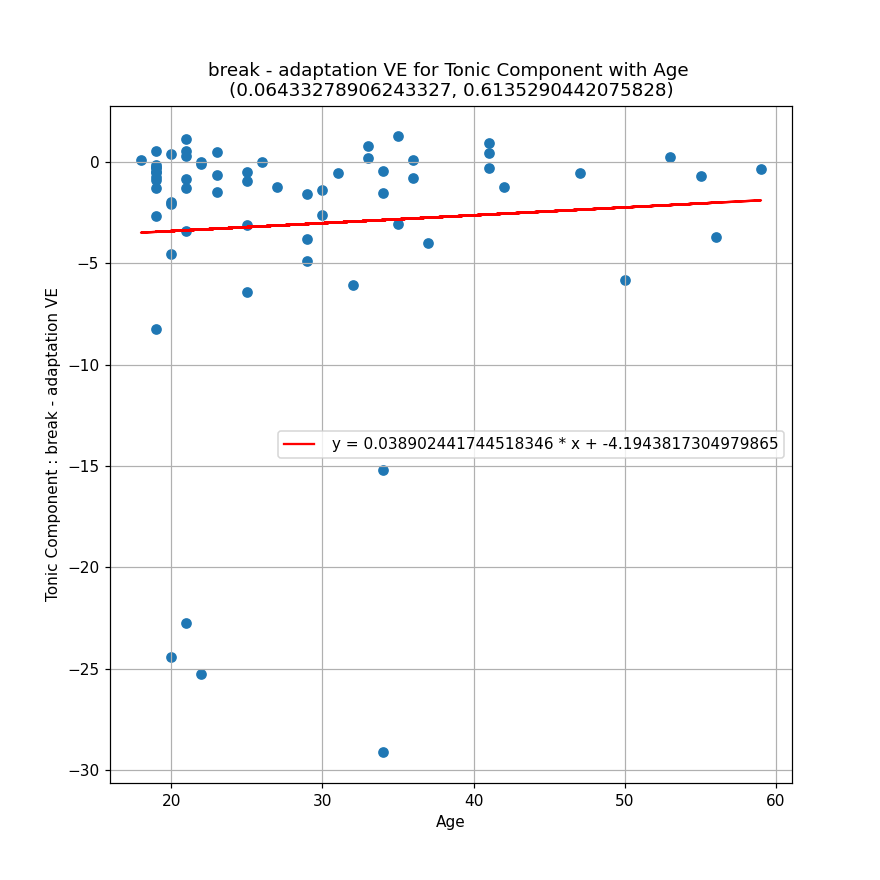

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Tonic Component :
pearson r = 0.017722845835507428 (p = 0.8894507696318197)
regressive line first order :  y = 0.004822080839980141 * x + -3.1738952284997013


<IPython.core.display.Javascript object>


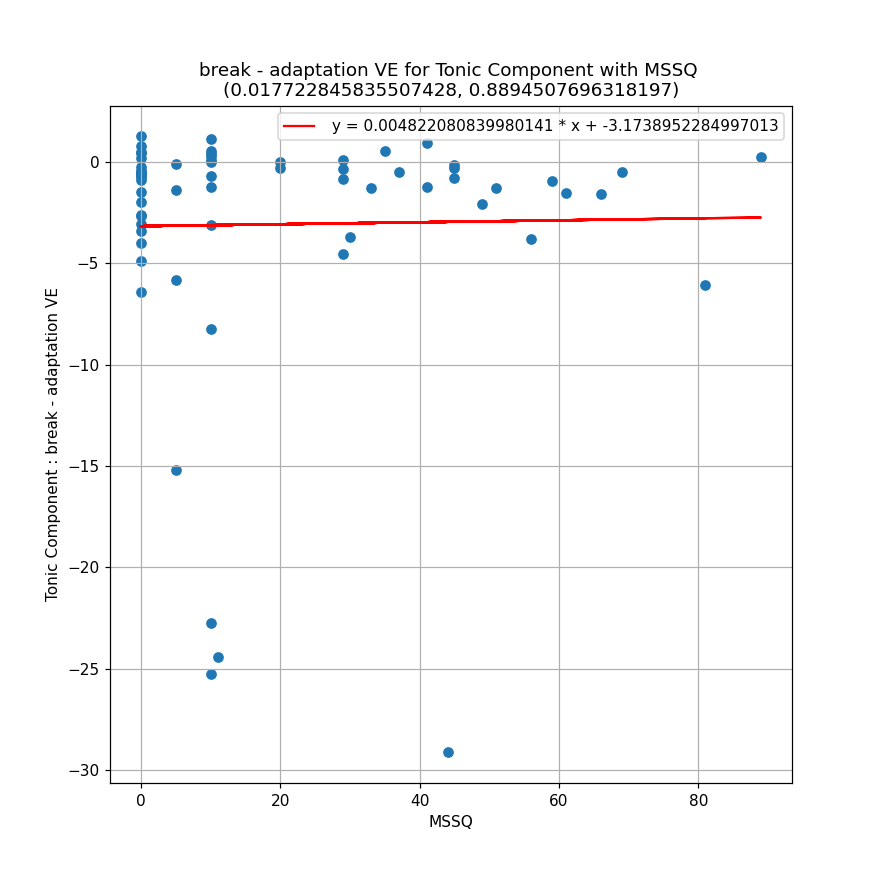




_ _ _ _ _ _ _ _ _ _ _ _ Test of Heart Rate(HR)[threshold : 0%] for break - adaptation VE _ _ _ _ _ _ _ _ _ _ _ _
____________________________________________________________________________________________________
________________________________________________________________________________

mean for differences in HR[threshold : 0%] for break - adaptation VE : 16.20545076473929
standard deviation for differences in HR[1] for break - adaptation VE : 17.421302262794914
________________________________________________________________________________
Shapiro-Wilk :
ShapiroResult(statistic=0.7679628729820251, pvalue=1.0965713670429977e-08)
__________________________________________________
kurtosistest :
KurtosistestResult(statistic=4.866630057417685, pvalue=1.1351723086025046e-06)
__________________________________________________
Skew : -1.3577566312203637
__________________________________________________


<IPython.core.display.Javascript object>


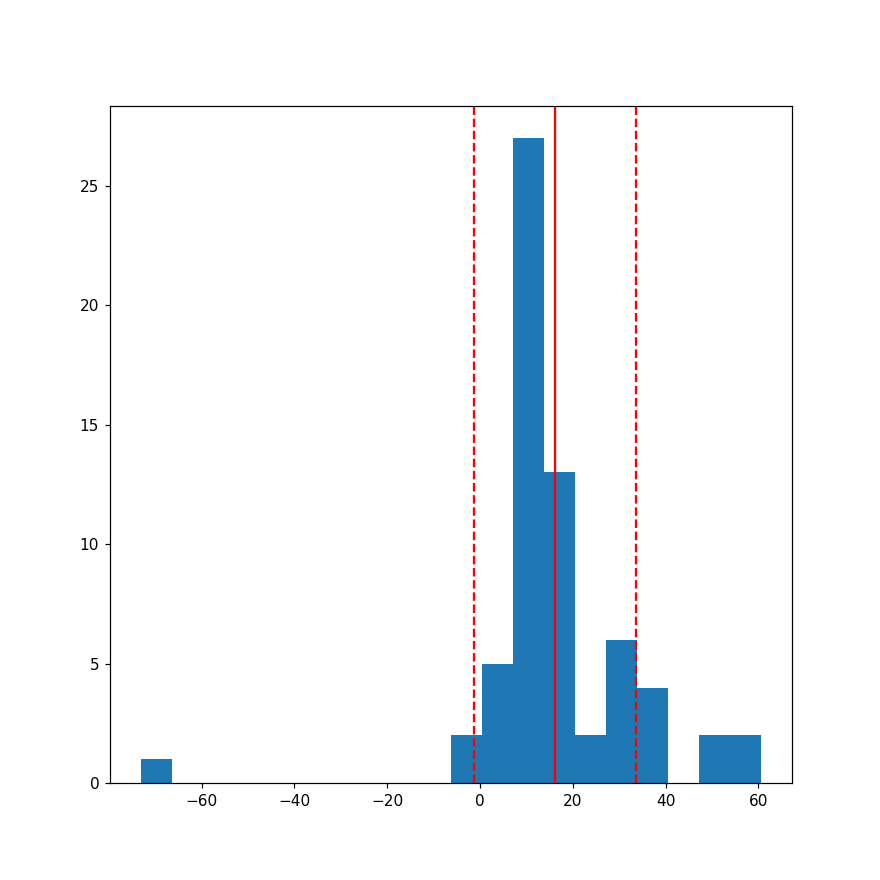

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
>>> test results of threshold : 0% for break - adaptation VE : 

Ttest results : Ttest_relResult(statistic=7.4416713608593055, pvalue=3.383334483006864e-10)
....................................................................................................
Wilcoxon signed-rank test results : WilcoxonResult(statistic=67.0, pvalue=7.669596820068871e-11)

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
____________________________________________________________________________________________________
correlation for Break length[s] and break - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.034373203578604385 (p = 0.7874329517735762)
regressive line first order :  y = -0.0427754205070244 * x + 17.823183750017673


<IPython.core.display.Javascript object>


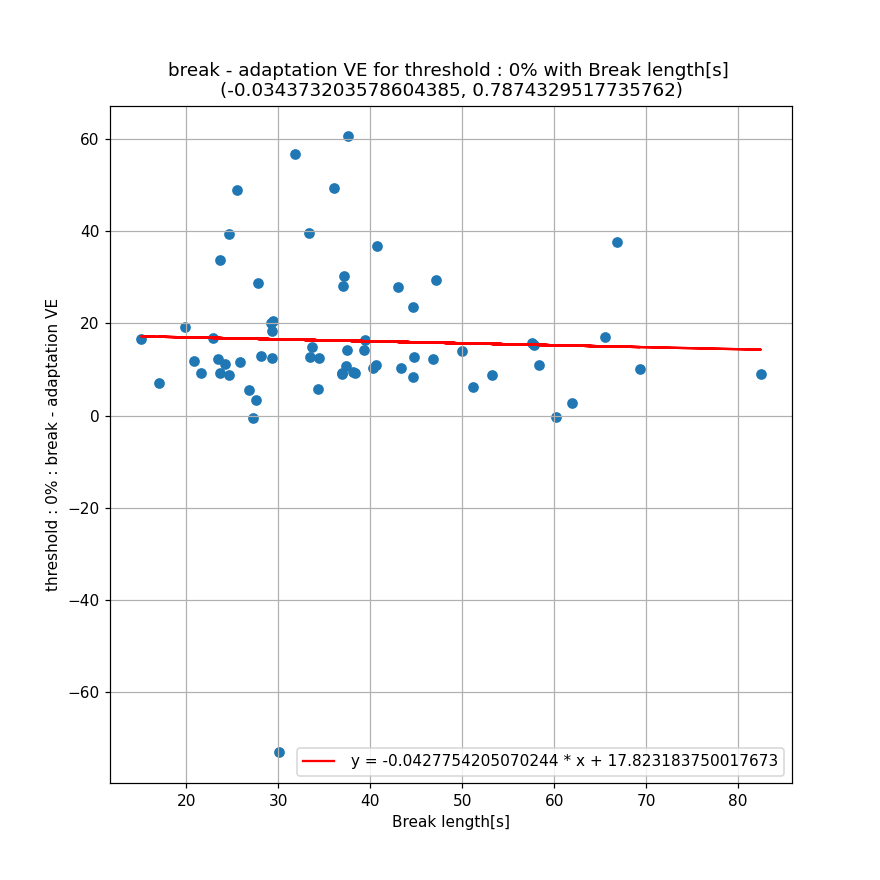

____________________________________________________________________________________________________
correlation for Age and break - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.05490367339022965 (p = 0.6665426828162897)
regressive line first order :  y = -0.09055396105181729 * x + 18.806047333696153


<IPython.core.display.Javascript object>


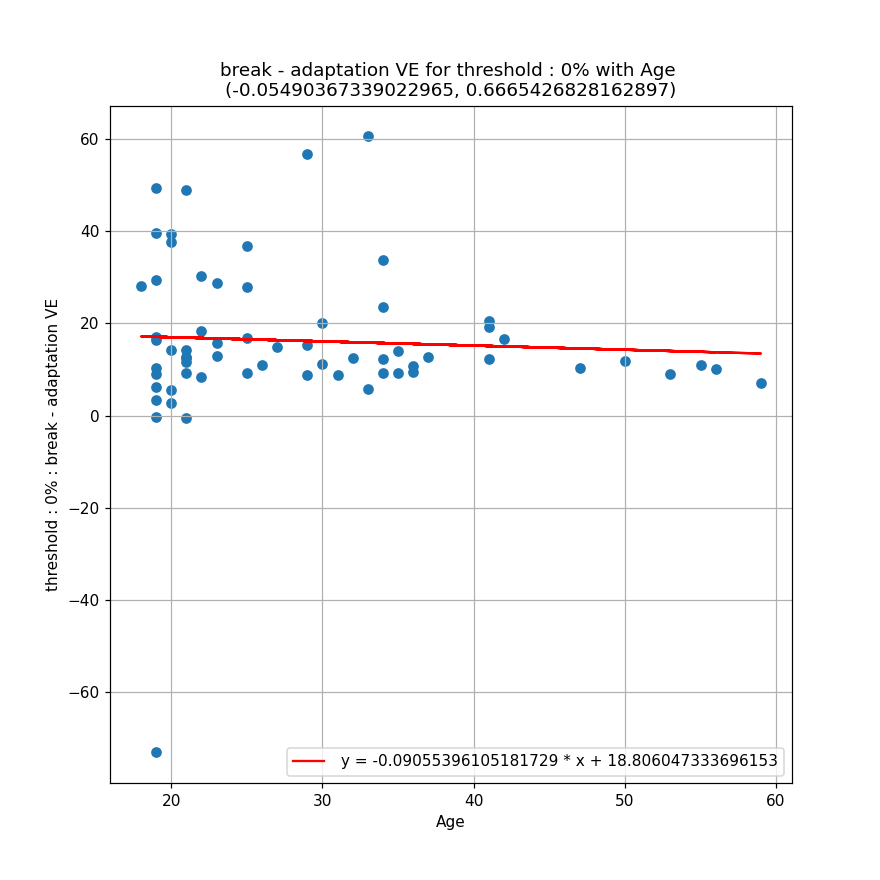

____________________________________________________________________________________________________
correlation for MSSQ and break - adaptation VE in Heart Rate(HR)[threshold : 0%] :
pearson r = -0.06930357681760722 (p = 0.5863339608386696)
regressive line first order :  y = -0.05143020382011904 * x + 17.237269228880418


<IPython.core.display.Javascript object>


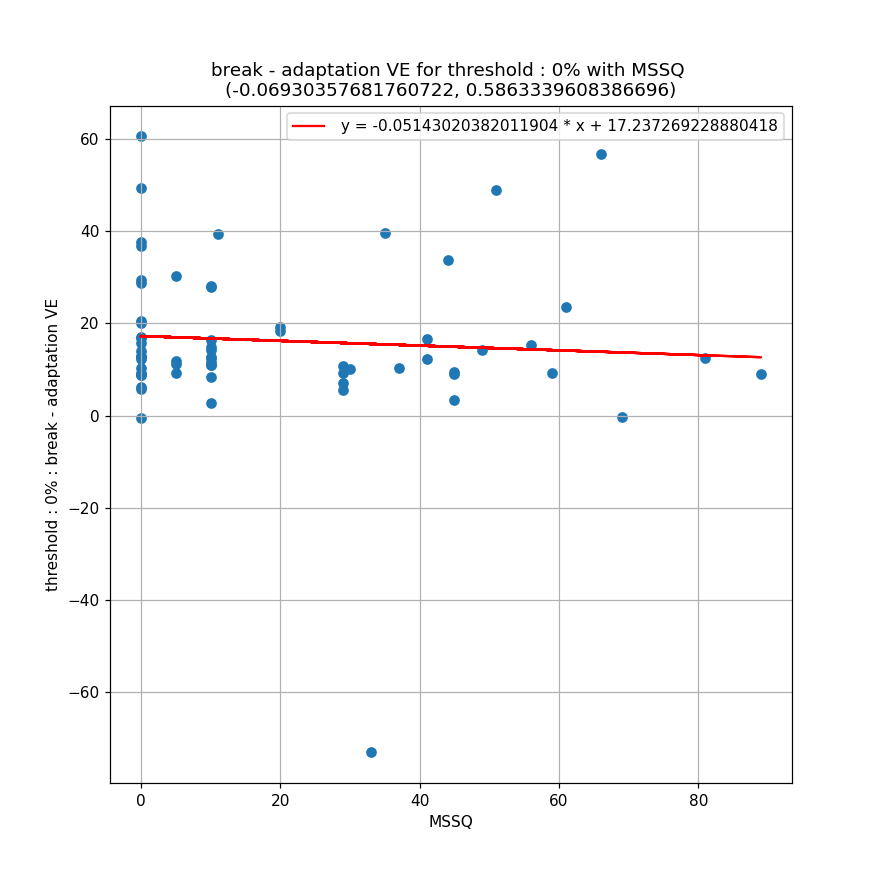


statisticalTestsOnData in 2.5387510999998995s


n       $\Delta$           STD  \
Physical Env. - Instr.  HR [BPM]  64  -3.6732210500  8.9921734857   
                        SC [µS]   64  -0.0415867649  0.2784599215   
Physical Env. - Break   HR [BPM]  64 -18.6419950885 21.0798064110   
                        SC [µS]   64  -0.4457325098  0.6035405047   
Ph. Env. - VR Rep. Env. HR [BPM]  64  -2.4365443237 23.1855623727   
                        SC [µS]   64  -0.2529059142  0.3901772662   
Instruction - Break     HR [BPM]  64 -14.9687740385 18.1268029915   
                        SC [µS]   64  -0.4041457449  0.5402771258   
Instr. - VR Rep. Env.   HR [BPM]  64   1.2366767262 20.7071645413   
                        SC [µS]   64  -0.2113191493  0.3672710852   
Break - VR Replica Env. HR [BPM]  64  16.2054507647 17.4213022628   
                        SC [µS]   64   0.1928265956  0.5173630051   

                                       T value      p-value  
Physical Env. - Instr.  HR [BPM] -3.2679272087 0.0017564743  
                        SC [µS]  -1.1947648251 0.2366575380  
Physical Env. - Break   HR [BPM] -7.0748259163 0.0000000015  
                        SC [µS]  -5.9082365658 0.0000001520  
Ph. Env. - VR Rep. Env. HR [BPM] -0.8407108819 0.4036894951  
                        SC [µS]  -5.1854566867 0.0000024300  
Instruction - Break     HR [BPM] -6.6062500025 0.0000000097  
                        SC [µS]  -5.9842732644 0.0000001129  
Instr. - VR Rep. Env.   HR [BPM]  0.4777773311 0.6344622959  
                        SC [µS]  -4.6030119508 0.0000207006  
Break - VR Replica Env. HR [BPM]  7.4416713609 0.0000000003  
                        SC [µS]   2.9816835554 0.0040717836

\begin{table}
\centering
\caption[T-test]{Matched pairs t-test results}
\label{t-test}
\begin{tabular}{lllllll}
\toprule
                        &         &   n &       $\Delta$ &           STD &       T value &      p-value \\
\midrule
\multirow{2}{*}{Physical Env. - Instr.} & HR [BPM] &  64 &  -3.6732210500 &  8.9921734857 & -3.2679272087 & 0.0017564743 \\
                        & SC [µS] &  64 &  -0.0415867649 &  0.2784599215 & -1.1947648251 & 0.2366575380 \\
\cline{1-7}
\multirow{2}{*}{Physical Env. - Break} & HR [BPM] &  64 & -18.6419950885 & 21.0798064110 & -7.0748259163 & 0.0000000015 \\
                        & SC [µS] &  64 &  -0.4457325098 &  0.6035405047 & -5.9082365658 & 0.0000001520 \\
\cline{1-7}
\multirow{2}{*}{Ph. Env. - VR Rep. Env.} & HR [BPM] &  64 &  -2.4365443237 & 23.1855623727 & -0.8407108819 & 0.4036894951 \\
                        & SC [µS] &  64 &  -0.2529059142 &  0.3901772662 & -5.1854566867 & 0.0000024300 \\
\cline{1-7}
\multirow{2}{*}{Instruction - Brea

N mean difference  \
adaptation PE - instruction   threshold : 0%    64   -3.6732210500   
adaptation PE - break         threshold : 0%    64  -18.6419950885   
adaptation PE - adaptation VE threshold : 0%    64   -2.4365443237   
instruction - break           threshold : 0%    64  -14.9687740385   
instruction - adaptation VE   threshold : 0%    64    1.2366767262   
break - adaptation VE         threshold : 0%    64   16.2054507647   
adaptation PE - instruction   Skin Conductance  64   -0.0415867649   
                              Phasic Component  64   -1.0591250392   
                              Tonic Component   64    1.0477406867   
adaptation PE - break         Skin Conductance  64   -0.4457325098   
                              Phasic Component  64   -3.3722686611   
                              Tonic Component   64    2.5299019082   
adaptation PE - adaptation VE Skin Conductance  64   -0.2529059142   
                              Phasic Component  64   -0.1159410031   
                              Tonic Component   64   -0.5472503234   
instruction - break           Skin Conductance  64   -0.4041457449   
                              Phasic Component  64   -2.3131436219   
                              Tonic Component   64    1.4821612215   
instruction - adaptation VE   Skin Conductance  64   -0.2113191493   
                              Phasic Component  64    0.9431840361   
                              Tonic Component   64   -1.5949910101   
break - adaptation VE         Skin Conductance  64    0.1928265956   
                              Phasic Component  64    3.2563276581   
                              Tonic Component   64   -3.0771522316   

                                               standard deviation  \
adaptation PE - instruction   threshold : 0%         8.9921734857   
adaptation PE - break         threshold : 0%        21.0798064110   
adaptation PE - adaptation VE threshold : 0%        23.1855623727   
instruction - break           threshold : 0%        18.1268029915   
instruction - adaptation VE   threshold : 0%        20.7071645413   
break - adaptation VE         threshold : 0%        17.4213022628   
adaptation PE - instruction   Skin Conductance       0.2784599215   
                              Phasic Component       2.5877646508   
                              Tonic Component        2.6236180978   
adaptation PE - break         Skin Conductance       0.6035405047   
                              Phasic Component       6.2141928000   
                              Tonic Component        6.6282655827   
adaptation PE - adaptation VE Skin Conductance       0.3901772662   
                              Phasic Component       0.6307633203   
                              Tonic Component        1.2110787596   
instruction - break           Skin Conductance       0.5402771258   
                              Phasic Component       5.2299101215   
                              Tonic Component        5.6460842712   
instruction - adaptation VE   Skin Conductance       0.3672710852   
                              Phasic Component       2.5120975438   
                              Tonic Component        2.4712785525   
break - adaptation VE         Skin Conductance       0.5173630051   
                              Phasic Component       6.0238103042   
                              Tonic Component        6.3873254792   

                                               Shapiro-Wilk statistic  \
adaptation PE - instruction   threshold : 0%             0.7921718359   
adaptation PE - break         threshold : 0%             0.8059670925   
adaptation PE - adaptation VE threshold : 0%             0.5553779602   
instruction - break           threshold : 0%             0.8593689799   
instruction - adaptation VE   threshold : 0%             0.7100059390   
break - adaptation VE         threshold : 0%             0.7679628730   
adaptation PE - instruction   Skin Conductance           0.93


main in 90.24398340000016s


In [33]:
if __name__ == "__main__":
    main(experimentDataList, testMode = False, devMode = devMode)

## TOST testing

In [34]:
def testingTOST(effectSize = 0.1, repetitions = 1000, mu = 100, sigma = 10, n = 64, alpha = 0.05):
    """
    Testing TOST function from statsmodels
    Function run the TOST generating two normally distributed samples:
    size 'n', with mean of 'mu' and standard deviation of 'sigma'.
    Next repeating this test 'repetitions' number of time on bounds +/- 'sigma' multiplied by 'effectSize',
    and saving results.
    When finished function calculates percentage of p < alpha in collected results,
    and displays results.
    """
    upper = sigma * effectSize
    lower = -1 * upper
    
    results = []
    for i in range(repetitions):

        x1 = np.random.default_rng().normal(mu, sigma, n)
        x2 = np.random.default_rng().normal(mu, sigma, n) 

        #sns.displot([x1, x2], kde=True)
        
        # smws stands for: statsmodels.stats.weightstats
        tostResult = smws.ttost_paired(x1, x2, low = lower, upp = upper)
        results.append(tostResult[0])
    
    below05 = sum(1 for res in results if res < alpha)
        
    print(f"For effect size (Cohen's d) {effectSize} in {repetitions} repetitions when sample size = {n}")
    print(f'p below 0.05 = {(below05/len(results)) * 100}%')
    print(f'mean result = {np.mean(results)}')
    print('_'*80)

In [35]:
testingTOST(effectSize = .076, repetitions = 10000, n = 1000)

For effect size (Cohen's d) 0.076 in 10000 repetitions when sample size = 1000
p below 0.05 = 4.01%
mean result = 0.21671620992202034
________________________________________________________________________________


In [36]:
effectSizes = [round(x, 2) for x in np.linspace(0.1, 1, 90)]
print(effectSizes)

[0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4, 0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5, 0.51, 0.52, 0.53, 0.54, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.0]


In [37]:
print('for Skin Conductance')
for eS in effectSizes:
    testingTOST(effectSize = eS, mu = 0, sigma = 0.3901772661813839, repetitions = 10000, n = 64)

for Skin Conductance
For effect size (Cohen's d) 0.1 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5720837146748029
________________________________________________________________________________
For effect size (Cohen's d) 0.11 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5502208270028799
________________________________________________________________________________
For effect size (Cohen's d) 0.12 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5308380782954859
________________________________________________________________________________
For effect size (Cohen's d) 0.13 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5113359596763716
________________________________________________________________________________
For effect size (Cohen's d) 0.14 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.49359955026326013
__________

For effect size (Cohen's d) 0.49 in 10000 repetitions when sample size = 64
p below 0.05 = 72.5%
mean result = 0.05102859605070379
________________________________________________________________________________
For effect size (Cohen's d) 0.5 in 10000 repetitions when sample size = 64
p below 0.05 = 74.22%
mean result = 0.04812569974988361
________________________________________________________________________________
For effect size (Cohen's d) 0.51 in 10000 repetitions when sample size = 64
p below 0.05 = 77.72%
mean result = 0.04278512027334638
________________________________________________________________________________
For effect size (Cohen's d) 0.52 in 10000 repetitions when sample size = 64
p below 0.05 = 79.66%
mean result = 0.0381502993365092
________________________________________________________________________________
For effect size (Cohen's d) 0.53 in 10000 repetitions when sample size = 64
p below 0.05 = 81.39999999999999%
mean result = 0.03535412738335801
_______

For effect size (Cohen's d) 0.88 in 10000 repetitions when sample size = 64
p below 0.05 = 99.91%
mean result = 0.0005870438369722866
________________________________________________________________________________
For effect size (Cohen's d) 0.89 in 10000 repetitions when sample size = 64
p below 0.05 = 99.92999999999999%
mean result = 0.0005187573987040307
________________________________________________________________________________
For effect size (Cohen's d) 0.9 in 10000 repetitions when sample size = 64
p below 0.05 = 99.94%
mean result = 0.00046393202210555156
________________________________________________________________________________
For effect size (Cohen's d) 0.91 in 10000 repetitions when sample size = 64
p below 0.05 = 99.95%
mean result = 0.0004186735743760166
________________________________________________________________________________
For effect size (Cohen's d) 0.92 in 10000 repetitions when sample size = 64
p below 0.05 = 99.98%
mean result = 0.00033032456646

In [39]:
print('for Heart Rate')
for eS in effectSizes:
    testingTOST(effectSize= eS, mu = 0, sigma = 23.185562372665373, repetitions = 10000, n = 64)

for Heart Rate
For effect size (Cohen's d) 0.1 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5695092107693683
________________________________________________________________________________
For effect size (Cohen's d) 0.11 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5499265580846392
________________________________________________________________________________
For effect size (Cohen's d) 0.12 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5302554115023896
________________________________________________________________________________
For effect size (Cohen's d) 0.13 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.5076839269808953
________________________________________________________________________________
For effect size (Cohen's d) 0.14 in 10000 repetitions when sample size = 64
p below 0.05 = 0.0%
mean result = 0.49057385922509494
________________

For effect size (Cohen's d) 0.49 in 10000 repetitions when sample size = 64
p below 0.05 = 72.8%
mean result = 0.05069495941118141
________________________________________________________________________________
For effect size (Cohen's d) 0.5 in 10000 repetitions when sample size = 64
p below 0.05 = 75.98%
mean result = 0.04583232112175307
________________________________________________________________________________
For effect size (Cohen's d) 0.51 in 10000 repetitions when sample size = 64
p below 0.05 = 77.60000000000001%
mean result = 0.04260375055257917
________________________________________________________________________________
For effect size (Cohen's d) 0.52 in 10000 repetitions when sample size = 64
p below 0.05 = 79.59%
mean result = 0.037744922592303956
________________________________________________________________________________
For effect size (Cohen's d) 0.53 in 10000 repetitions when sample size = 64
p below 0.05 = 82.11%
mean result = 0.03398617970332649
_____

For effect size (Cohen's d) 0.88 in 10000 repetitions when sample size = 64
p below 0.05 = 99.87%
mean result = 0.0006457378711869361
________________________________________________________________________________
For effect size (Cohen's d) 0.89 in 10000 repetitions when sample size = 64
p below 0.05 = 99.98%
mean result = 0.000489959128307004
________________________________________________________________________________
For effect size (Cohen's d) 0.9 in 10000 repetitions when sample size = 64
p below 0.05 = 99.92999999999999%
mean result = 0.0004357332924131023
________________________________________________________________________________
For effect size (Cohen's d) 0.91 in 10000 repetitions when sample size = 64
p below 0.05 = 99.92999999999999%
mean result = 0.00040930604593936284
________________________________________________________________________________
For effect size (Cohen's d) 0.92 in 10000 repetitions when sample size = 64
p below 0.05 = 99.97%
mean result = 0.000